In [1]:
%load_ext autoreload
%autoreload 2

import time
import numpy as np

# Constants

In [2]:
sample_rate = 44100
hop_size = 441*2
hidden_mod = 3
maximum = 32
width = 4
ds_path = './datasets/VN/ds.pkl'
model_path = './models/VN/model06_'

# Data Class

In [3]:
import os
import re
import json
import math
import cv2
import subprocess as sp
from osr2mp4.EEnum.EReplay import Replays
from osr2mp4.osr2mp4 import Osr2mp4
import torch
import torchvision.io as vision
import torchvision.transforms as transforms

In [4]:
class OSR():
    def __init__(self, beatmap_dir, beatmap, sample_rate=44100, hop_size=441, hidden=False,
                 width=4,
                 tmp='./tmp', vtmp='./vid', atmp='./wav'):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.beatmap_path = os.path.join(self.beatmap_dir, self.beatmap)
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.rate = int(sample_rate / hop_size)
        self.fps = self.rate
        self.tmp = tmp
        self.vtmp = vtmp
        self.atmp = atmp
        self.width = 4
        self.hidden = hidden
        self.data_json = os.path.join(self.tmp, self.beatmap + '.json')
        hdn = 'hdn' if hidden else ''
        self.video_path = os.path.join(self.vtmp, self.beatmap + hdn + '.avi')
        
        self.replay_info = None
        self.osr2mp4 = None
        self.video = None
        self.hitobjects = None
        self.cursorstream = None
        self.timestamp = None
                
    def run_osr2mp4(self):
        d = json.load(open('data.json', 'r'))
        f = open(self.data_json, 'w')
        d['Beatmap path'] = self.beatmap_path
        if self.hidden is False:
            d['Skin path'] = './skin'
        else:
            d['Skin path'] = './skin_hidden'
        d['FPS'] = self.fps
        d['Output path'] = self.video_path
        json.dump(d, f)
        f.close()
                 
        self.osr2mp4 = Osr2mp4(filedata=self.data_json, filesettings='settings.json', filepp='ppsettings.json', 
                               filestrain='strainsettings.json', logtofile=True)
        while True:
            if self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_X] == 0 and self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_Y] == 0:
                self.osr2mp4.replay_info.play_data = self.osr2mp4.replay_info.play_data[0:-1]
            else:
                break
        
    def create_vid(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        cmd = ['python', 'create_vid.py', self.data_json]
        proc = sp.Popen(cmd)
        proc.wait()
        
    def parse_timings(self):
        if self.video is None:
            self.get_video()
        self.beat_len = []
        self.timestamp = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'BeatDivisor.*', l):
                self.BeatDivisor = int(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0]))
        self.timestamp.append(int(self.video[1].shape[1] / self.video[2]['audio_fps'] * 1000))
        f.close()
    
    def parse_hitobjects(self):
        self.hitobjects = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'ApproachRate.*', l):
                AR = float(l.split(':')[1])
                if AR < 5.0:
                    preempt = 1200 + 600 * (5 - AR) / 5
                    fadein = 800 + 400 * (5 - AR) / 5
                else:
                    preempt = 1200 - 750 * (AR - 5) / 5
                    fadein = 800 - 500 * (AR - 5) / 5
                self.preempt = preempt - fadein*0.1
                break
        f.seek(0)
        for l in f:
            if re.match(r'SliderMultiplier.*', l):
                self.sliderMultiplier = float(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
    
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
        
    def create_cursor_peak(self, y, i):
        alen = len(y)
        w = self.width/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j += 1
    
    def process_beatobjects(self):
        pass
    
    def process_hitobjects(self):
        if self.hitobjects is None:
               self.parse_beatmap()
        self.hitobjStream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
    
    def process_clicks(self):
        pass
    
    def process_cursor(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        n = math.ceil((self.osr2mp4.replay_info.play_data[-1][Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)
        self.cursorstream = [None] * n
        #self.cursorstream = np.zeros((n, 3))
        
        for j in range(len(self.osr2mp4.replay_info.play_data) - 1):
            a = self.osr2mp4.replay_info.play_data[j]
            b = self.osr2mp4.replay_info.play_data[j+1]
            delta = (b[Replays.TIMES] - a[Replays.TIMES]) * 0.001 * self.fps
            xdist = b[Replays.CURSOR_X] - a[Replays.CURSOR_X]
            ydist = b[Replays.CURSOR_Y] - a[Replays.CURSOR_Y]
            stime = (a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps
            x = a[Replays.CURSOR_X]
            y = a[Replays.CURSOR_Y]
            
            e = np.array([0.0, 0.0, 0])
            if self.hidden is False:
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + xdist/delta*t
                    e[Replays.CURSOR_Y] = y + ydist/delta*t
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
            else:
                def f(x, dist):
                    if dist == 0:
                        return x
                    c = 20
                    o = dist/2
                    return o*2 * 1 / (1 + math.exp(-1 * c * (x - o) / o))
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + f(xdist/delta*t, xdist)
                    e[Replays.CURSOR_Y] = y + f(ydist/delta*t, ydist)
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
                
            e[Replays.KEYS_PRESSED] = a[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = a[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = a[Replays.CURSOR_Y]
            self.cursorstream[int((a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
            e[Replays.KEYS_PRESSED] = b[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = b[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = b[Replays.CURSOR_Y]
            self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
        
    def process_events(self):
        self.process_clicks()
        self.process_cursor()
        
    def read_video(self, scale=1):
        if not os.path.exists(self.video_path):
            self.create_vid()
        #self.video = vision.read_video(self.video_path)
        transform = transforms.ToTensor()
        frames = []
        vc = cv2.VideoCapture(self.video_path)
        while True:
            r, f = vc.read()
            f = cv2.resize(f, (0,0), fx=scale, fy=scale)
            frames.append(transform(f))
            if r is False:
                break
        return torch.stack(frames)
        
    def queue_vid(self):
        if not os.path.exists(self.video_path):
            self.create_vid()   
        return self.video_path
    
    def get_offset(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        return self.osr2mp4.replay_info.play_data[0][Replays.TIMES]
    
    def get_beatobjects(self):
        if self.beatobjStream is None:
            self.process_beatobjects()
        stream = [None] * len(self.beatobjStream)
        for i in range(len(self.beatobjStream)):
            if self.beatobjStream[i] == [] or self.beatobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.beatobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
        
    def get_hitobjects(self):
        if self.hitobjStream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitobjStream)
        for i in range(len(self.hitobjStream)):
            if self.hitobjStream[i] == [] or self.hitobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.hitobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_cursor(self):
        if self.cursorstream is None:
            self.process_events()
        return torch.stack(self.cursorstream)
        
    def get_video(self, scale=1):
        if self.video is None:
            self.read_video(scale=1)
        return self.video

# Dataset

In [5]:
import glob
import copy
import traceback
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import cv2
import matplotlib.pyplot as plt

In [6]:
class OSR_Dataset(Dataset):
    def __init__(self, beatmap_dir, sample_rate=44100, hop_size=441, seq_dur=10, scale=1, hidden_mod=0, maximum=100):
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.hidden_mod = hidden_mod
        self.maximum = maximum
        self.scale = scale
        
        self.osrs = []
        
        if beatmap_dir is None:
            self.v = []
            self.c = []
            return
        
        j = 0
        def parse_beatmaps(j):
            for r, dirs, _ in os.walk(beatmap_dir):
                for dir in dirs:
                    for root, _, files in os.walk(os.path.join(r, dir)):
                        for f in files:
                            if re.match(r'.*osu$', f):
                                if self.hidden_mod == 0 or j % self.hidden_mod != 0:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size))
                                else:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size, hidden=True))
                                if j == self.maximum:
                                    return j
                                j += 1
            return j
        j = parse_beatmaps(j)
        
        self.v = [None] * j
        self.c = [None] * j
        
        def process(i):
            m = self.osrs[i]
            self.osrs[i] = None;
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)
                self.v[i] = copy.deepcopy(m.queue_vid())
                self.c[i] = copy.deepcopy(m.get_cursor())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)
                self.v[i] = None
                self.c[i] = None
            del m
        
        list(map(process, range(j)))
        
        self.v = list(filter(lambda x: x is not None, self.v))
        self.c = list(filter(lambda x: x is not None, self.c))
        
    def take(self, ds, i, j):
        self.v = ds.v[i:j]
        self.c = ds.c[i:j]

    def __len__(self):
        return len(self.v)

    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        
        transform = transforms.ToTensor()
        j = np.random.randint(0, self.c[i].shape[0] - self.seq_len)
        vc = cv2.VideoCapture(self.v[i])
        vc.set(cv2.CAP_PROP_POS_FRAMES, j)
        #for k in range(j):
        #    _, _ = vc.read()
        
        f = [None] * self.seq_len
        for k in range(self.seq_len):
            frame = vc.read()[1]
            frame = cv2.resize(frame, (0,0), fx=self.scale, fy=self.scale)
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            f[k] = transform(frame)
        
        c = self.c[i][j: j+self.seq_len]
        cy = torch.div(c[:,Replays.CURSOR_Y], 384) #, dtype=c.type())
        c[:,1] = torch.div(c[:,Replays.CURSOR_X], 512) #, dtype=c.type())
        c[:,0] = cy
        
        return (torch.stack(f), c) #self.c[i][j: j+self.seq_len])256

# Testing

In [7]:
s = OSR_Dataset('../ex/beatmaps', sample_rate=44100, hop_size=441*2, hidden_mod=0, maximum=1)

0/0 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu


(600, 1024, 3)
tensor(0.5409) tensor(0.5290)
(263, 158)


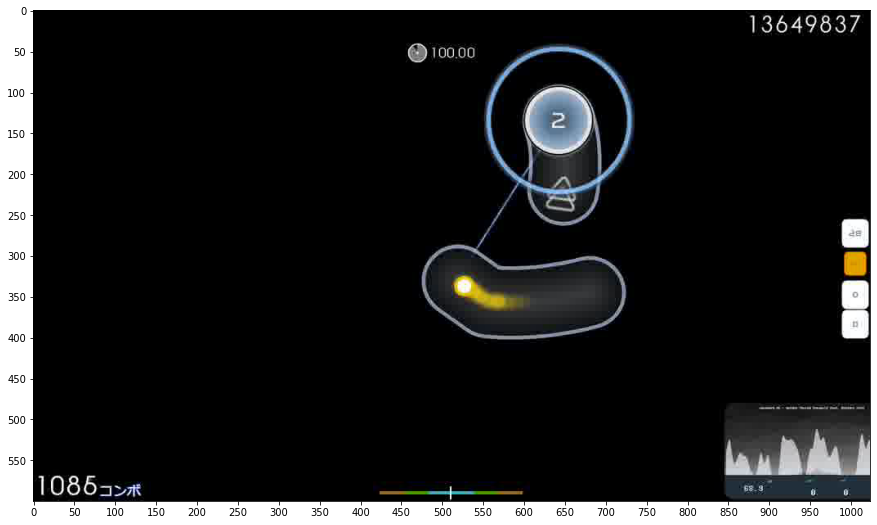

In [19]:
import matplotlib.pyplot as plt

import op

op.h = 600 / 2
op.w = 1024 / 2
op.calratio()

e = s[0]
print(e[0][0].permute(1, 2, 0).numpy().shape)

plt.rcParams["figure.figsize"] = (15, 15)

plt.xticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[1], 50))
plt.yticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[0], 50))

plt.imshow(cv2.cvtColor(e[0][0].permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
print(e[1][0][1], e[1][0][0])
print(op.cor(e[1][0][1] * 512, e[1][0][0] * 384))
#print(op.cor(e[1][0][1], e[1][0][0]))
#for x in e[1][0:10]:
    #print(op.cor(x[0], x[1]))

# Process Data

In [7]:
import time

In [7]:
ds = OSR_Dataset('../beatmaps', sample_rate=sample_rate, hop_size=hop_size, hidden_mod=1, maximum=256)

0/255 Chata - Engage (Lasse) [Insane].osu
1/255 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/255 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/255 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/255 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/255 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/255 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/255 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/255 fripSide - future gazer (TV Size) (alacat) [Insane].osu
9/255 cYsmix - bells! (Gero) [normal!].osu
10/255 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/255 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/255 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/255 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu
14/255 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu
15/255 Narushi

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 7482 in argument 0, but got NoneType


pruning: Fujijo Seitokai Shikkou-bu - Best FriendS (sahuang) [N a s y a's Insane].osu
60/255 Omoi - Chiisana Koi no Uta (Synth Rock Cover) (val0108) [Marianna's Insane].osu
61/255 Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
62/255 Nico Nico Douga - U.Nknown Goose (Borokuzu) [Insane].osu
63/255 Hatsune Miku - Moon (Saten ruiko) [Insane].osu
64/255 fripSide - black bullet (TV Size) (Chloe) [Insane].osu
65/255 Hatsune Miku - the last effect (Holoaz) [ringloid].osu
66/255 Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
67/255 REOL - Hibikase (Gero) [NiNo's Insane].osu
68/255 Kuba Oms - My Love (W h i t e) [Insane].osu
69/255 Yasuo - P - Electric Angel (- Ruby Rose -) [Insane].osu
70/255 Shimotsuki Haruka, Suzuyu - Fairy Wreath (ImpurePug) [Angraecum].osu
71/255 ClariS - Connect (TV Size) (browiec) [Mathew's Insane].osu
72/255 DIVELA feat. Hatsune Miku - BEAT SYNCER (Log Off Now) [Insane].osu
73/255 The Quick Brown Fox - The Big Black (Blue Dragon) [WHO'S AFRAID OF THE

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 6527 in argument 0, but got NoneType


75/255 toby fox - Nyeh Heh Heh! & Bonetrousle (DaxMasterix) [NORMAL].osu
76/255 ryo (supercell) - ODDS&ENDS (Short Ver.) (Betsuto) [Insane].osu
77/255 TRakker - Trail of Dust (Amamiya Yuko) [Trail of Star].osu
78/255 Police Piccadilly feat. Hatsune Miku - Kire Carry On (Sinnoh) [negusver's Insane].osu
79/255 MOSAIC.WAV - Zen Sekai Teki Touch Panel (Laurier) [CrystLer].osu
80/255 Aiobahn & Yunomi - Makuramoto ni Ghost (feat. Nicamoq) (Swan) [Swan's Melanzana].osu
81/255 Camellia - Routing (Shiirn) [pishi's Advanced].osu
82/255 seleP feat. Lily - Chloe-Five Decades Ago- (Duftende Pizza) [V].osu
83/255 dj TAKA - quaver (Monstrata) [Haru's Insane].osu
84/255 Silver Forest Feat. Aki & Sakura Mayuko - Summer time Heaven -after (RVMathew) [Ojou].osu
85/255 Van Darkholme - GachiMuchi circulation (Kr0n0s23) [Thank you, sir!].osu
86/255 Ariabl'eyeS - Senkou no Furea (Kibbleru) [Redemption].osu
87/255 ATeens - Gimme! Gimme! Gimme! (Nightcore Mix) (ShadowSoul) [Gimme!].osu
88/255 Tomoe Tamiyasu - 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 512 in argument 0, but got NoneType


pruning: Tomoe Tamiyasu - Yamato Nadeshiko Hanakotoba (Lasse) [Insane].osu
89/255 Masayoshi Minoshima ft. nomico - Bad Apple!! (Ephemeral) [Normal].osu
90/255 solfa feat. Shimotsuki Haruka - Natsuiro Ramune (Lasse) [Bariton's Insane].osu
91/255 Nakagawa Shouko - Sorairo Days (Rizen) [Fizz's Insane].osu
92/255 LeaF - Calamity Fortune (Arphimigon) [BOOM].osu
93/255 cillia - Fairytale, (SkinnyJommy) [Pho's Insane].osu
94/255 Lindsey Stirling - Senbonzakura (MrSergio) [Insane].osu
95/255 Hatsune Miku - Senkouhanabi Aika (val0108) [Insane].osu
96/255 Hatsune Miku - Himitsu Keisatsu (Lalarun) [Insane].osu
97/255 MISATO - Necro Fantasia (WORSTPOLACKEU) [Cheesecake's Insane].osu
98/255 a_hisa - Cheshire,s dance (Muya) [Normal].osu
99/255 Roselia - The Everlasting Guilty Crown (Underdogs) [Insane].osu
100/255 40meter-P - Mousou sketch (Noways) [Insane!].osu
101/255 sasakure.UK x DECO27 - 39 (Finshie) [Insane].osu
102/255 Chata - len (Cami) [xiqingwa's Lunatic].osu
103/255 Fractal Dreamers - Fat

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


121/255 Sawai Miku - Colorful. (Asterisk DnB Remix) (Asfand) [Vibrant].osu
122/255 Yunomi & nicamoq - Indoor Kei Nara Trackmaker (dipperbee) [TrAcK MaKeR].osu
123/255 GTA feat. Sam Bruno - Red Lips (Mendus Remix) (Euny) [Natsu's Insane].osu
124/255 TrySail - Utsuroi (Short Ver.) (Log Off Now) [Nexus' Insane].osu
125/255 ZAQ - Seven Doors (eINess) [wkyik's Insane].osu
126/255 M2U - Stellar (Ultima Fox) [defiance's Insane].osu
127/255 SawanoHiroyuki[nZk]mizuki - aLIEz (jonathanlfj) [Trust's Normal].osu
128/255 YOASOBI - Yoru ni Kakeru (Petal) [Keirelia's Insane].osu
129/255 Usada Pekora - Discommunication Alien (Yugu) [XLT's Insane].osu
130/255 EastNewSound - Sadistic Paranoia (TicClick) [Vass-RJ's Hard].osu
131/255 Sound Souler - Paradise (kwk) [Mir's Insane].osu
132/255 Hatsune Miku - Subarashii Sekai (val0108) [Insane].osu
133/255 AAAA - carnation (Veridian) [noffy's normal].osu
134/255 Kamogawa rokkaazu (CVKubota Kaoru) - STONES (Pata-Mon) [GDInsane [placeholder]].osu
135/255 UNISON 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


175/255 petit milady - Koi wa Milk Tea (Okoratu) [Normal].osu
176/255 Dark PHOENiX - Taketori Hishou (KanbeKotori) [Extra].osu
177/255 Mili - Origin (TV Size) (Ryuusei Aika) [kanor's Insane].osu
178/255 Hanataba - Night of Knights (v2b) [Normal].osu
179/255 Sagara Kokoro - Hoshizora no Ima (Star Stream) [Insane].osu
180/255 Hanatan - Uta ni Katachi wa Nai keredo (Asahina Momoko) [Recollection].osu
181/255 PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
pruning: PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
182/255 Yoko Takahashi - Zankoku Na Tenshi No These (TV. Size Version) (moph) [Ambient's Insane].osu
183/255 Noboru ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [ShiraHoki's Light Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


184/255 Chitose Sara - Arcadia (Short ver.) (Riven) [-Tochi's Insane].osu
185/255 eyemedia - Bloody Purity (tsuka) [Normal].osu
pruning: eyemedia - Bloody Purity (tsuka) [Normal].osu
186/255 Atoguru - Itoshi Kimi wo Mitsuke ni (Pizza Kun) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


187/255 Hanasaka Yui(CV M.A.O) - Harumachi Clover (Naotoshi) [Light Insane].osu
188/255 Hatsune Miku - Ephemeral (Wishkey) [Fade Away].osu
189/255 emon - shake it! (kosiga) [Normal].osu
190/255 Suzuki Konomi - This game (TV Size) (Sekai-nyan) [Nyquill's Insane Game].osu
191/255 Warak - REANIMATE (iyasine) [xsrs's Extra].osu
192/255 Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu
193/255 Kuroneko Dungeon - Ryoushi no Umi no Lindwurm (Crystal) [ak74's Insane].osu
194/255 Feint - Reprise (Secretpipe) [Sieg's Light Insane].osu
195/255 Umetora - Ifuudoudou (Nymph) [Insane].osu
196/255 Hana - Kuukirikigaku Shoujo to Shounen no Uta (Soleily Remix) (Koiyuki) [Yuki].osu
197/255 wowaka - Unknown Mother-Goose feat. Hatsune Miku (tutuhaha) [Insane].osu
198/255 Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
199/255 paraoka feat. harunya & amane - Trickstar (lahphnya) [Insane].osu
200/255 Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Normal].osu
201/255 rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu
202/255 Yooh - MariannE (Yogurtt) [Extra].osu
203/255 Various Artists - IIDX collection (N a s y a) [V3].osu
204/255 CHiCO with HoneyWorks - Heart no Shuchou (Sotarks) [Yuitarks' Insane].osu
205/255 Demetori - Fall of Fall ~ The Door Into Summer (jonathanlfj) [Extra Stage].osu
206/255 u's - Baby Maybe Koi no Button (Asterisk DnB Remix) (jeydude) [Love Live!].osu
207/255 ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
pruning: ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
208/255 Chiyoko - Baby Fantastic! -Short ver.- (Zweib) [iMage's Insane].osu
209/255 Apocalyptica - Rage of Poseidon (pishifat) [Extreme].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


210/255 fripSide - snow blind -after- (Mordred) [Tears Like Snowflakes].osu
211/255 ryo (supercell) feat.Hatsune Miku - Tsumi no Namae (Monstrata) [Blooming].osu
212/255 Uehara Rena - Todokanai Koi '13 (TV EDIT) (Sellenite) [Rewrite].osu
213/255 Giga-P - LUVORATORRRRRY! (Selisi) [Insane].osu
214/255 Barbarian On The Groove feat. Takizawa Ichiru - Yoi ni Kanawazu (Shurelia) [Hard].osu
215/255 livetune feat.Hatsune Miku - Last Night, Good Night (Autumn) [Oyasumi].osu
216/255 MiddleIsland - Achromat (zxhzxhz) [Insane].osu
217/255 Tamura Yukari - MERRY MERRY MERRY MENU... Ne! (moonlightleaf) [wkyik's Insane].osu
218/255 Dreamcatcher - YOU AND I (Natsu) [Insane].osu
219/255 M2U - Dual Fractal (Hailie) [Insane].osu
220/255 EGOIST - Namae no Nai Kaibutsu (LunarSakuya) [lfj's Insane].osu
221/255 ginkiha - dawn(ginkiha hardcore remix) (Aka) [Kyubey's Insane].osu
222/255 seleP - Remember me (Avishay) [A's Extra].osu
223/255 Kano - Stella-rium (Kowari) [Insane].osu
224/255 IOSYS - Hakurei Jinja (

In [8]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

0.0817873477935791 secs


# Load Daaset

In [7]:
ds = torch.load(ds_path)

# Model

In [8]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as nnF

from attention.attention import SpatialAttn, ProjectorBlock

In [9]:
class VN(nn.Module):
    def __init__(self, dim_in, device):
        super(VN, self).__init__()
        
        self.device = device
        self.lstmA_size = 256
        self.lstmA_layers = 2
        self.dim_out = 2
        
        #self.convA1 = nn.Conv3d(1, 1, (3, 1, 1), stride=1, padding=0)
        self.convB1 = nn.Conv2d(1, 4, 3, stride=1, padding=1) 
        self.maxPB1 = nn.MaxPool2d(3, stride=2, padding=1)

        self.convC1 = nn.Conv2d(4, 8, 3, stride=1, padding=1) 
        self.maxPC1 = nn.MaxPool2d(3, stride=2, padding=1)
        
        #self.linear1 = nn.Linear(19456, 1024)
       
        self.lstmA = nn.LSTM(19456, hidden_size=self.lstmA_size, num_layers=self.lstmA_layers,
                             batch_first=True, bidirectional=False)
        self.linearA = nn.Linear(self.lstmA_size, self.lstmA_size)
        self.linearB = nn.Linear(self.lstmA_size, 32)
        self.linearC = nn.Linear(32, self.dim_out)
        
        self.hiddenA = None
        
    def _make_layer(self, in_features, out_features, blocks, pool=False):
        layers = []
        for i in range(blocks):
            conv2d = nn.Conv2d(in_channels=in_features, out_channels=out_features, kernel_size=3, padding=1, bias=False)
            layers += [conv2d, nn.BatchNorm2d(out_features), nn.ReLU(inplace=True)]
            in_features = out_features
            if pool:
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        return nn.Sequential(*layers)
        
    def init_hidden(self, batch_size):
        h = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        c = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        self.hiddenA = (h, c)
 
    def forward(self, x):
        s = x.shape
        x = torch.reshape(x, (s[0] * s[1], s[2], s[3], s[4]))
        
        #x = x.unsqueeze(1)
        #x = self.convA1(x)
        #x = nnF.relu(x)
        #x = x.squeeze(1)
        x = self.convB1(x)
        x = nnF.relu(x)
        x = self.maxPB1(x)
        x = self.convC1(x)
        x = nnF.relu(x)
        x = self.maxPC1(x)
        
        x = torch.flatten(x, start_dim=1)
        x = torch.reshape(x, (s[0], s[1], x.shape[-1]))
        
        #x = self.linear1(x)
        
        x, self.hiddenA = self.lstmA(x, self.hiddenA)
        x = self.linearA(x)
        x = nnF.relu(x)
        x = self.linearB(x)
        x = nnF.relu(x)
        x = self.linearC(x)
        
        return x

# Training

In [10]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt
import op

In [11]:
batch_size = 1
scale = 1/4
dim_in = (int(600 * scale), int(1024 * scale))
seq_dur = 2

In [12]:
device = torch.device('cuda')

In [13]:
epoch_cum = 0
best_loss = 9999
best_weights = None
val_hist = []
train_hist = []
vn = VN(dim_in=dim_in, device=device)
vn.to(device)

VN(
  (convB1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convC1): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPC1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(19456, 256, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=256, out_features=256, bias=True)
  (linearB): Linear(in_features=256, out_features=32, bias=True)
  (linearC): Linear(in_features=32, out_features=2, bias=True)
)

In [14]:
vn.init_hidden(1)
summary(vn, input_size=(1, 1, 1, dim_in[0], dim_in[1]), col_width=16,
           col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
VN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 150, 256] [1, 4, 150, 256] 40               [1, 4, 3, 3]     1,536,000
├─MaxPool2d: 1-2                         [1, 4, 150, 256] [1, 4, 75, 128]  --               --               --
├─Conv2d: 1-3                            [1, 4, 75, 128]  [1, 8, 75, 128]  296              [4, 8, 3, 3]     2,841,600
├─MaxPool2d: 1-4                         [1, 8, 75, 128]  [1, 8, 38, 64]   --               --               --
├─LSTM: 1-5                              [1, 1, 19456]    [1, 1, 256]      20,713,472       --               20,713,472
├─Linear: 1-6                            [1, 1, 256]      [1, 1, 256]      65,792           [256, 256]       65,792
├─Linear: 1-7                            [1, 1, 256]      [1, 1, 32]   

In [15]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

In [16]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(vn.parameters(), lr=0.001)

In [17]:
op.h = dim_in[0]
op.w = dim_in[1]
op.calratio()

def trainVN():
    global epoch_cum
    global best_loss, best_weights
    global v, c, PV, pv, g, gt, MP, MC
    
    print(1, 'of', epochs+epoch_cum)    
    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for i, (v, c) in enumerate(val_ldr):
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss = criterion(PV, C[:,:,:2])
            val_loss += loss.item()
            print("\r                                                           ", end="\r")
            print("\rval:", str(i) + '/' + str(len(val_ds)), "loss:", f'{loss.item():.4f}', end="\r")
        print('')

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 3)
        
        e = v[0][-32].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[1] * 512, pv[0] * 384)
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[1] * 512, gt[0] * 384)
        p[1].set_xlim([0, 512])
        p[1].set_ylim([-128, 384])
        p[1].invert_yaxis()
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        plt.show()
        
        print("\n", epoch+epoch_cum+1, 'of', epochs+epoch_cum)

        if val_loss < best_loss:
            best_loss = val_loss
            best_weights = vn.state_dict().copy()

    epoch_cum += epochs

In [18]:
def trainVNRecurse():
    global epoch_cum
    global best_loss, best_weights
    global v, c, PV, pv, g, gt, MP, MC

    loss_avg = 1
    print(1, 'of', epochs+epoch_cum)
    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        rv = []
        rc = []
        tloss = []
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            tloss.append(loss.item())
            if loss.item() > loss_avg+loss_thresh:
                if torch.max(c[:,:2]) > 0:
                    rv.append(v)
                    rc.append(c)
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})    
        loss_avg = train_loss/len(train_ldr)
        print('avg:', loss_avg)
        
        i = 0
        print('outliers:', len(rc))
        while len(rc) > rnum_min:
            if i >= len(rc):
                i = 0
            V, C = rv[i].to(device), rc[i].to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            if loss.item() < loss_avg+loss_thresh:
                del rc[i]
                del rv[i]
            else:
                i += 1
            print("\r                           ", end="\r")
            print("\rretrain:", len(rc), end='')
        print('')

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for i, (v, c) in enumerate(val_ldr):
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss = criterion(PV, C[:,:,:2])
            val_loss += loss.item()
            print("\r                                                           ", end="\r")
            print("\rval:", str(i+1) + '/' + str(len(val_ds)), "loss:", f'{loss.item():.4f}', end="\r")
        print('')

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 4)
        
        e = v[0][-32].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[1] * 512, pv[0] * 384)
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[1] * 512, gt[0] * 384)
        p[1].set_xlim([0, 512])
        p[1].set_ylim([-128, 384])
        p[1].invert_yaxis()
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        p[3].plot(tloss)
        plt.show()
        
        print("\n", epoch+epoch_cum+1, 'of', epochs+epoch_cum)
        
        if val_loss < best_loss:
            best_loss = val_loss
            best_weights = vn.state_dict().copy()
    epoch_cum += epochs

1 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0139                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0073                                    
pred: 0.29942962527275085 0.34138765931129456
gt: 0.40554043650627136 0.533042311668396
(110, 79)


<Figure size 1080x360 with 0 Axes>

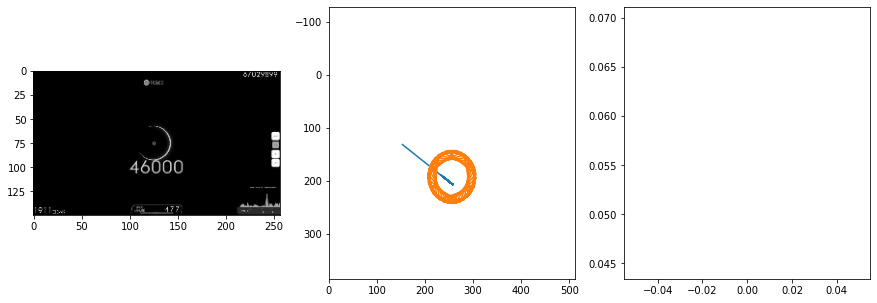


 1 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0134                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0237                                    
pred: 0.31628745794296265 0.5408613681793213
gt: 0.25784724950790405 0.5364894866943359
(87, 80)


<Figure size 1080x360 with 0 Axes>

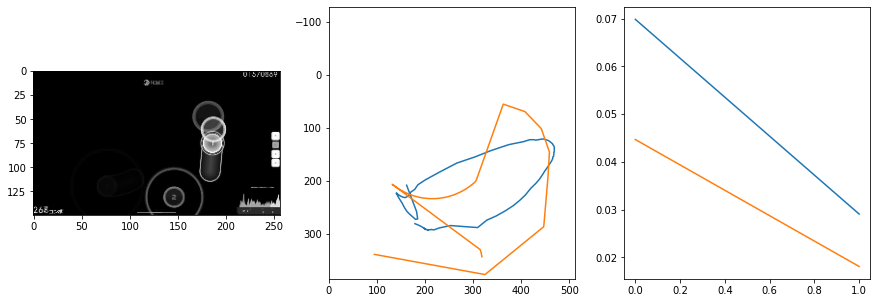


 2 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0105                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0433                                    
pred: 0.5314263105392456 0.5487083196640015
gt: 0.31504324078559875 0.780137300491333
(96, 108)


<Figure size 1080x360 with 0 Axes>

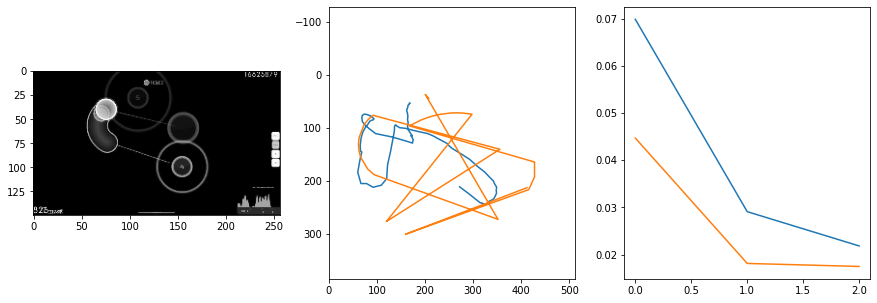


 3 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0090                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0169                                    
pred: 0.6283590197563171 0.3453563451766968
gt: 0.642578125 0.5833333134651184
(147, 85)


<Figure size 1080x360 with 0 Axes>

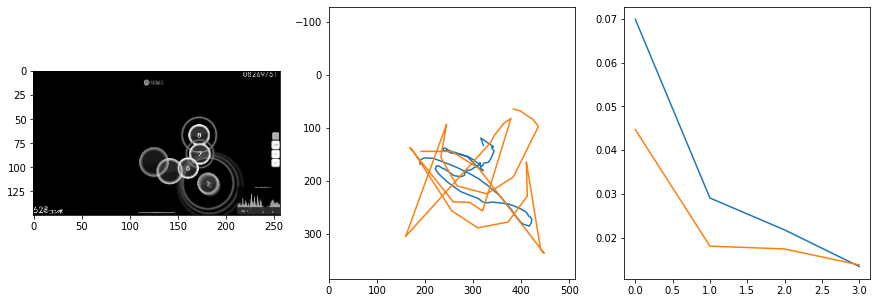


 4 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0078                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0087                                    
pred: 0.35614392161369324 0.695876955986023
gt: 0.3776015341281891 0.8334913849830627
(106, 114)


<Figure size 1080x360 with 0 Axes>

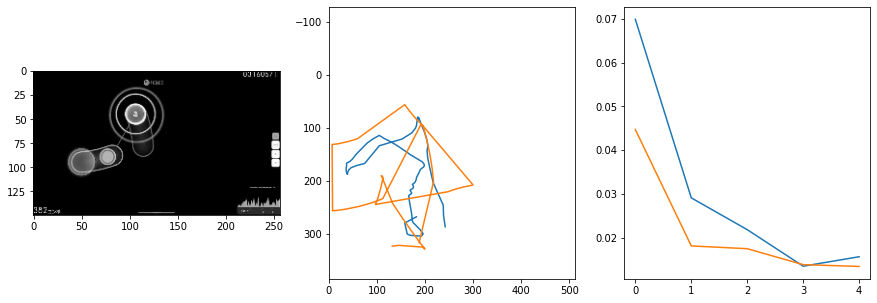


 5 of 6


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0072                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

val: 49/50 loss: 0.0037                                    
pred: 0.4913269281387329 0.28104349970817566
gt: 0.6894530653953552 0.36458325386047363
(154, 60)


<Figure size 1080x360 with 0 Axes>

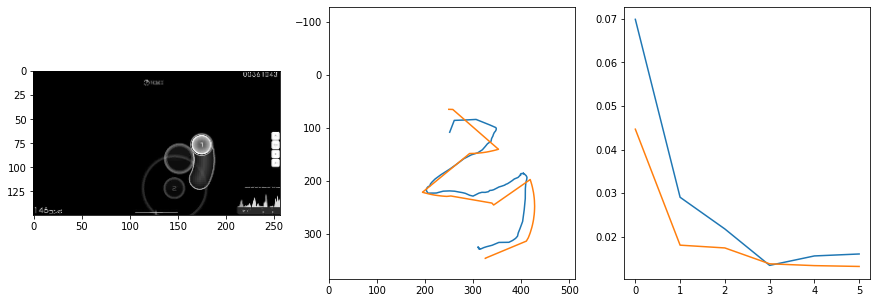


 6 of 6
189.59046506881714 secs


In [19]:
start = time.time()

epochs = 6
trainVN()

end = time.time()
print(end - start, 'secs')

In [20]:
train_hist = []
val_hist = []

1 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0177                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.014453674077230971
outliers: 0

val: 50/50 loss: 0.0049                                    
pred: 0.6103943586349487 0.5791898369789124
gt: 0.6305975914001465 0.591654360294342
(145, 86)


<Figure size 1080x360 with 0 Axes>

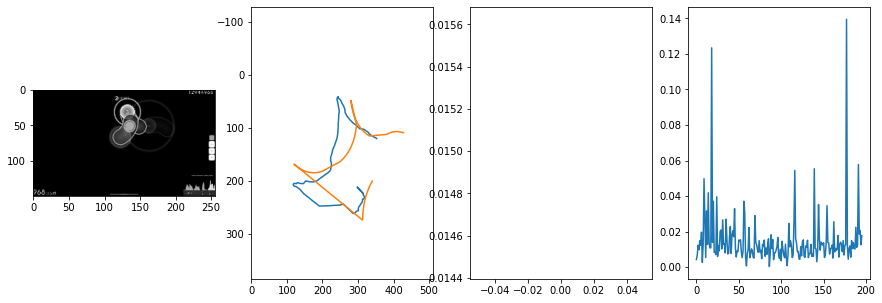


 7 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0073                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.016911371154900715
outliers: 72
retrain: 8                 
val: 50/50 loss: 0.0099                                    
pred: 0.925154447555542 0.558810830116272
gt: 0.9375 0.3151041567325592
(193, 54)


<Figure size 1080x360 with 0 Axes>

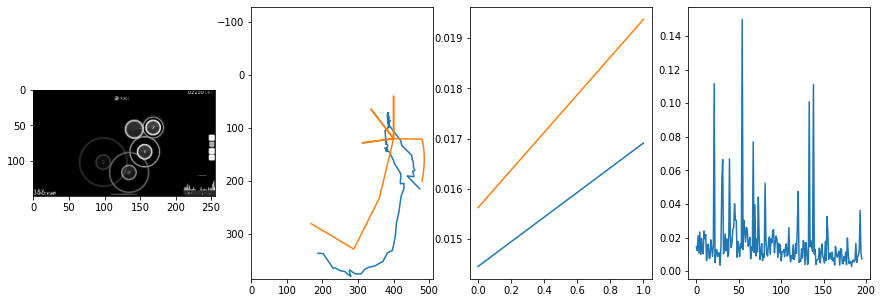


 8 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.81it/s  0.0190                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011373037383273929
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0067                                    
pred: 0.24918022751808167 0.6189380288124084
gt: 0.364249587059021 0.7716080546379089
(104, 107)


<Figure size 1080x360 with 0 Axes>

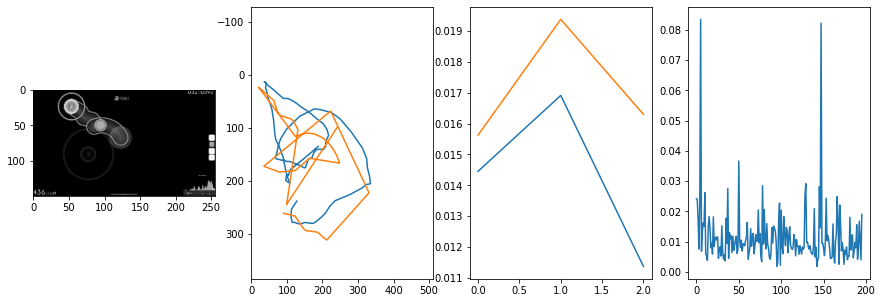


 9 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.79it/s  0.0040                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010464757093470735
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0431                                    
pred: 0.41799455881118774 0.35717687010765076
gt: 0.4999953508377075 0.5000054836273193
(125, 76)


<Figure size 1080x360 with 0 Axes>

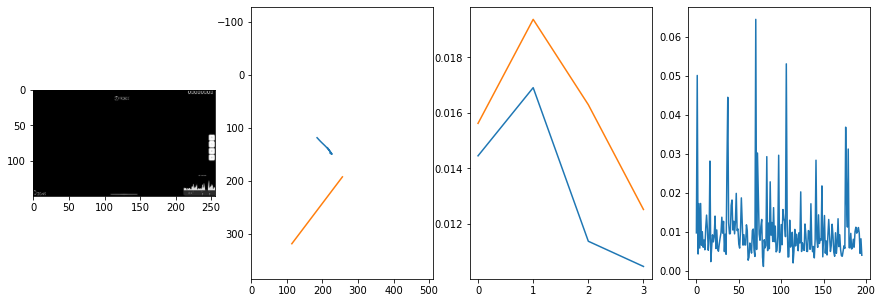


 10 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.69it/s  0.0051                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.013760234134827683
outliers: 79
retrain: 8                 
val: 50/50 loss: 0.0222                                    
pred: 0.4416615962982178 0.756005585193634
gt: 0.15638159215450287 0.6805789470672607
(72, 97)


<Figure size 1080x360 with 0 Axes>

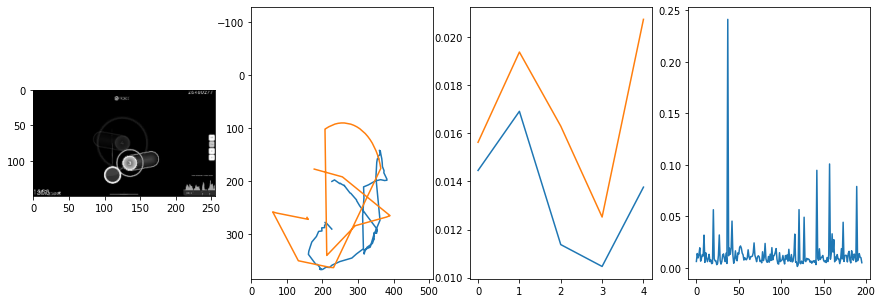


 11 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0054                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.014372817507935497
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0120                                    
pred: 0.31509965658187866 0.7946058511734009
gt: 0.43353262543678284 0.9010059833526611
(115, 122)


<Figure size 1080x360 with 0 Axes>

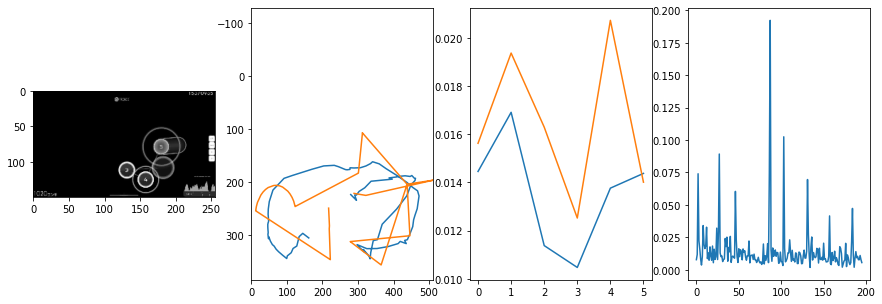


 12 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0190                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012577965371524535
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0103                                    
pred: 0.48665621876716614 0.3929350972175598
gt: 0.5390625 0.7083333134651184
(131, 100)


<Figure size 1080x360 with 0 Axes>

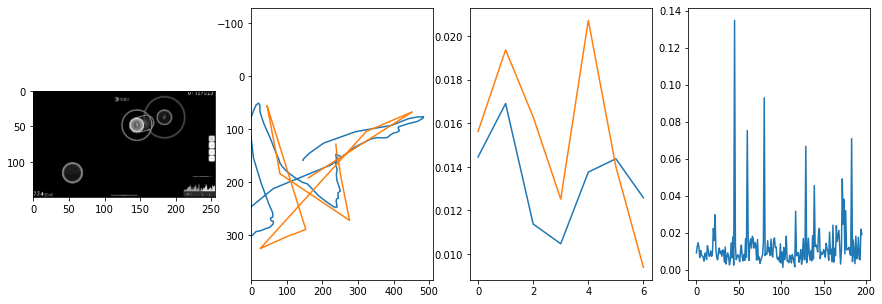


 13 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0080                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0132261775986396
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0110                                    
pred: 0.38627761602401733 0.1409362554550171
gt: 0.42479920387268066 0.09268558770418167
(113, 28)


<Figure size 1080x360 with 0 Axes>

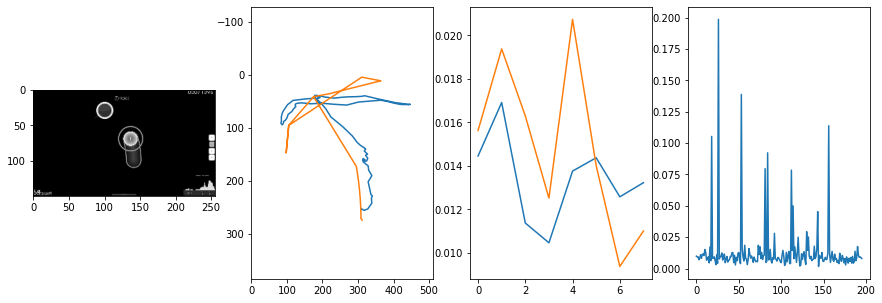


 14 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0058                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.017168043753873482
outliers: 63
retrain: 8                 
val: 50/50 loss: 0.0100                                    
pred: 0.484439492225647 0.6693987250328064
gt: 0.6647502779960632 0.542583703994751
(151, 81)


<Figure size 1080x360 with 0 Axes>

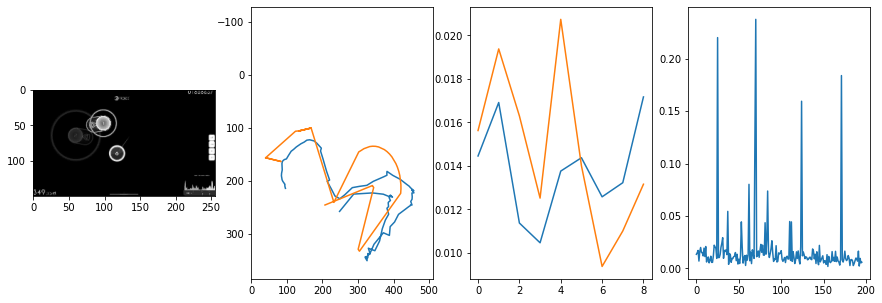


 15 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0046                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010702286944344488
outliers: 19
retrain: 8                 
val: 50/50 loss: 0.0071                                    
pred: 0.566818118095398 0.25813406705856323
gt: 0.49734774231910706 0.26567405462265015
(125, 48)


<Figure size 1080x360 with 0 Axes>

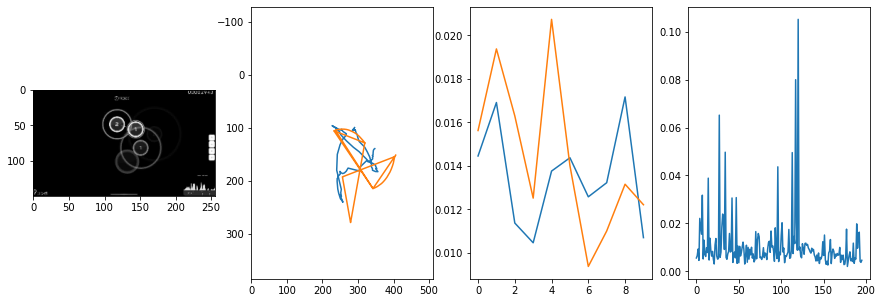


 16 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0167                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.015268621470289762
outliers: 49
retrain: 8                 
val: 50/50 loss: 0.0276                                    
pred: 0.4877973198890686 1.005464792251587
gt: 0.29920876026153564 0.4105067551136017
(94, 65)


<Figure size 1080x360 with 0 Axes>

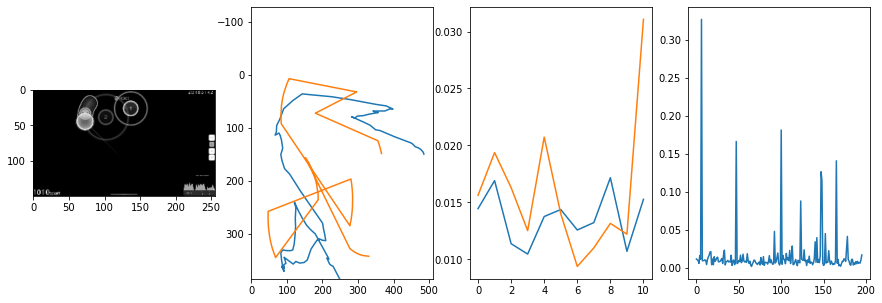


 17 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0024                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010706015793625645
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0297                                    
pred: 0.5271864533424377 0.5797213315963745
gt: 0.6158326268196106 0.7646716237068176
(143, 106)


<Figure size 1080x360 with 0 Axes>

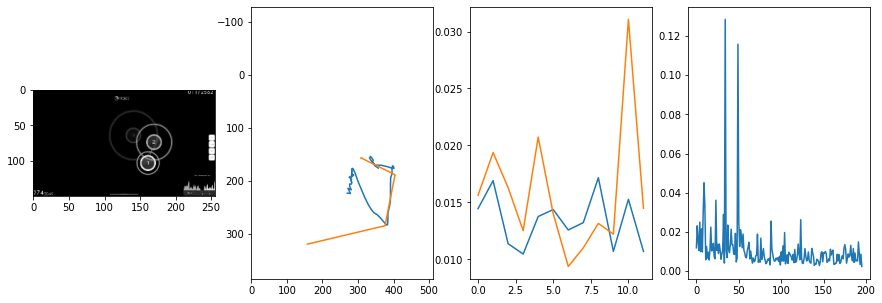


 18 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0179                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010679088258517109
outliers: 47
retrain: 8                 
val: 50/50 loss: 0.0175                                    
pred: 0.7950883507728577 0.37462741136550903
gt: 0.7661168575286865 0.228646382689476
(166, 44)


<Figure size 1080x360 with 0 Axes>

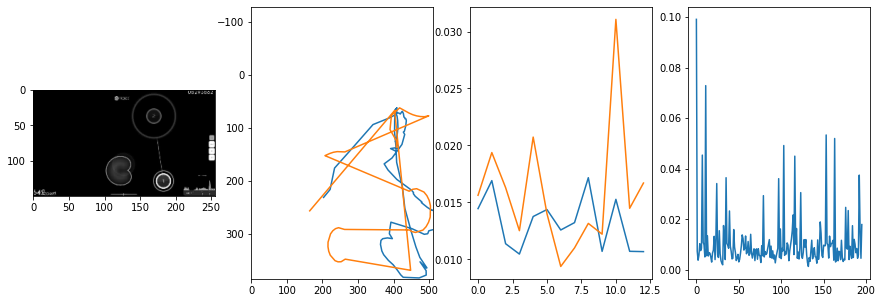


 19 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0040                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012530659163122454
outliers: 50
retrain: 8                 
val: 50/50 loss: 0.0078                                    
pred: 0.5477910041809082 0.7643260359764099
gt: 0.4042946398258209 0.7291640639305115
(110, 102)


<Figure size 1080x360 with 0 Axes>

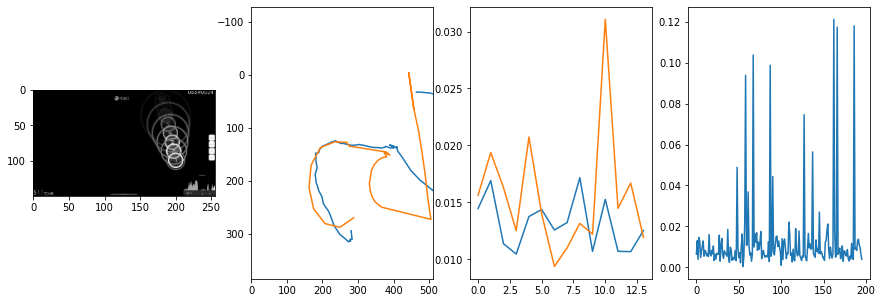


 20 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.77it/s  0.0042                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011520757321185167
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0684                                    
pred: 0.27857643365859985 0.2920423150062561
gt: 0.49999985098838806 0.5000001192092896
(125, 76)


<Figure size 1080x360 with 0 Axes>

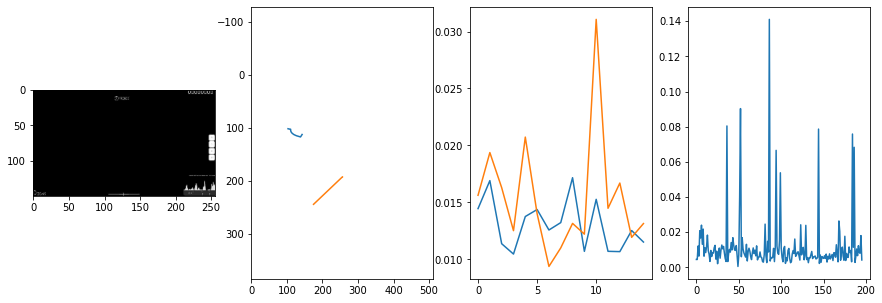


 21 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0091                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01187081103110971
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0048                                    
pred: 0.5396330952644348 0.7220633029937744
gt: 0.5916762948036194 0.7766767144203186
(139, 108)


<Figure size 1080x360 with 0 Axes>

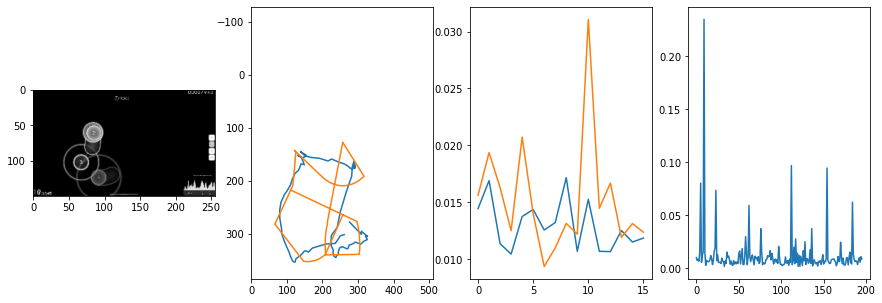


 22 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0061                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01014342113016102
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0088                                    
pred: 0.32925012707710266 0.20987115800380707
gt: 0.424670547246933 0.2485460489988327
(113, 46)


<Figure size 1080x360 with 0 Axes>

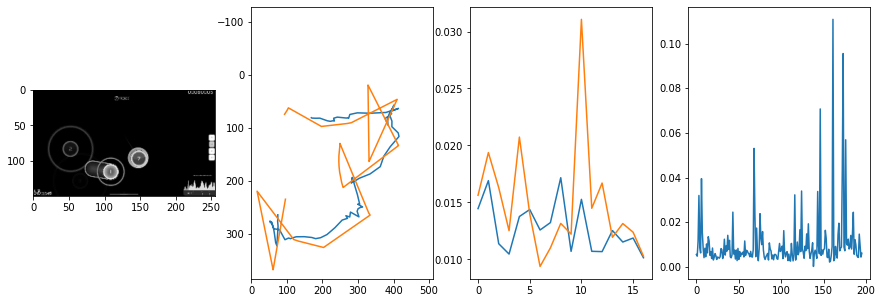


 23 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0048                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011322644257642405
outliers: 49
retrain: 8                 
val: 50/50 loss: 0.0064                                    
pred: 0.5344706177711487 0.4995056688785553
gt: 0.6506285667419434 0.4785521328449249
(148, 73)


<Figure size 1080x360 with 0 Axes>

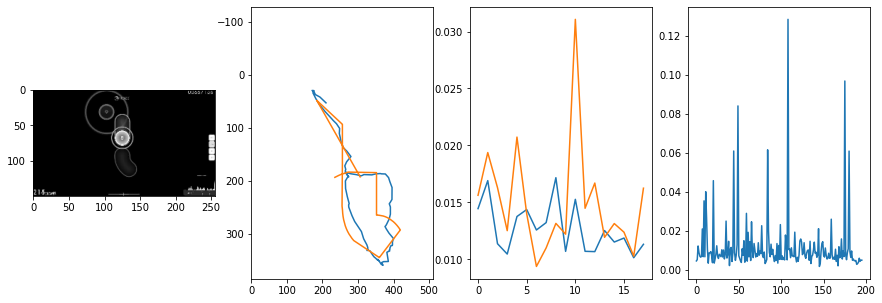


 24 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0026                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009283555262931148
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0108                                    
pred: 0.47525662183761597 0.5988976359367371
gt: 0.46865028142929077 0.8793489336967468
(120, 120)


<Figure size 1080x360 with 0 Axes>

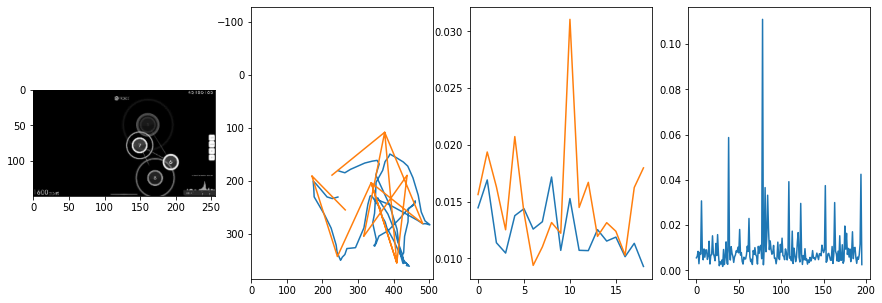


 25 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0071                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011341595235553913
outliers: 51
retrain: 8                 
val: 50/50 loss: 0.0101                                    
pred: 0.6115391850471497 0.20746560394763947
gt: 0.7816895246505737 0.15036138892173767
(169, 35)


<Figure size 1080x360 with 0 Axes>

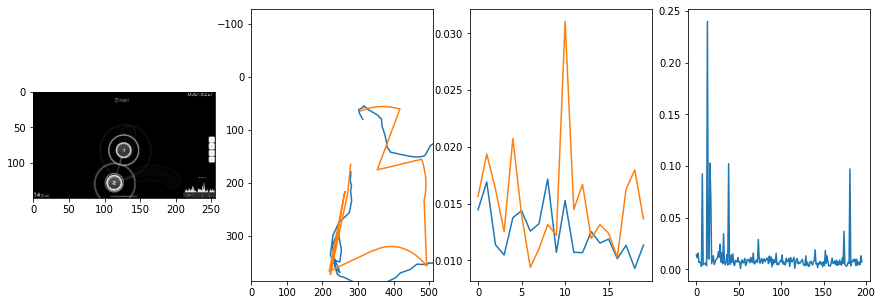


 26 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.80it/s  0.0083                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00859898583647529
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0340                                    
pred: 0.36686620116233826 0.50397127866745
gt: 0.5 0.5000000596046448
(125, 76)


<Figure size 1080x360 with 0 Axes>

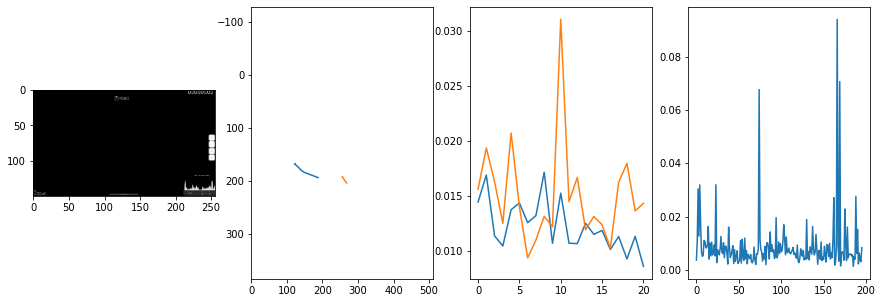


 27 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0401                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010819511943050109
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0038                                    
pred: 0.2229316383600235 0.45921415090560913
gt: 0.3706429600715637 0.5784106850624084
(105, 85)


<Figure size 1080x360 with 0 Axes>

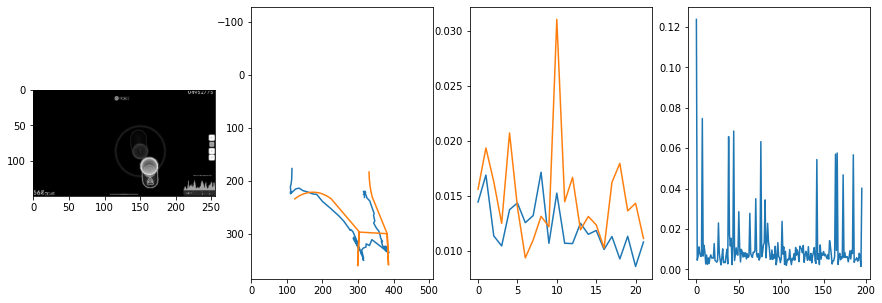


 28 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0088                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011295971569928284
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0061                                    
pred: 0.5353489518165588 0.4977565109729767
gt: 0.5441418290138245 0.6161473393440247
(132, 89)


<Figure size 1080x360 with 0 Axes>

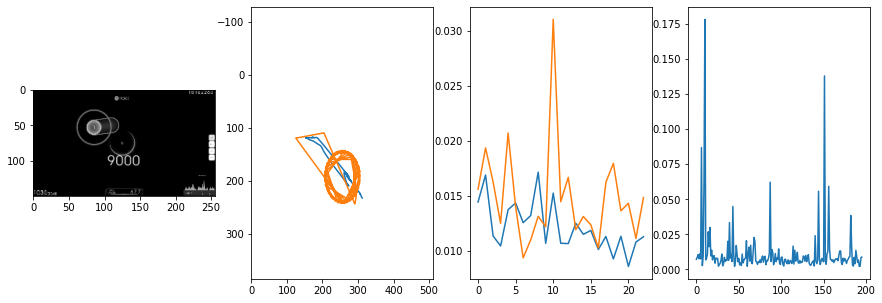


 29 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0052                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010155116754336928
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0466                                    
pred: 0.41348740458488464 0.5529483556747437
gt: 0.7822607159614563 0.15954454243183136
(169, 36)


<Figure size 1080x360 with 0 Axes>

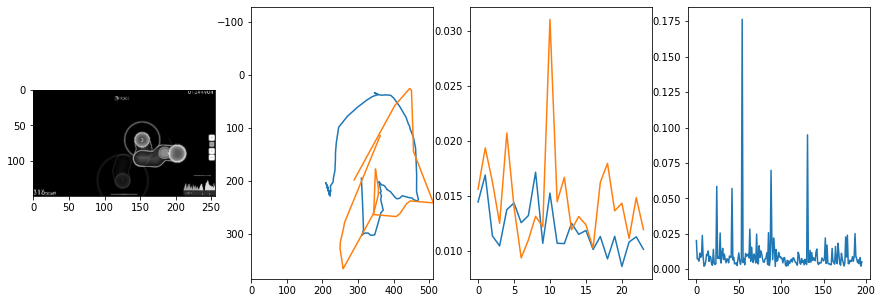


 30 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0398                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01104866146770477
outliers: 49
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.7497363686561584 0.45872676372528076
gt: 0.8409613966941833 0.3920475244522095
(178, 63)


<Figure size 1080x360 with 0 Axes>

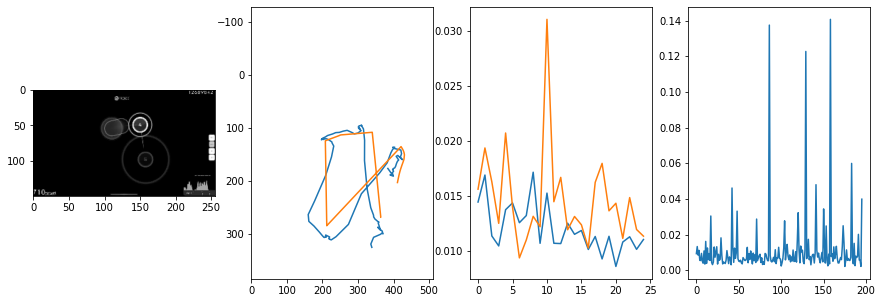


 31 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.92it/s  0.0025                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009702031665757222
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0090                                    
pred: 0.32838284969329834 0.4160226583480835
gt: 0.5753414034843445 0.10790451616048813
(137, 30)


<Figure size 1080x360 with 0 Axes>

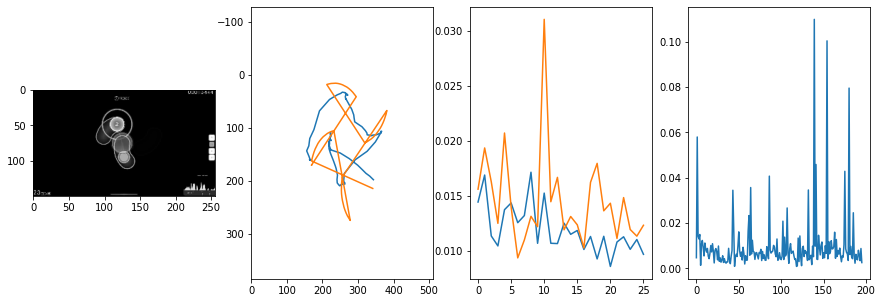


 32 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0106                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009893950645702568
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0170                                    
pred: 0.3924742043018341 0.6032630801200867
gt: 0.490234375 0.5442708134651184
(124, 81)


<Figure size 1080x360 with 0 Axes>

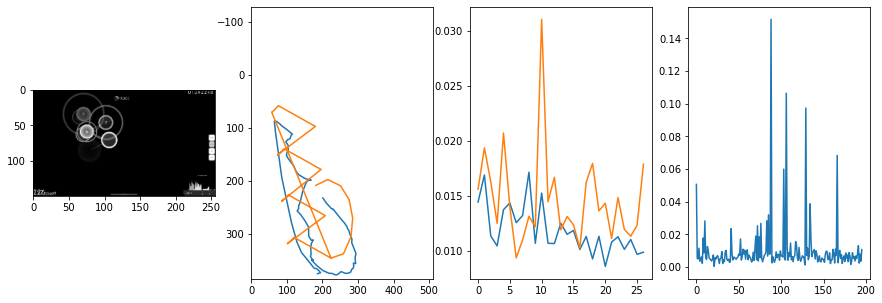


 33 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010701096764580366
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0142                                    
pred: 0.4820675253868103 0.3638274669647217
gt: 0.35738638043403625 0.4303838014602661
(103, 68)


<Figure size 1080x360 with 0 Axes>

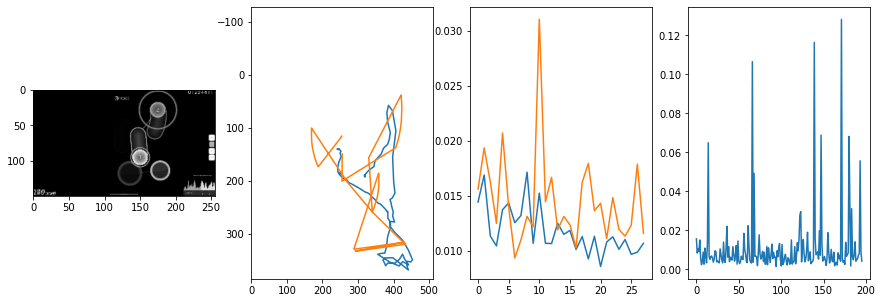


 34 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0120                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011018272545141148
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.32711365818977356 0.5977979898452759
gt: 0.28645870089530945 0.48400112986564636
(92, 74)


<Figure size 1080x360 with 0 Axes>

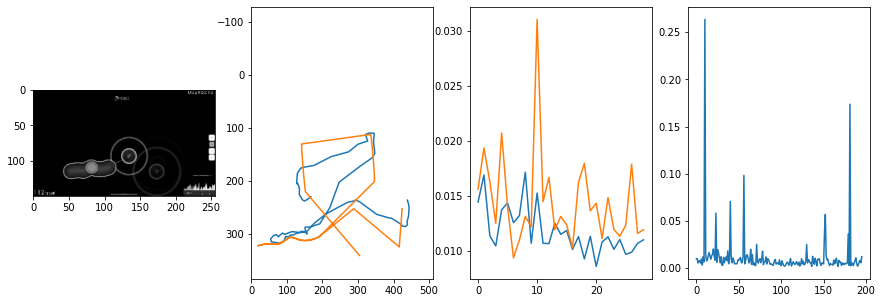


 35 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009266518529775381
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0034                                    
pred: 0.7071394920349121 0.6272201538085938
gt: 0.734375 0.7395833134651184
(161, 104)


<Figure size 1080x360 with 0 Axes>

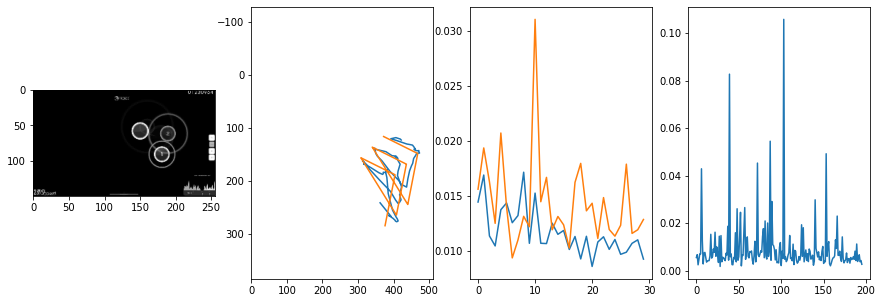


 36 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0069                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.015012827374597023
outliers: 67
retrain: 8                 
val: 50/50 loss: 0.0167                                    
pred: 0.738063633441925 0.26679912209510803
gt: 0.67578125 0.4375
(152, 68)


<Figure size 1080x360 with 0 Axes>

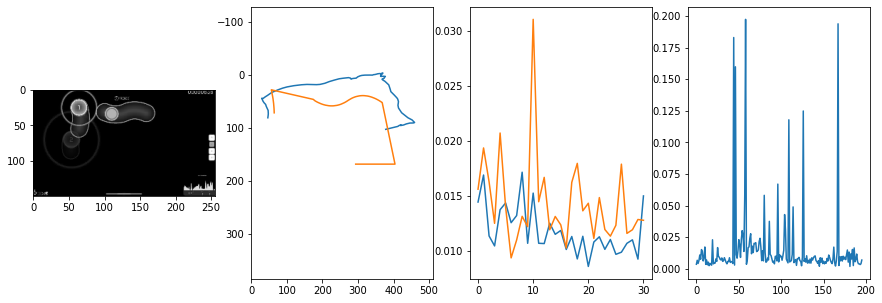


 37 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0422                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011187160774300407
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0234                                    
pred: 0.3551056683063507 0.5808145999908447
gt: 0.49526745080947876 0.7256064414978027
(124, 102)


<Figure size 1080x360 with 0 Axes>

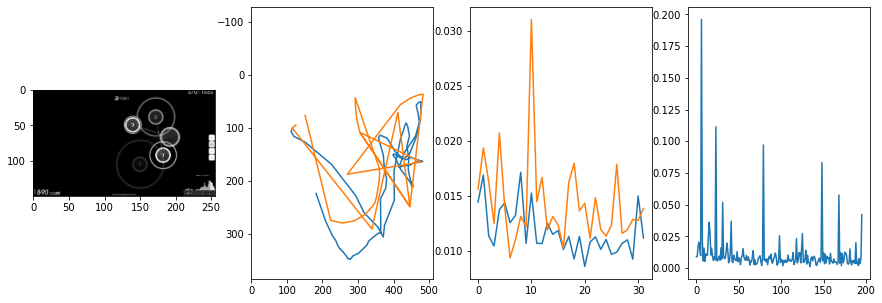


 38 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0114                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009757252762863907
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0110                                    
pred: 0.570415735244751 0.7187922596931458
gt: 0.5943514704704285 0.5316885113716125
(140, 79)


<Figure size 1080x360 with 0 Axes>

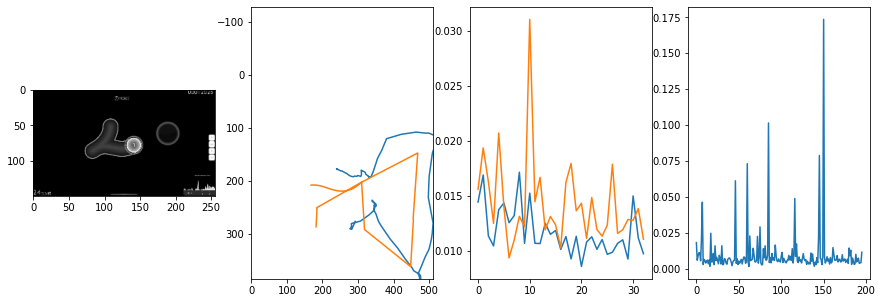


 39 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0061                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012328543476950454
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0126                                    
pred: 0.7510101795196533 0.3116629123687744
gt: 0.7471093535423279 0.33703306317329407
(163, 57)


<Figure size 1080x360 with 0 Axes>

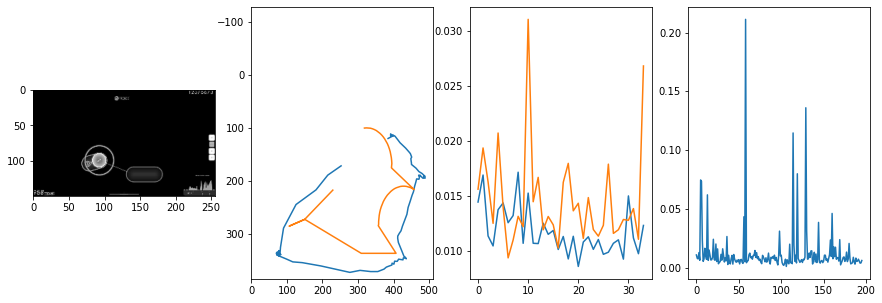


 40 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0100                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008423150806599868
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0100                                    
pred: 0.6173631548881531 0.23251576721668243
gt: 0.5977627038955688 0.4994544982910156
(140, 76)


<Figure size 1080x360 with 0 Axes>

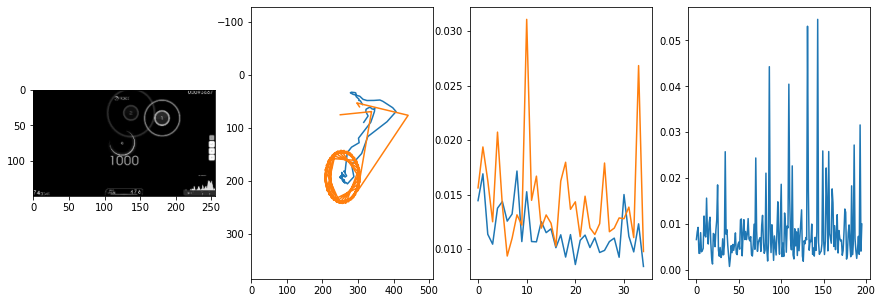


 41 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0049                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0070489299939755275
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.3835633099079132 0.4149801433086395
gt: 0.4171138405799866 0.4466313421726227
(112, 69)


<Figure size 1080x360 with 0 Axes>

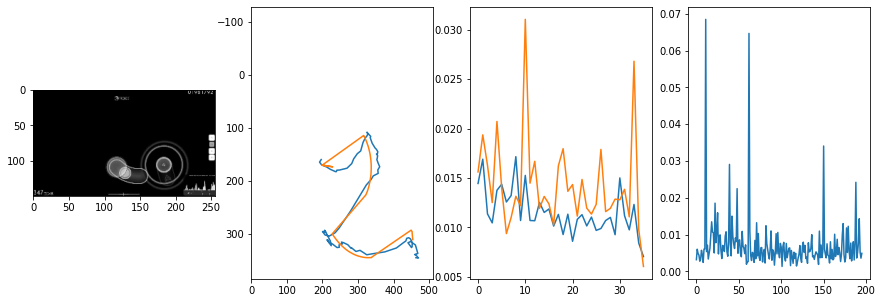


 42 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0082                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011489676392390107
outliers: 81
retrain: 8                 
val: 50/50 loss: 0.0293                                    
pred: 0.2539414167404175 0.43720829486846924
gt: 0.23797352612018585 0.47394606471061707
(84, 73)


<Figure size 1080x360 with 0 Axes>

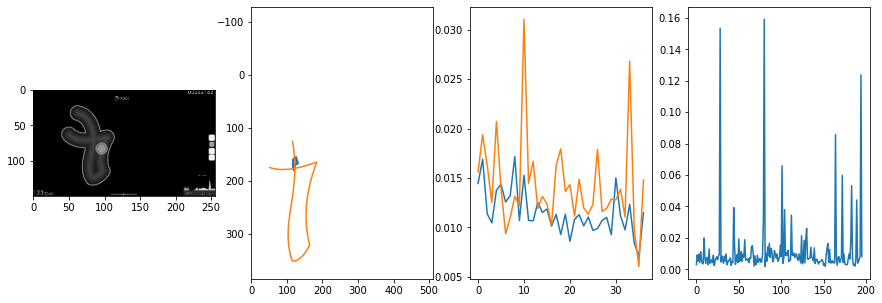


 43 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0026                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009980021266751371
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0059                                    
pred: 0.579883873462677 0.7590347528457642
gt: 0.373046875 0.90625
(105, 123)


<Figure size 1080x360 with 0 Axes>

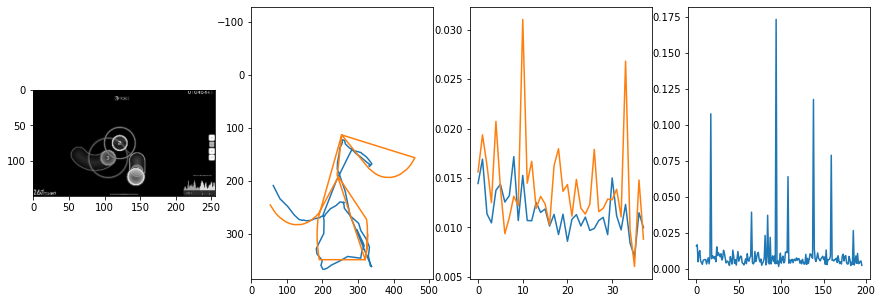


 44 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00724996434529407
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0598                                    
pred: 0.36238691210746765 0.3663579821586609
gt: 0.47672411799430847 0.6991381645202637
(121, 99)


<Figure size 1080x360 with 0 Axes>

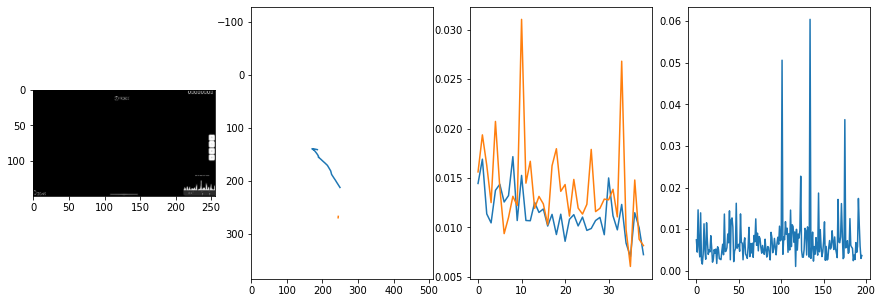


 45 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0054                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009197745109879772
outliers: 67
retrain: 8                 
val: 50/50 loss: 0.0180                                    
pred: 0.13543474674224854 0.49544069170951843
gt: 0.8198879361152649 0.19096823036670685
(175, 40)


<Figure size 1080x360 with 0 Axes>

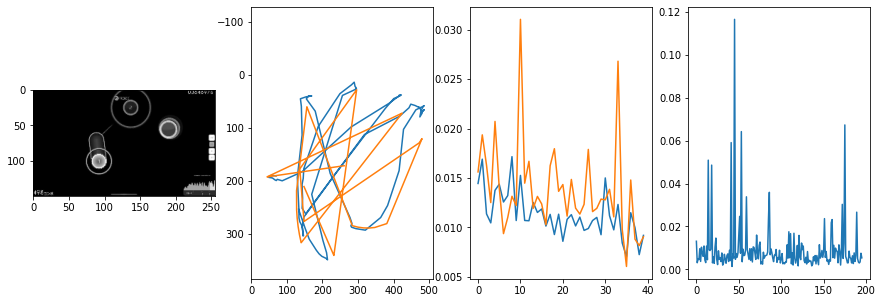


 46 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.92it/s  0.0080                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008531140583170558
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0084                                    
pred: 0.626990556716919 0.6035234928131104
gt: 0.7812438607215881 0.6041666865348816
(169, 88)


<Figure size 1080x360 with 0 Axes>

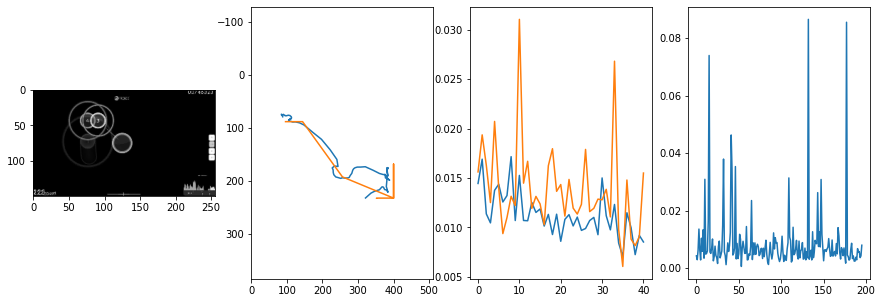


 47 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006753167536047914
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0060                                    
pred: 0.3920758068561554 0.18731087446212769
gt: 0.126953125 0.2604166567325592
(67, 48)


<Figure size 1080x360 with 0 Axes>

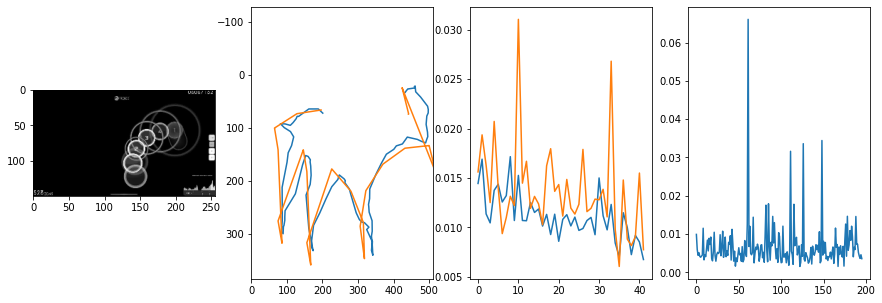


 48 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0004                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008616747575151563
outliers: 66
retrain: 8                 
val: 50/50 loss: 0.0047                                    
pred: 0.21167011559009552 0.5739375352859497
gt: 0.3047836422920227 0.5909983515739441
(95, 86)


<Figure size 1080x360 with 0 Axes>

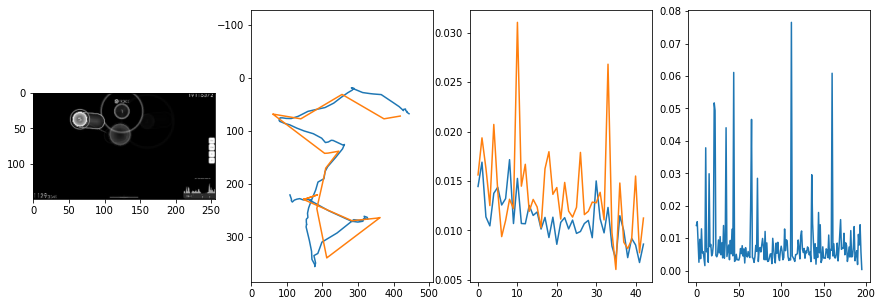


 49 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.92it/s  0.0109                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010562056392236441
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0016                                    
pred: 0.39153993129730225 0.527979850769043
gt: 0.6210940480232239 0.635417103767395
(144, 91)


<Figure size 1080x360 with 0 Axes>

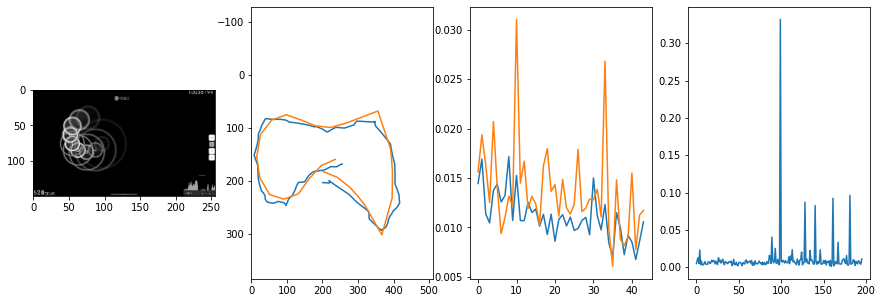


 50 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.87it/s  0.0122                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009322843473102917
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0037                                    
pred: 0.16458043456077576 0.6473320722579956
gt: 0.1015625 0.4557291567325592
(63, 71)


<Figure size 1080x360 with 0 Axes>

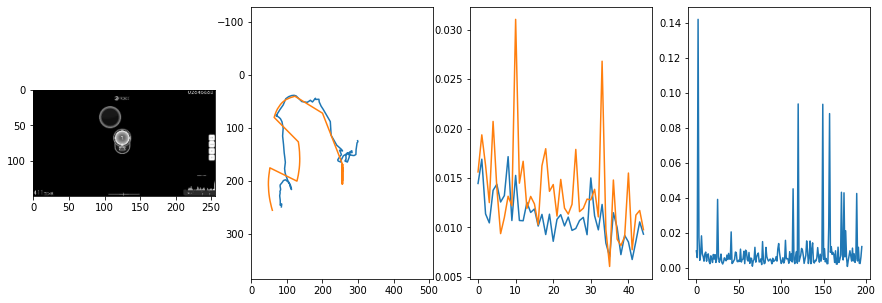


 51 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010185850265065246
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0087                                    
pred: 0.5173135995864868 0.35444575548171997
gt: 0.5 0.5890000462532043
(125, 86)


<Figure size 1080x360 with 0 Axes>

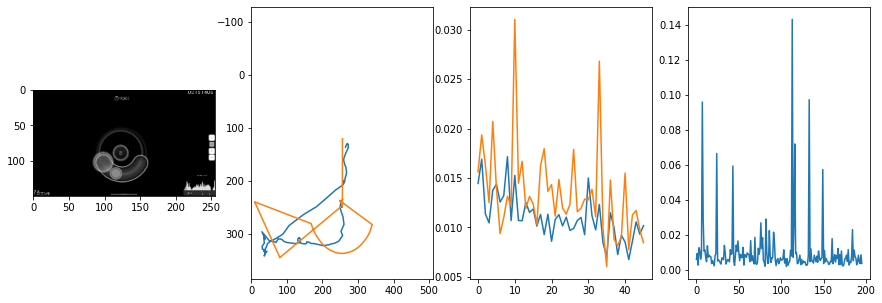


 52 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  8.00it/s  0.0065                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009686786412351708
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0164                                    
pred: 0.4225365221500397 0.6797271966934204
gt: 0.28125208616256714 0.854152262210846
(91, 117)


<Figure size 1080x360 with 0 Axes>

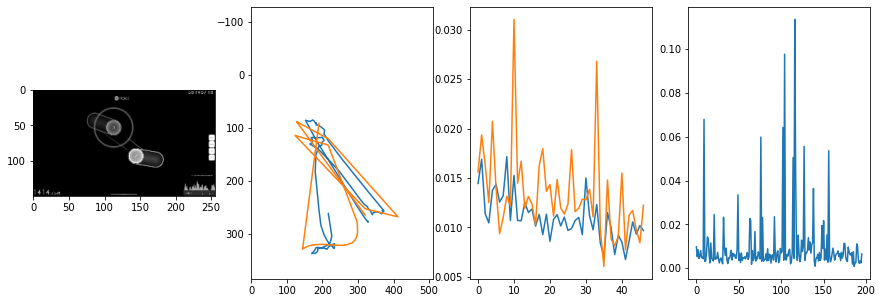


 53 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0231                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010118719196001696
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0134                                    
pred: 0.6241745352745056 0.40924450755119324
gt: 0.47506576776504517 0.5699699521064758
(121, 84)


<Figure size 1080x360 with 0 Axes>

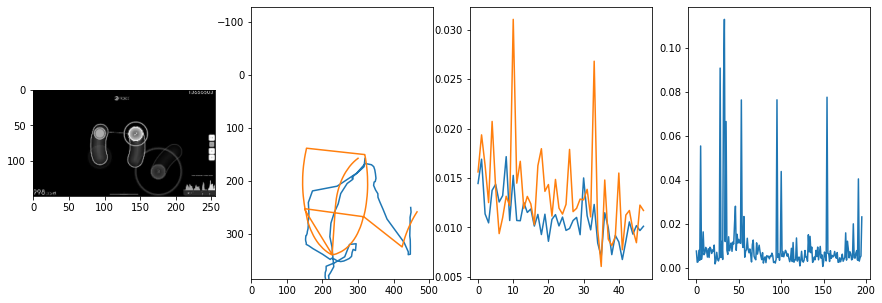


 54 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.91it/s  0.0045                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010850125780015499
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0361                                    
pred: 0.7806792855262756 0.7683690190315247
gt: 0.7095454931259155 0.24210606515407562
(158, 46)


<Figure size 1080x360 with 0 Axes>

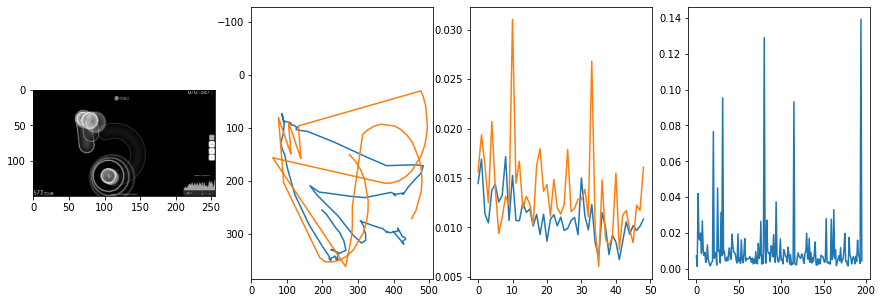


 55 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0084                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008981089337553106
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.5559029579162598 0.48440879583358765
gt: 0.5815517902374268 0.5
(138, 76)


<Figure size 1080x360 with 0 Axes>

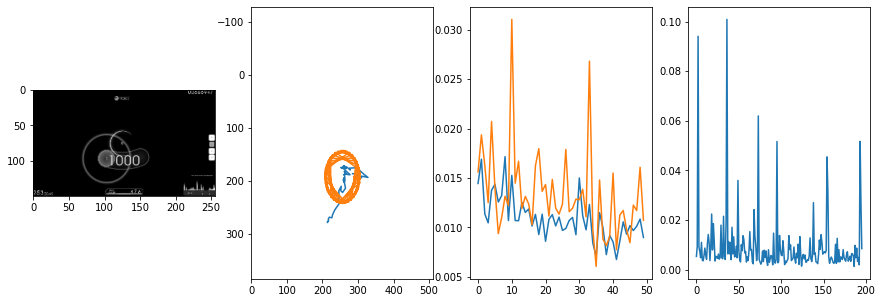


 56 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0155                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010173083778960174
outliers: 46
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.17184510827064514 0.566139817237854
gt: 0.11245661228895187 0.43347227573394775
(65, 68)


<Figure size 1080x360 with 0 Axes>

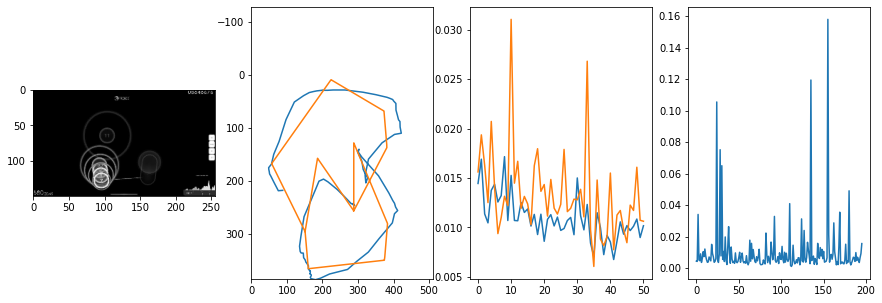


 57 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.94it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009862954239776758
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0066                                    
pred: 0.3382716178894043 0.5791192650794983
gt: 0.3342866599559784 0.7218441367149353
(99, 101)


<Figure size 1080x360 with 0 Axes>

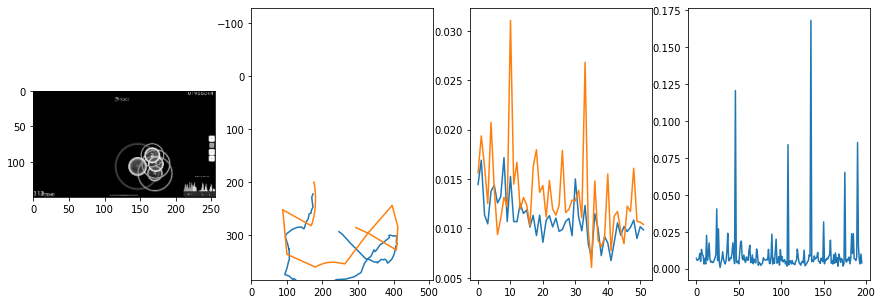


 58 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0053                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008936947775881129
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0285                                    
pred: 0.6003476977348328 0.8314712643623352
gt: 0.7499752640724182 0.7369245886802673
(164, 103)


<Figure size 1080x360 with 0 Axes>

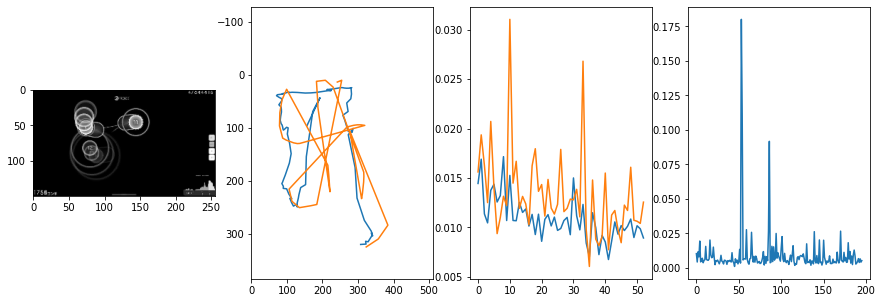


 59 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0052                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009073275093901522
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0061                                    
pred: 0.7090778350830078 0.873278796672821
gt: 0.6328129172325134 0.7682292461395264
(146, 107)


<Figure size 1080x360 with 0 Axes>

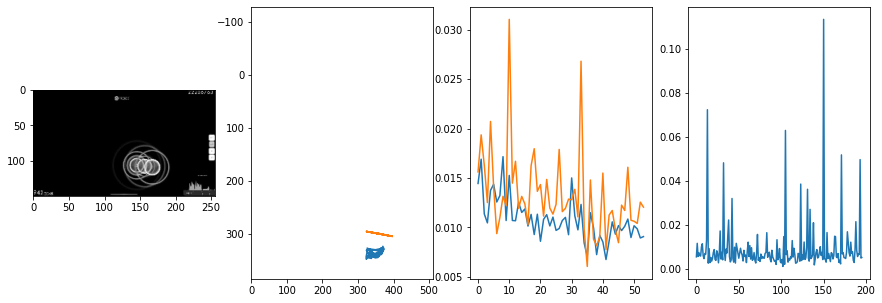


 60 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.92it/s  0.0078                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008013957831652227
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0222                                    
pred: 0.37002068758010864 0.38689306378364563
gt: 0.59765625 0.5
(140, 76)


<Figure size 1080x360 with 0 Axes>

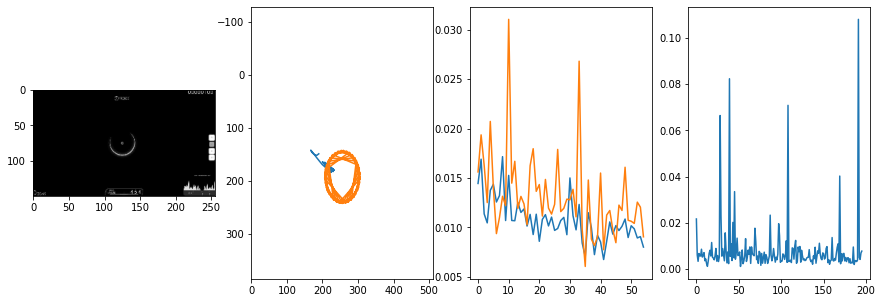


 61 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009656380614912023
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0053                                    
pred: 0.7016405463218689 0.35068923234939575
gt: 0.650390625 0.6848958134651184
(148, 97)


<Figure size 1080x360 with 0 Axes>

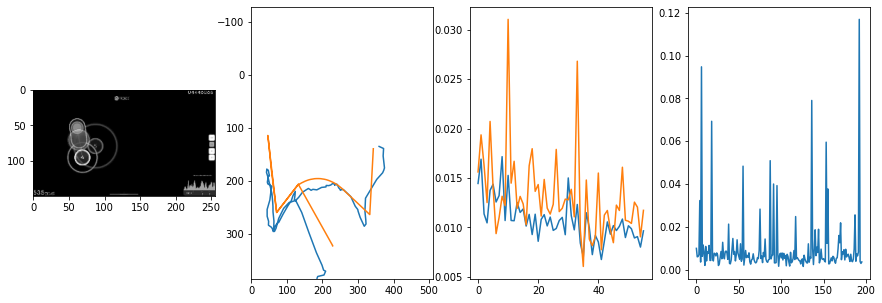


 62 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.84it/s  0.0047                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007329633875217821
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0059                                    
pred: 0.7545382976531982 0.2724706828594208
gt: 0.8164045810699463 0.36459115147590637
(174, 60)


<Figure size 1080x360 with 0 Axes>

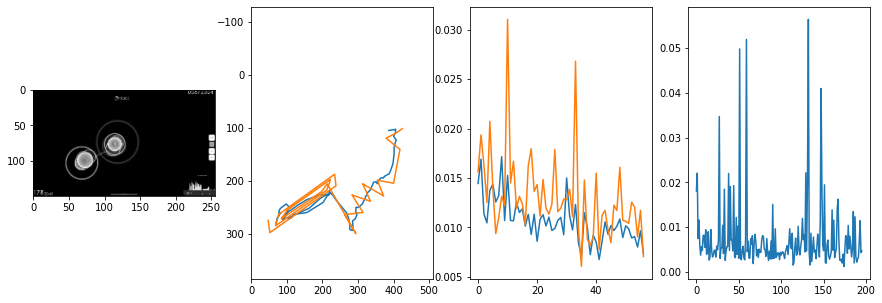


 63 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01292478485919098
outliers: 58
retrain: 8                 
val: 50/50 loss: 0.0078                                    
pred: 0.8880944848060608 0.6699392795562744
gt: 0.865234375 0.30211225152015686
(182, 53)


<Figure size 1080x360 with 0 Axes>

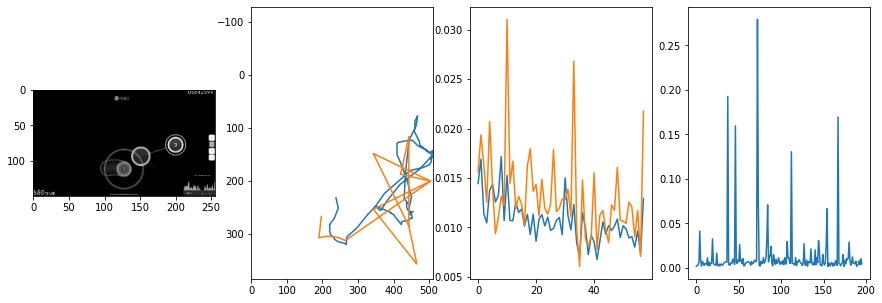


 64 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008225133182238597
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0101                                    
pred: 0.7832779884338379 0.07499849796295166
gt: 0.6398574113845825 0.4830390512943268
(147, 74)


<Figure size 1080x360 with 0 Axes>

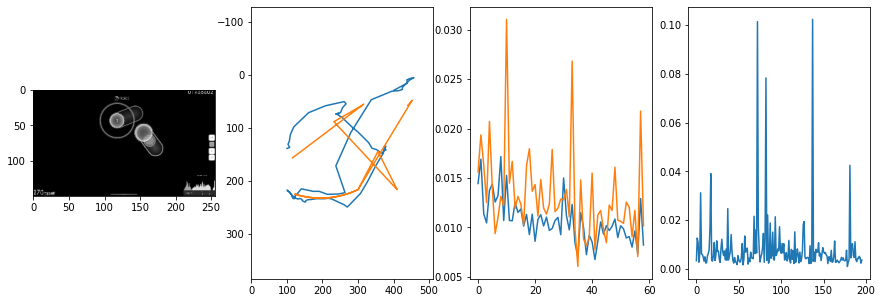


 65 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006972088154799742
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0154                                    
pred: 0.7848864793777466 0.6940662860870361
gt: 0.625023603439331 0.5391591191291809
(144, 80)


<Figure size 1080x360 with 0 Axes>

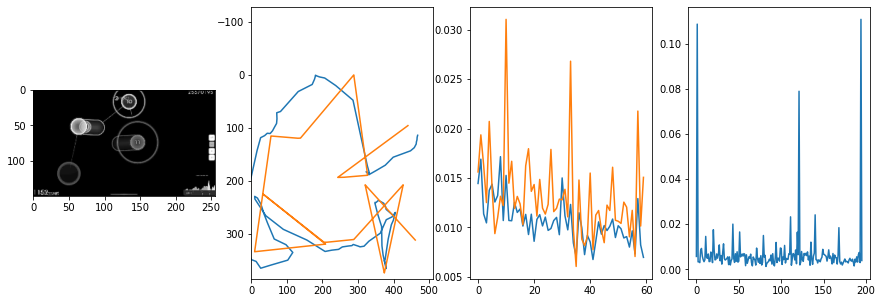


 66 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.88it/s  0.0045                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007049684667584429
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0040                                    
pred: 0.45461851358413696 0.644189715385437
gt: 0.22633126378059387 0.6025447845458984
(83, 88)


<Figure size 1080x360 with 0 Axes>

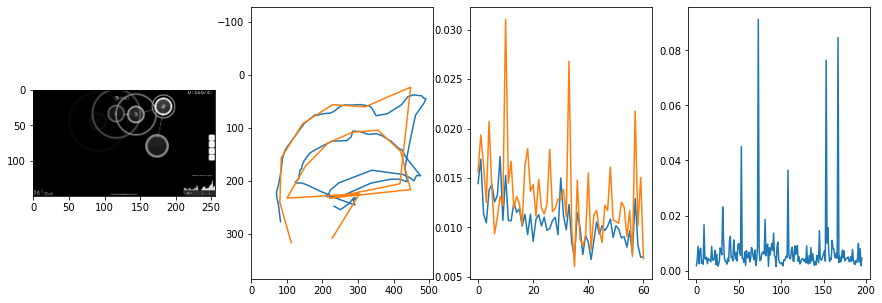


 67 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0210                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00896993081862872
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.4684477746486664 0.5014957189559937
gt: 0.5929303169250488 0.45998457074165344
(139, 71)


<Figure size 1080x360 with 0 Axes>

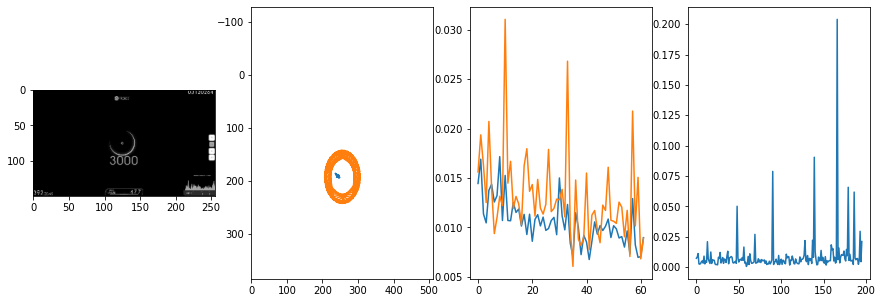


 68 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.89it/s  0.0046                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008088194101702004
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0078                                    
pred: 0.40684422850608826 0.5901954770088196
gt: 0.2996065616607666 0.8412153720855713
(94, 115)


<Figure size 1080x360 with 0 Axes>

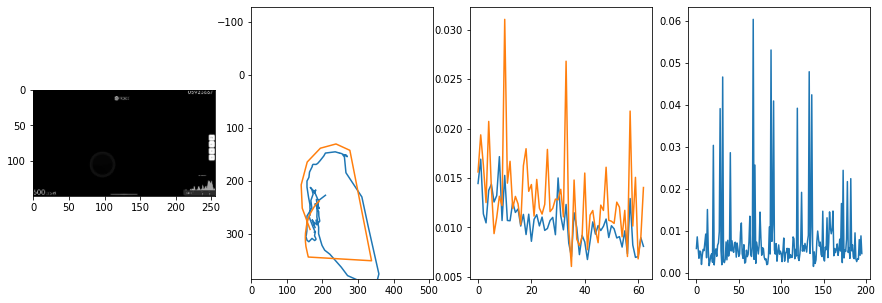


 69 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.93it/s  0.0023                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009608715542470942
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0088                                    
pred: 0.5836694240570068 0.17786568403244019
gt: 0.765611469745636 0.666628897190094
(166, 95)


<Figure size 1080x360 with 0 Axes>

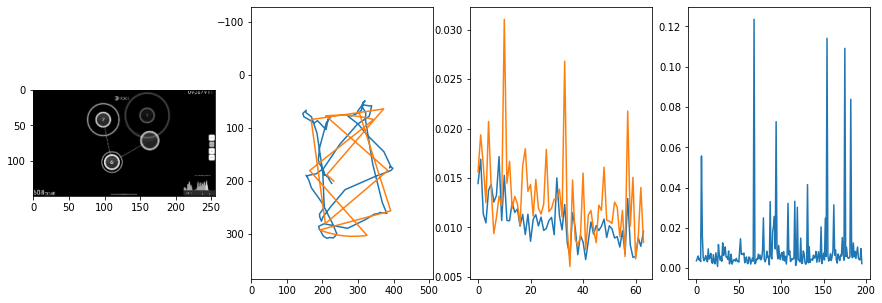


 70 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.85it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009878986050037439
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0078                                    
pred: 0.5683920979499817 0.4262518286705017
gt: 0.5214832425117493 0.6328126788139343
(128, 91)


<Figure size 1080x360 with 0 Axes>

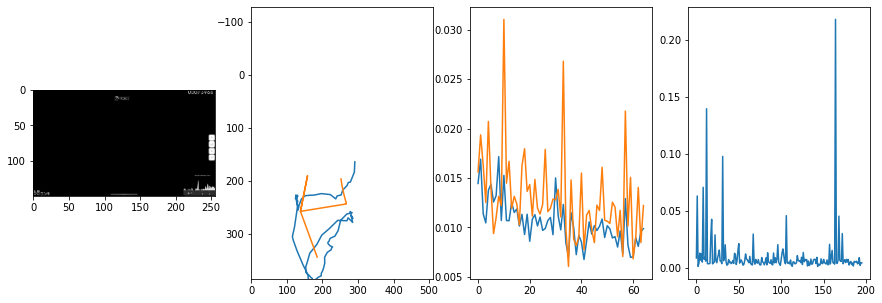


 71 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.86it/s  0.0064                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010348539601070616
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0063                                    
pred: 0.4101393520832062 1.0020122528076172
gt: 0.48241397738456726 0.9088459014892578
(122, 123)


<Figure size 1080x360 with 0 Axes>

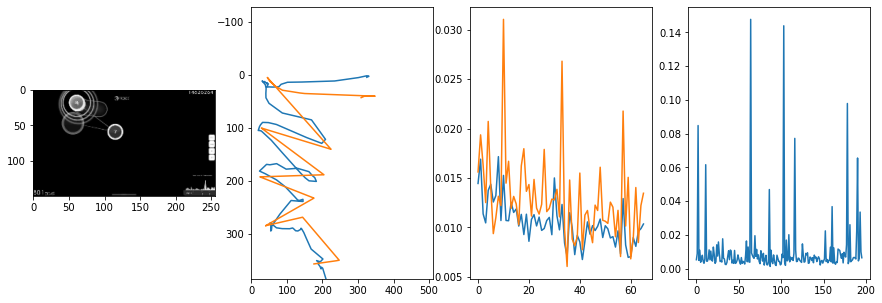


 72 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.52it/s  0.0063                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008519030602563324
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0051                                    
pred: 0.5467427372932434 0.14401622116565704
gt: 0.5609577298164368 0.2127804309129715
(134, 42)


<Figure size 1080x360 with 0 Axes>

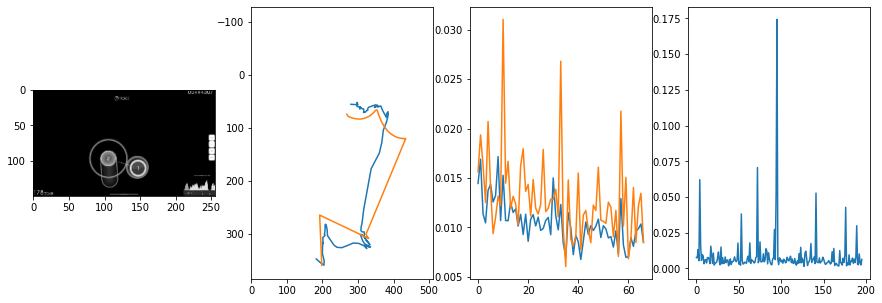


 73 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0053                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007717162283964227
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0091                                    
pred: 0.38500460982322693 0.6630531549453735
gt: 0.39171314239501953 0.6044971346855164
(108, 88)


<Figure size 1080x360 with 0 Axes>

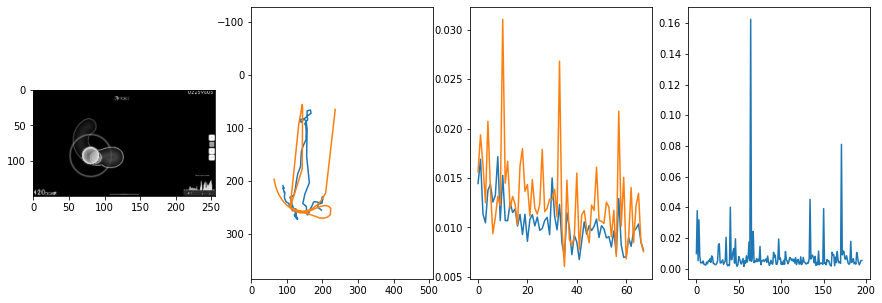


 74 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.58it/s  0.0059                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00666315945629173
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0038                                    
pred: 0.22875267267227173 0.30649131536483765
gt: 0.1171875 0.4166666567325592
(66, 66)


<Figure size 1080x360 with 0 Axes>

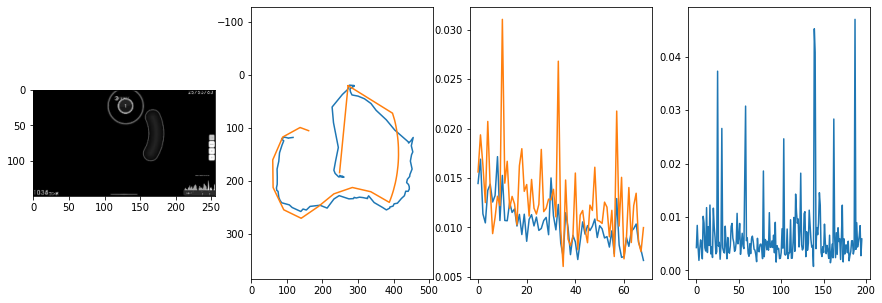


 75 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.69it/s  0.0072                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008514023026004814
outliers: 51
retrain: 8                 
val: 50/50 loss: 0.0019                                    
pred: 0.7330276370048523 0.24726071953773499
gt: 0.6596163511276245 0.2705540955066681
(150, 49)


<Figure size 1080x360 with 0 Axes>

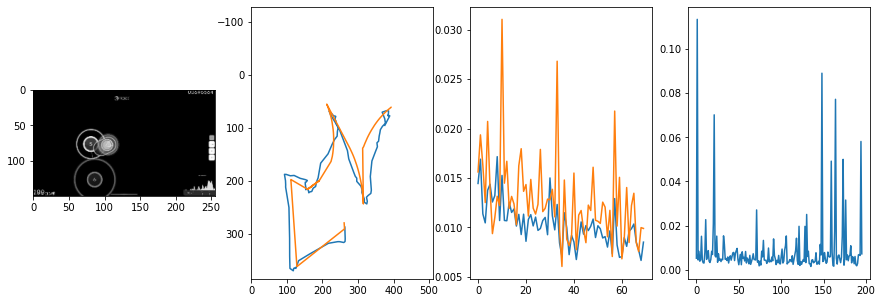


 76 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.59it/s  0.0035                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0077971442001491635
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0101                                    
pred: 0.49283888936042786 0.8556265830993652
gt: 0.3984052836894989 0.8697202801704407
(109, 119)


<Figure size 1080x360 with 0 Axes>

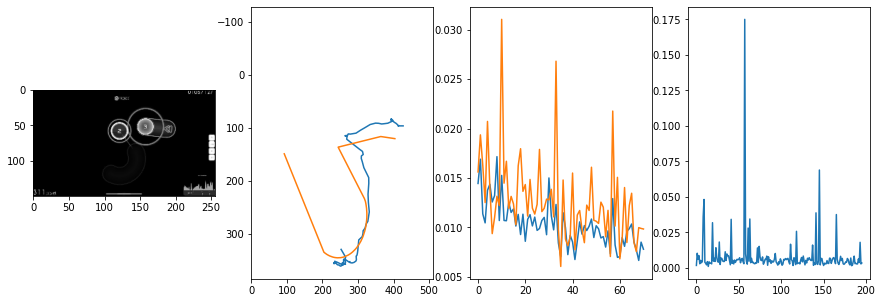


 77 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.62it/s  0.0047                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009063566661599015
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0055                                    
pred: 0.25643473863601685 0.5689621567726135
gt: 0.21688085794448853 0.6003661751747131
(81, 87)


<Figure size 1080x360 with 0 Axes>

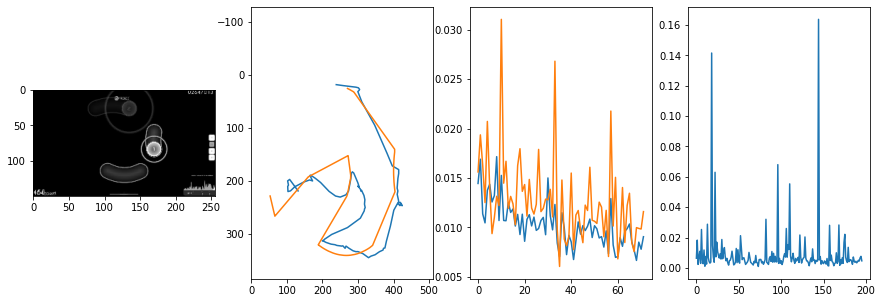


 78 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.47it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007357482313135715
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0146                                    
pred: 0.6468767523765564 0.5099844932556152
gt: 0.5344471335411072 0.7384350895881653
(130, 103)


<Figure size 1080x360 with 0 Axes>

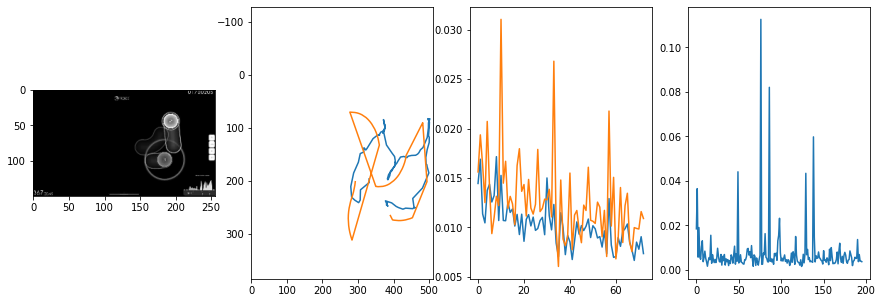


 79 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.49it/s  0.0068                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007686256179799877
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0082                                    
pred: 0.1186087429523468 0.9732106924057007
gt: 0.37493088841438293 0.08342546224594116
(106, 27)


<Figure size 1080x360 with 0 Axes>

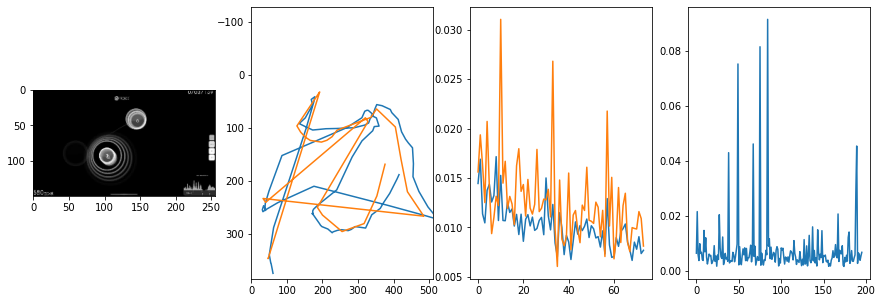


 80 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0032                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008990345308937284
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0041                                    
pred: 0.41012269258499146 0.6337519884109497
gt: 0.3750000298023224 0.39583340287208557
(106, 64)


<Figure size 1080x360 with 0 Axes>

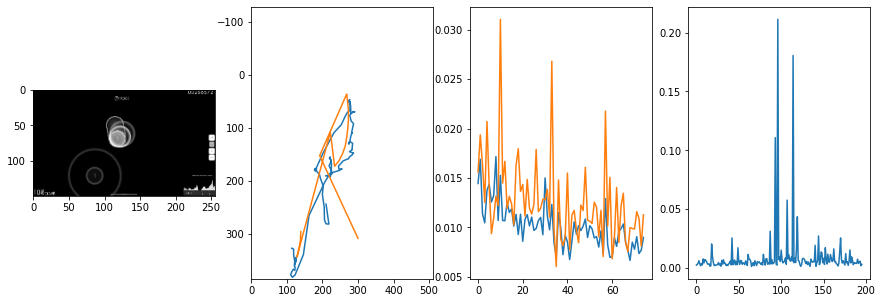


 81 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.59it/s  0.0032                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008908178463663754
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0040                                    
pred: 0.3205720782279968 0.20487169921398163
gt: 0.4171825051307678 0.19945643842220306
(112, 41)


<Figure size 1080x360 with 0 Axes>

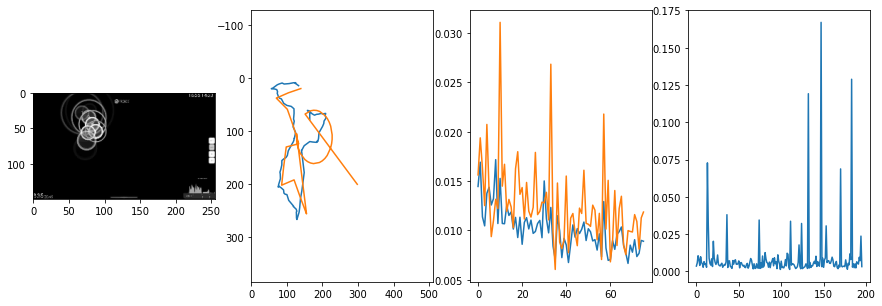


 82 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.58it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008293835898832778
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0581                                    
pred: 0.4180598556995392 0.5817855000495911
gt: 0.9026483297348022 0.4614907503128052
(187, 71)


<Figure size 1080x360 with 0 Axes>

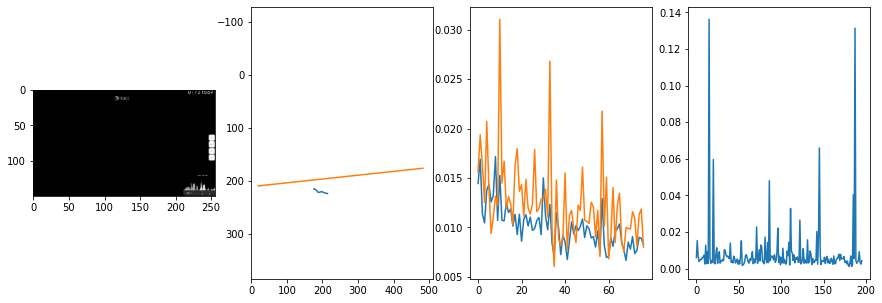


 83 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.49it/s  0.0163                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007034266883702189
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.30680426955223083 0.7243335247039795
gt: 0.268100768327713 0.7869135737419128
(89, 109)


<Figure size 1080x360 with 0 Axes>

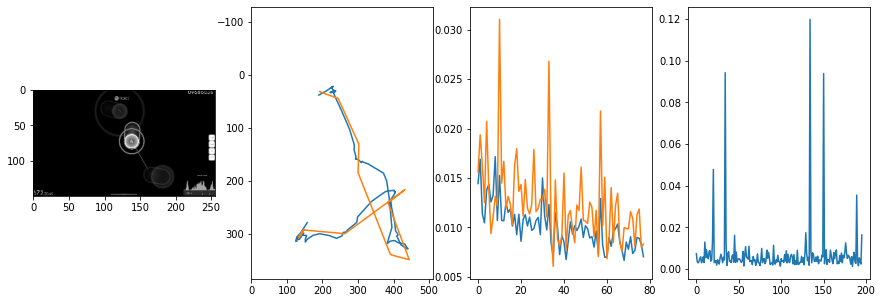


 84 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.62it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006778690257473203
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0127                                    
pred: 0.5236828923225403 0.7727243304252625
gt: 0.6712247133255005 0.743527352809906
(152, 104)


<Figure size 1080x360 with 0 Axes>

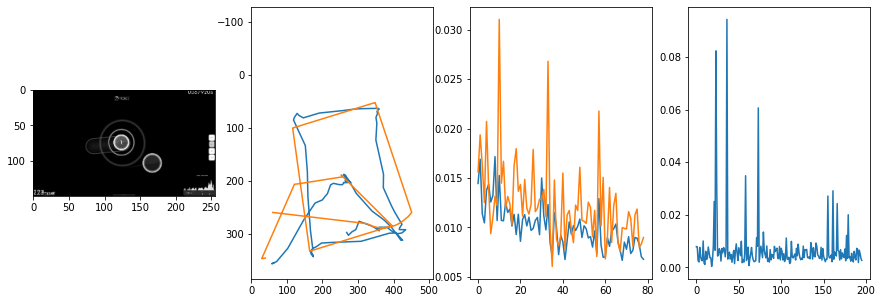


 85 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.51it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0075434742730624066
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0053                                    
pred: 0.4117596745491028 0.5287888050079346
gt: 0.5681939721107483 0.4933464527130127
(136, 75)


<Figure size 1080x360 with 0 Axes>

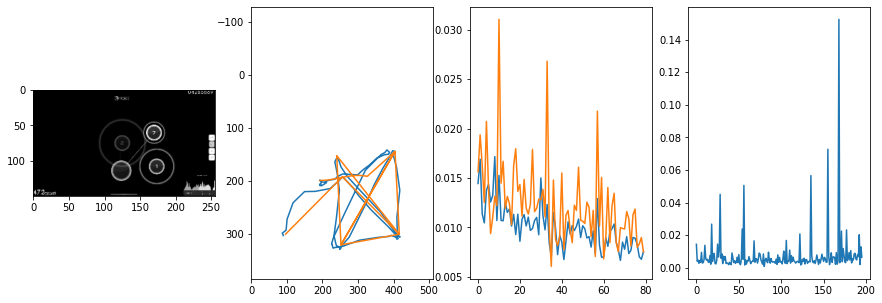


 86 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.52it/s  0.0022                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007598701676493986
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0238                                    
pred: 0.40191060304641724 0.4533916413784027
gt: 0.14844025671482086 0.385416716337204
(71, 62)


<Figure size 1080x360 with 0 Axes>

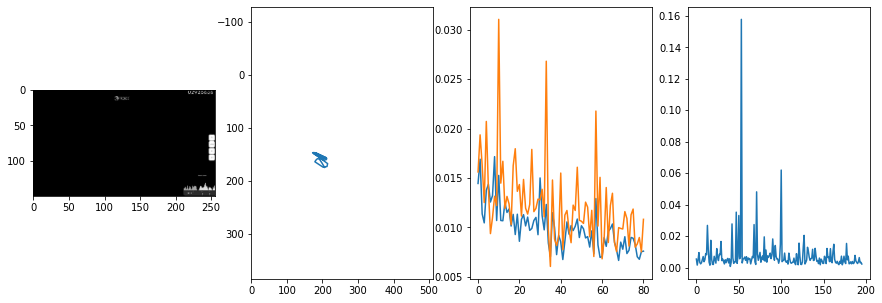


 87 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.64it/s  0.0032                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007014326613434419
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0115                                    
pred: 0.4211627244949341 0.2256608009338379
gt: 0.5 0.2291666716337204
(125, 44)


<Figure size 1080x360 with 0 Axes>

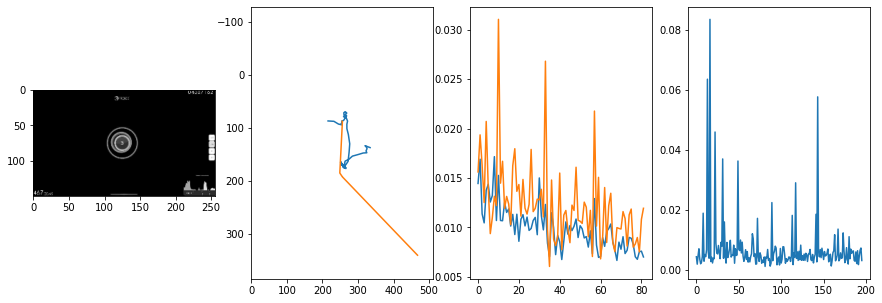


 88 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.35it/s  0.0040                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007404017626849592
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0032                                    
pred: 0.5481563210487366 0.7260565757751465
gt: 0.5371094346046448 0.5104168057441711
(131, 77)


<Figure size 1080x360 with 0 Axes>

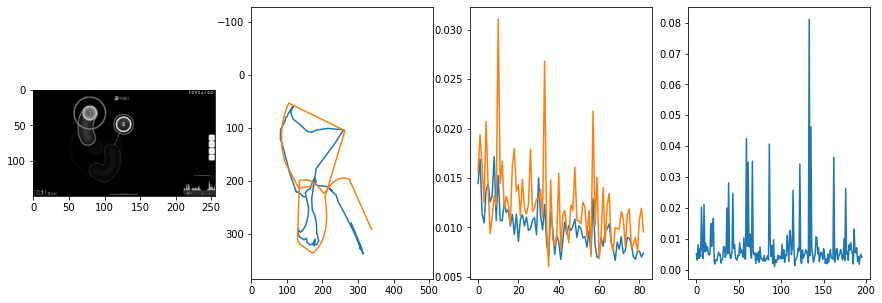


 89 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.56it/s  0.0041                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00808416130805236
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0070                                    
pred: 0.21436139941215515 0.3259509801864624
gt: 0.208212211728096 0.2989495098590851
(80, 52)


<Figure size 1080x360 with 0 Axes>

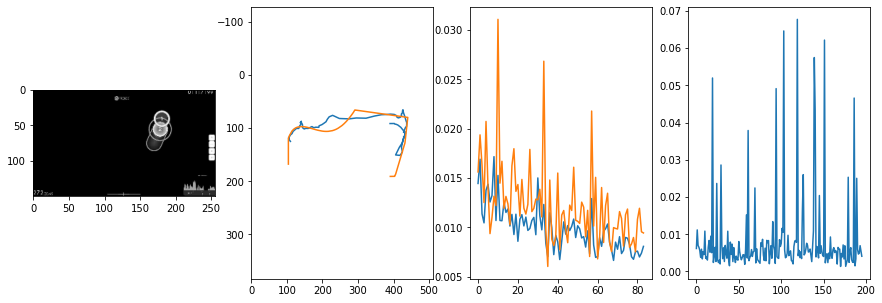


 90 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.59it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00765245714479088
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0062                                    
pred: 0.5236634612083435 0.9093930721282959
gt: 0.5566405057907104 0.8854165077209473
(134, 120)


<Figure size 1080x360 with 0 Axes>

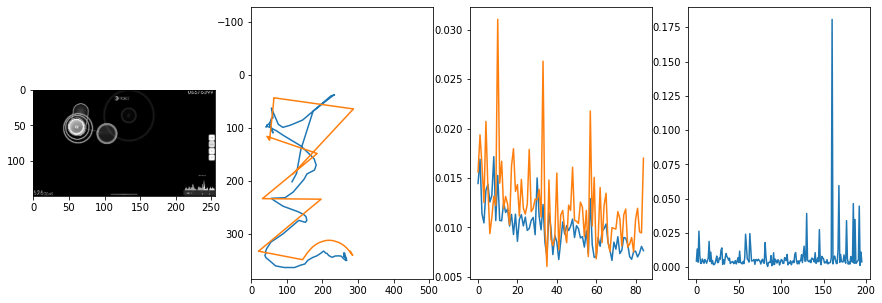


 91 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.65it/s  0.0054                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00787316642913074
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0036                                    
pred: 0.6493567228317261 0.16749417781829834
gt: 0.7656248211860657 0.14583338797092438
(166, 34)


<Figure size 1080x360 with 0 Axes>

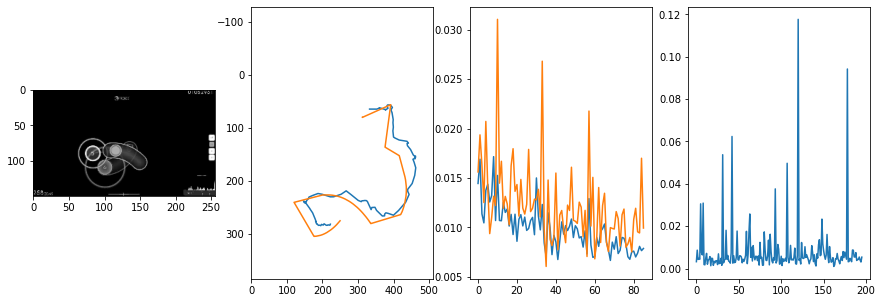


 92 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.63it/s  0.0021                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006982510641564102
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0058                                    
pred: 0.6535581350326538 0.34973400831222534
gt: 0.6484375 0.375
(148, 61)


<Figure size 1080x360 with 0 Axes>

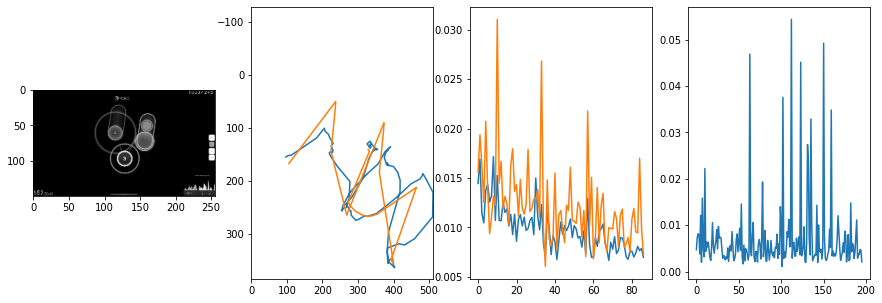


 93 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0040                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00807035312517451
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0041                                    
pred: 0.814997136592865 0.6238324046134949
gt: 0.8437497615814209 0.7968745827674866
(178, 110)


<Figure size 1080x360 with 0 Axes>

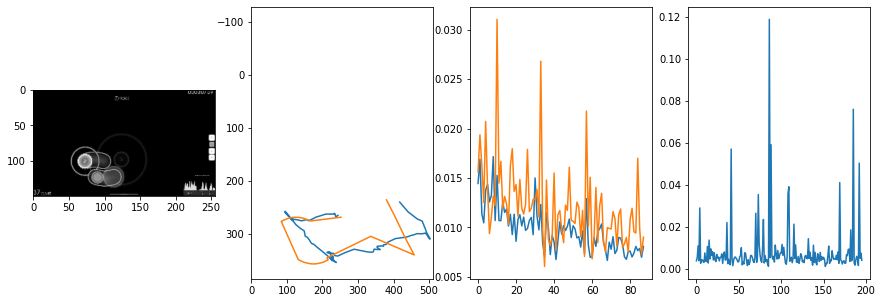


 94 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.52it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007858576823847977
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0052                                    
pred: 0.3263387382030487 0.12211768329143524
gt: 0.07421875 0.4765625
(59, 73)


<Figure size 1080x360 with 0 Axes>

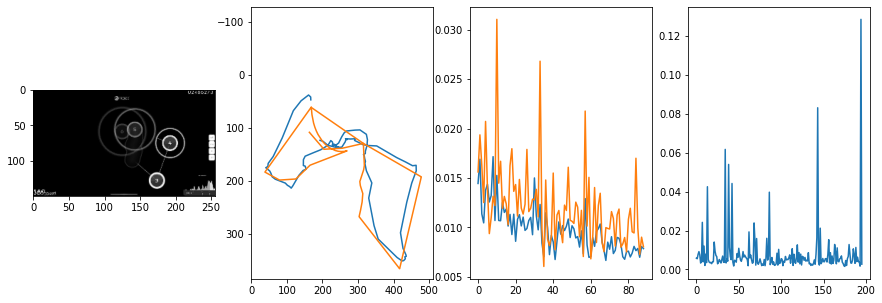


 95 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.55it/s  0.0114                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006318513568602407
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0045                                    
pred: 0.8513513803482056 0.3405700922012329
gt: 0.9400206208229065 0.21429835259914398
(193, 42)


<Figure size 1080x360 with 0 Axes>

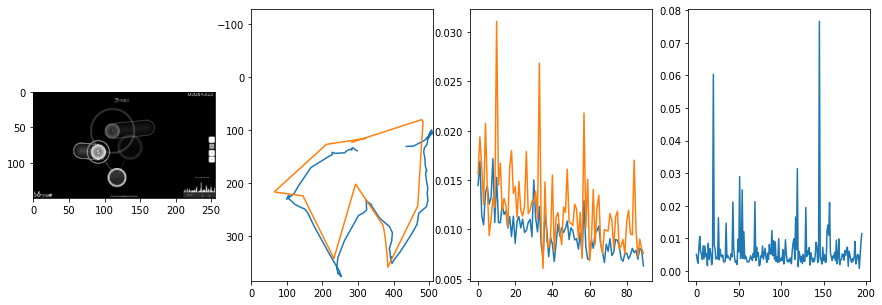


 96 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.60it/s  0.0057                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008889022789603308
outliers: 58
retrain: 8                 
val: 50/50 loss: 0.0512                                    
pred: 0.49549931287765503 0.46528828144073486
gt: 0.3651946187019348 0.729067325592041
(104, 102)


<Figure size 1080x360 with 0 Axes>

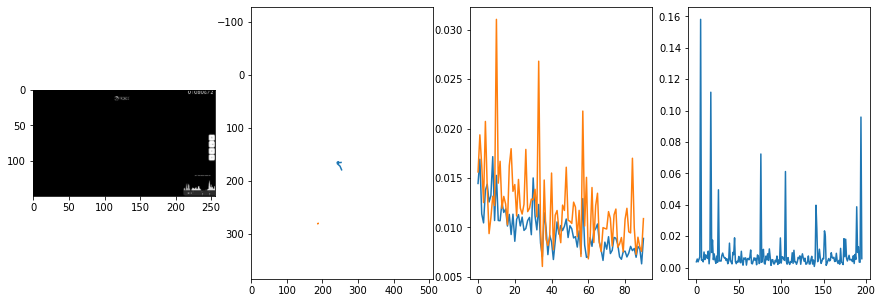


 97 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.40it/s  0.0043                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007726358716632715
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0073                                    
pred: 0.436474084854126 0.23161275684833527
gt: 0.6414579749107361 0.20149946212768555
(147, 41)


<Figure size 1080x360 with 0 Axes>

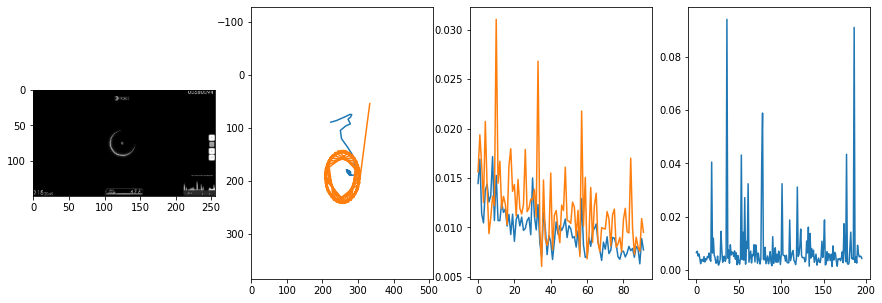


 98 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0040                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007272532642450735
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0069                                    
pred: 0.6651264429092407 0.4472084045410156
gt: 0.772011399269104 0.687898576259613
(167, 98)


<Figure size 1080x360 with 0 Axes>

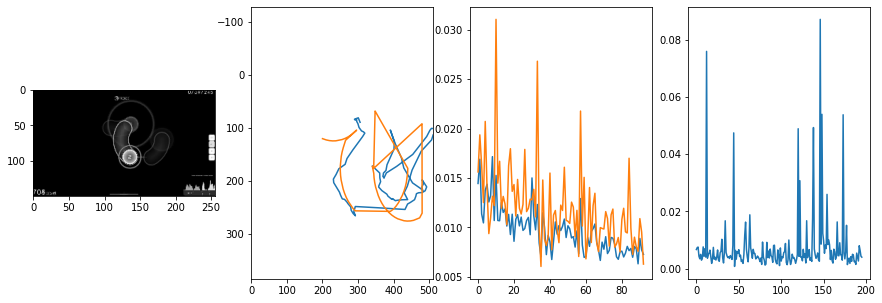


 99 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0093                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0078116540395540696
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0121                                    
pred: 0.1990865170955658 0.2523828148841858
gt: 0.07031258940696716 0.6562493443489075
(58, 94)


<Figure size 1080x360 with 0 Axes>

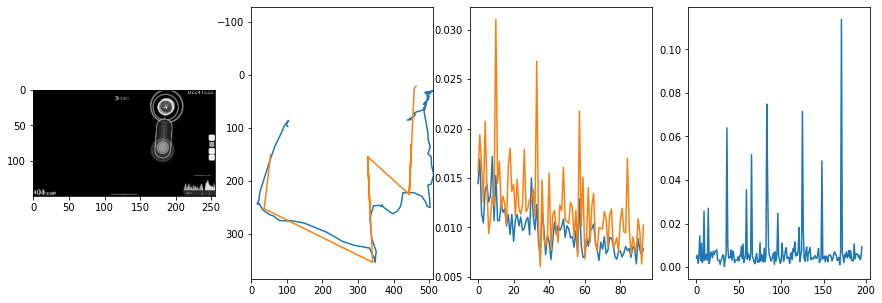


 100 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.52it/s  0.0031                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008219133799406225
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.9106121063232422 0.6262392997741699
gt: 0.5937501192092896 0.8125
(140, 112)


<Figure size 1080x360 with 0 Axes>

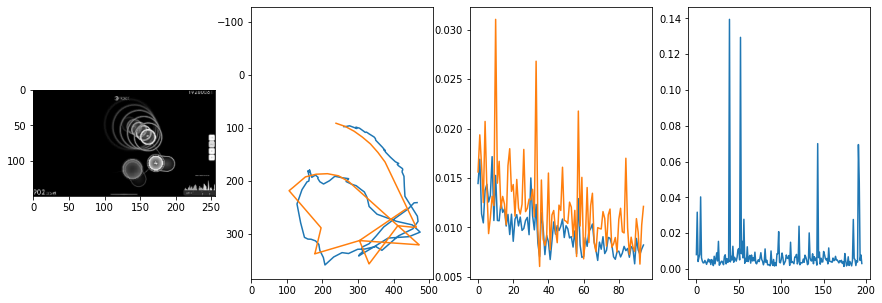


 101 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.54it/s  0.0035                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007798193867807752
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0023                                    
pred: 0.7264930009841919 0.849258303642273
gt: 0.939453125 0.4505208432674408
(193, 70)


<Figure size 1080x360 with 0 Axes>

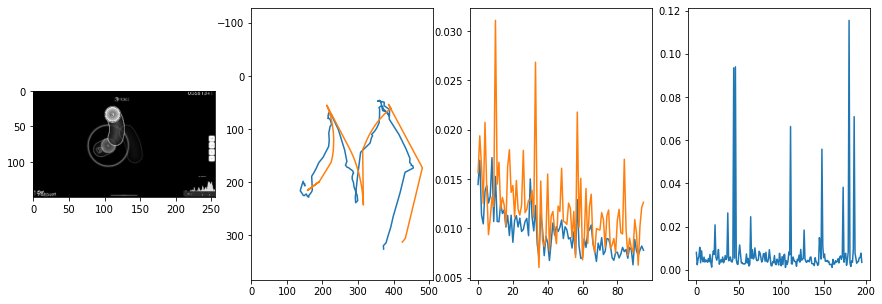


 102 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.50it/s  0.0027                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005789620715088914
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.48626989126205444 0.4875486195087433
gt: 0.5976561903953552 0.4999999701976776
(140, 76)


<Figure size 1080x360 with 0 Axes>

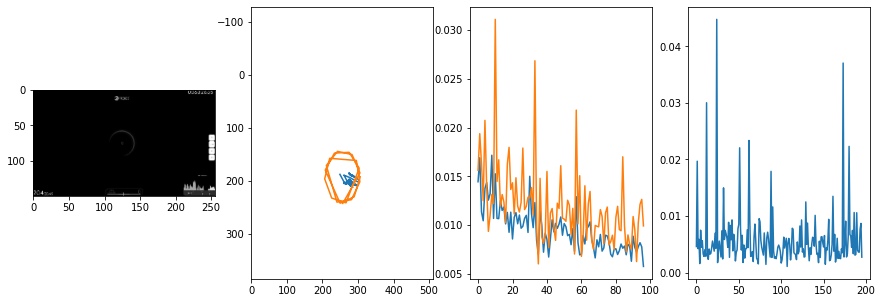


 103 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.61it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006967789287695528
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.5209693312644958 0.22914990782737732
gt: 0.587890625 0.6510416865348816
(139, 93)


<Figure size 1080x360 with 0 Axes>

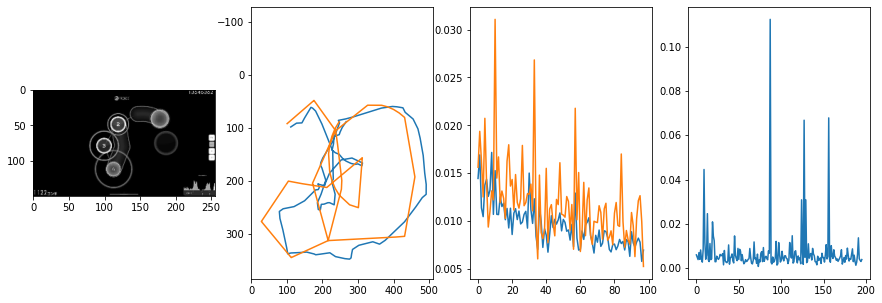


 104 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.48it/s  0.0102                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008529325497244028
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0185                                    
pred: 0.5685349106788635 0.39774996042251587
gt: 0.28338149189949036 0.7511743903160095
(91, 105)


<Figure size 1080x360 with 0 Axes>

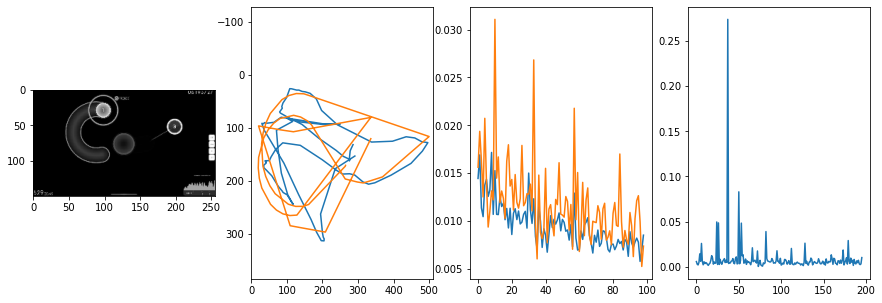


 105 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.58it/s  0.0220                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0067998302404944574
outliers: 21
retrain: 8                 
val: 50/50 loss: 0.0055                                    
pred: 0.8558671474456787 0.335122674703598
gt: 0.43475356698036194 0.11214473098516464
(115, 31)


<Figure size 1080x360 with 0 Axes>

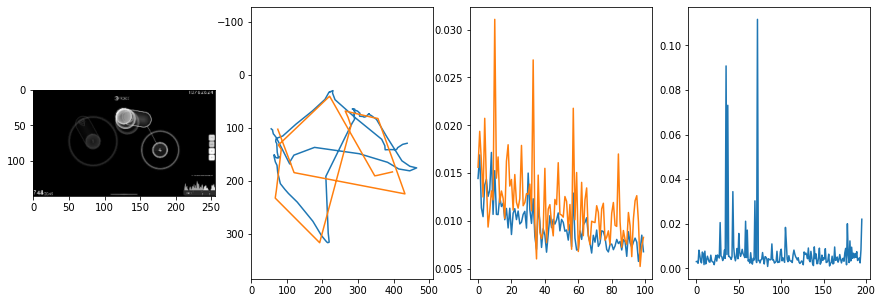


 106 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.54it/s  0.0038                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006380037411130319
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.18146297335624695 0.4114004373550415
gt: 0.04643666371703148 0.4232175052165985
(55, 67)


<Figure size 1080x360 with 0 Axes>

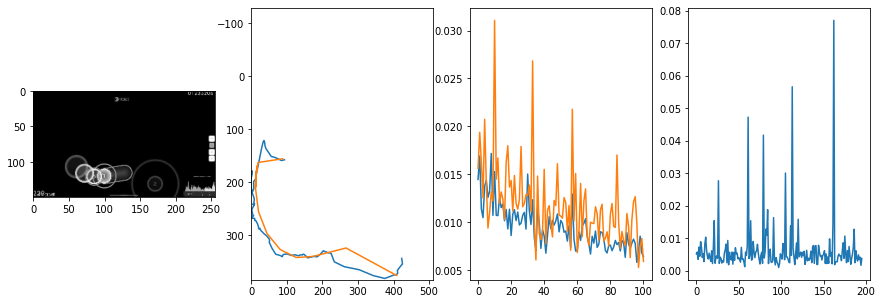


 107 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.56it/s  0.0051                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008111328529241514
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0087                                    
pred: 0.4239045977592468 0.5783640742301941
gt: 0.4467158317565918 0.1805223971605301
(117, 38)


<Figure size 1080x360 with 0 Axes>

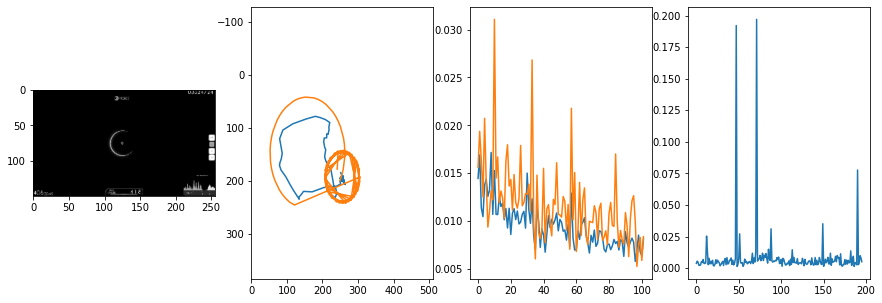


 108 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.58it/s  0.0045                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008510121334123197
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0028                                    
pred: 0.15256911516189575 0.43178653717041016
gt: 0.4570311903953552 0.3645833730697632
(118, 60)


<Figure size 1080x360 with 0 Axes>

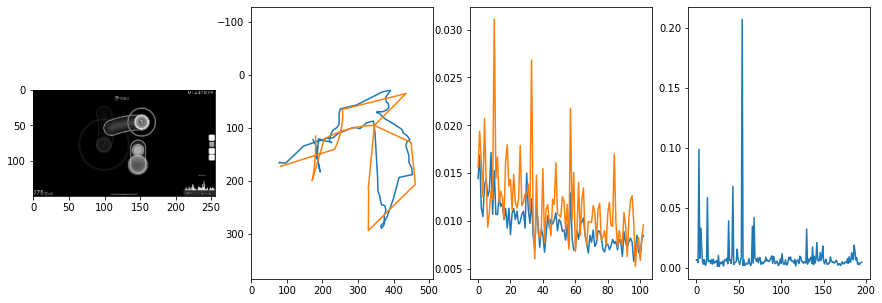


 109 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0025                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006183978396453609
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0036                                    
pred: 0.07175082713365555 0.9078388214111328
gt: 0.18826937675476074 0.9655420184135437
(77, 130)


<Figure size 1080x360 with 0 Axes>

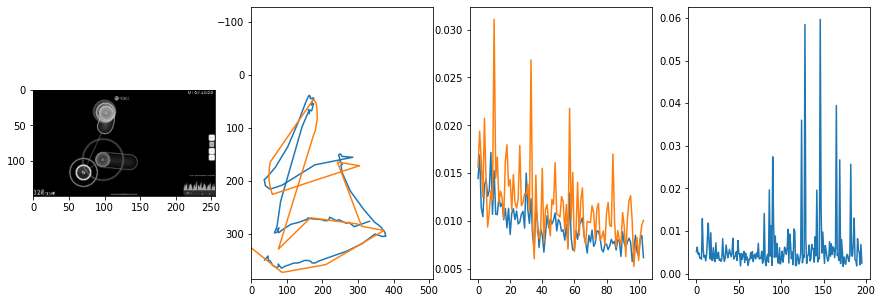


 110 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.59it/s  0.0061                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008413668288623591
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0733                                    
pred: 0.46080195903778076 0.4419097602367401
gt: 0.5625002980232239 0.1979168802499771
(135, 41)


<Figure size 1080x360 with 0 Axes>

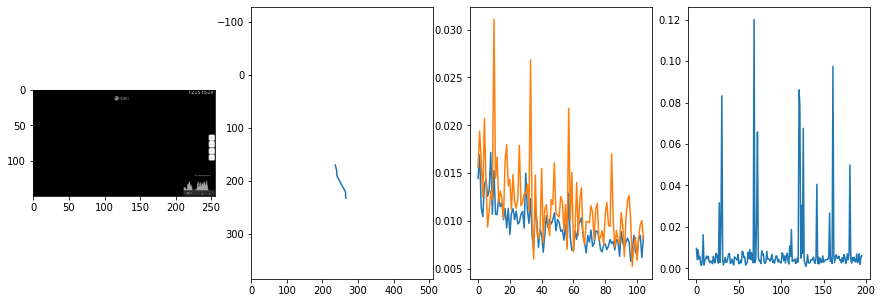


 111 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0063                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006764590781186803
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0079                                    
pred: 0.7914514541625977 0.5086670517921448
gt: 0.7155487537384033 0.1824706643819809
(158, 39)


<Figure size 1080x360 with 0 Axes>

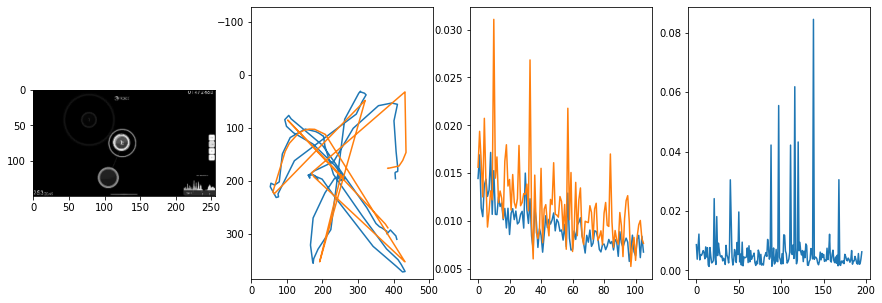


 112 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.55it/s  0.0019                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00669897716713366
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0126                                    
pred: 0.4723852276802063 0.44170963764190674
gt: 0.654296875 0.3359375
(149, 57)


<Figure size 1080x360 with 0 Axes>

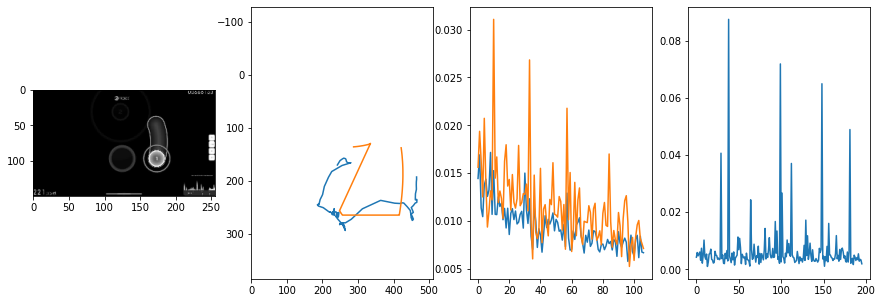


 113 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.83it/s  0.0034                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006723753836514352
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0044                                    
pred: 0.8470290899276733 0.2746967375278473
gt: 0.6902481913566589 0.34802529215812683
(155, 58)


<Figure size 1080x360 with 0 Axes>

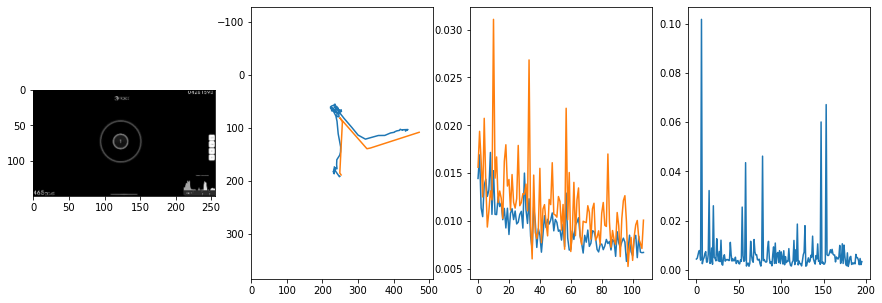


 114 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0036                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008950871854963504
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0131                                    
pred: 0.5485258102416992 0.4839290976524353
gt: 0.44364219903945923 0.4477897584438324
(116, 70)


<Figure size 1080x360 with 0 Axes>

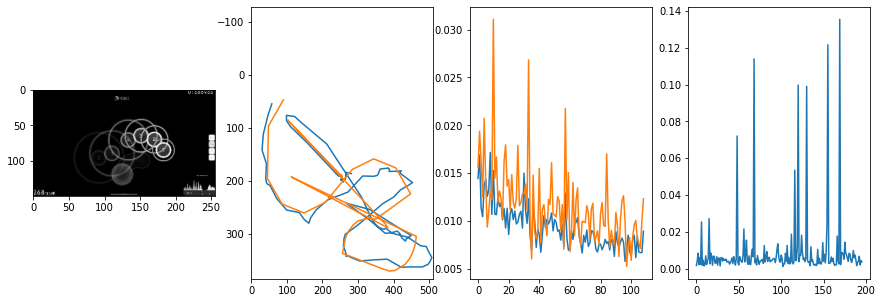


 115 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.54it/s  0.0052                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006079206298989225
outliers: 10
retrain: 8                 
val: 50/50 loss: 0.0328                                    
pred: 0.5621006488800049 0.4113719165325165
gt: 0.49288326501846313 0.6988443732261658
(124, 99)


<Figure size 1080x360 with 0 Axes>

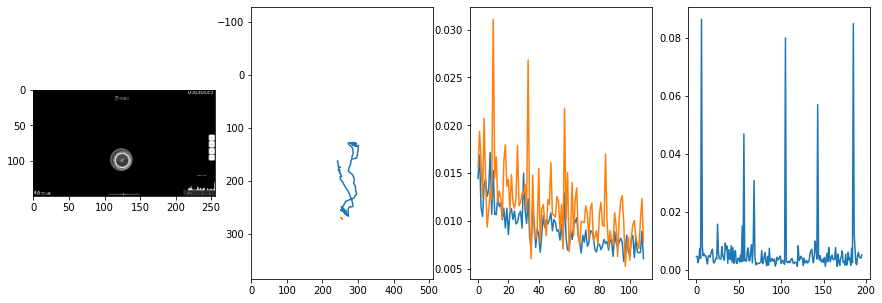


 116 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.51it/s  0.0079                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006876802556002893
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0079                                    
pred: 0.47018787264823914 0.5356517434120178
gt: 0.4228367209434509 0.4201938807964325
(113, 66)


<Figure size 1080x360 with 0 Axes>

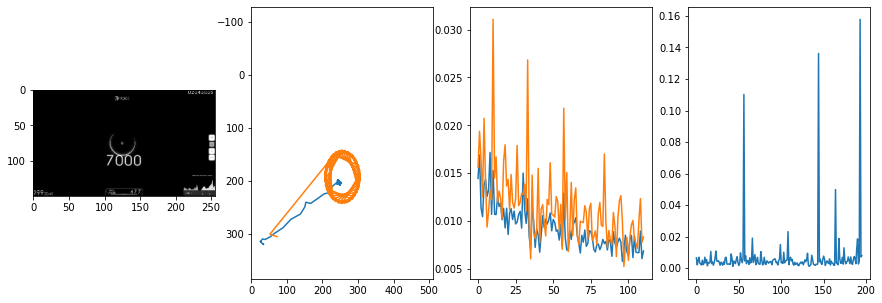


 117 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.56it/s  0.0045                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007902038448765797
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0057                                    
pred: 0.9515923857688904 0.3849036395549774
gt: 0.9398794174194336 0.4670315086841583
(193, 72)


<Figure size 1080x360 with 0 Axes>

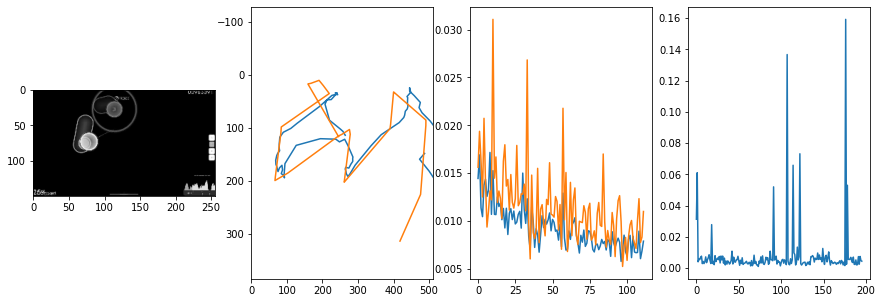


 118 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.53it/s  0.0039                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007757625830649607
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.5818484425544739 0.10261525213718414
gt: 0.4771105945110321 0.052625734359025955
(121, 24)


<Figure size 1080x360 with 0 Axes>

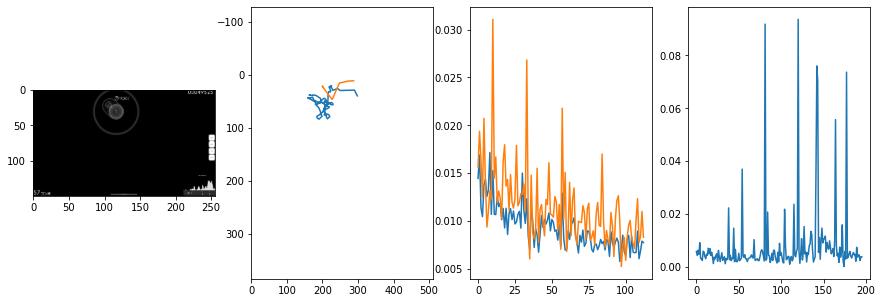


 119 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.58it/s  0.0052                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0069163853809836185
outliers: 21
retrain: 8                 
val: 50/50 loss: 0.0057                                    
pred: 0.15463924407958984 0.4653535485267639
gt: 0.0234375 0.6484375
(51, 93)


<Figure size 1080x360 with 0 Axes>

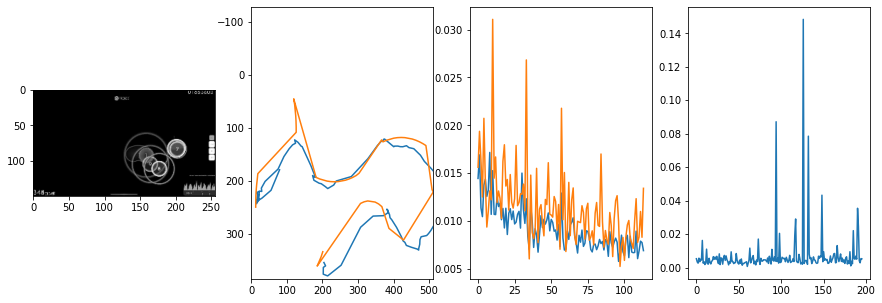


 120 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0042                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008159149412008725
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0037                                    
pred: 0.7154970169067383 0.37558987736701965
gt: 0.5562723875045776 0.5928478837013245
(134, 86)


<Figure size 1080x360 with 0 Axes>

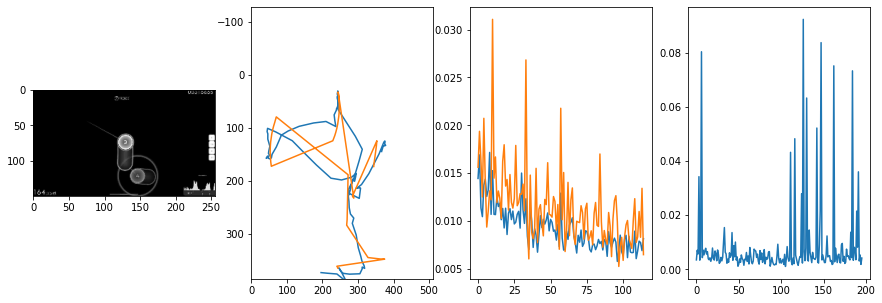


 121 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.45it/s  0.0016                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006235522768051572
outliers: 21
retrain: 8                 
val: 50/50 loss: 0.0066                                    
pred: 0.3129713237285614 0.516170859336853
gt: 0.3280254602432251 0.6247013211250305
(98, 90)


<Figure size 1080x360 with 0 Axes>

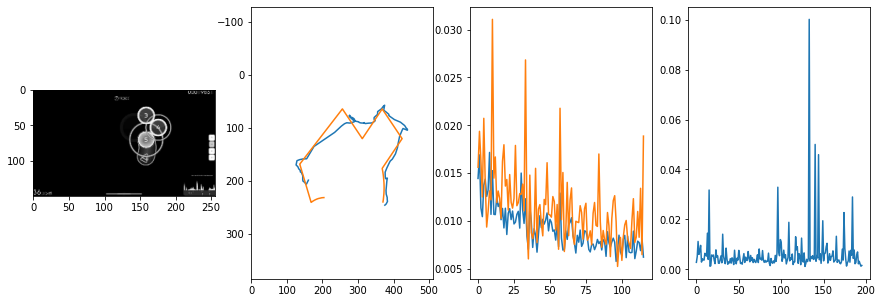


 122 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0047                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010938578113623686
outliers: 54
retrain: 8                 
val: 50/50 loss: 0.0213                                    
pred: 0.2980884313583374 0.47908449172973633
gt: 0.0664062649011612 0.354166716337204
(58, 59)


<Figure size 1080x360 with 0 Axes>

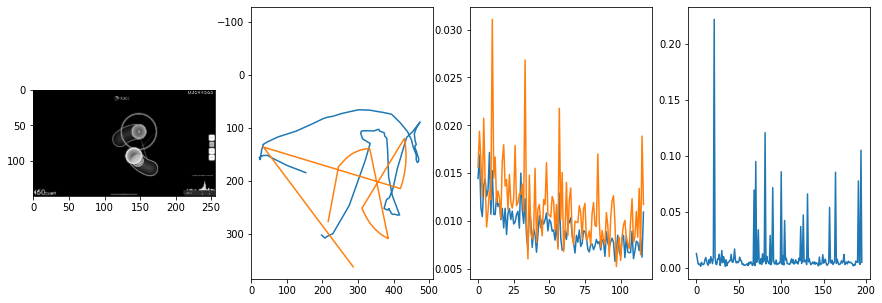


 123 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:24<00:00:00  7.90it/s  0.0023                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006399749088628522
outliers: 12
retrain: 8                 
val: 50/50 loss: 0.0025                                    
pred: 0.5212349891662598 0.6088470816612244
gt: 0.3984375596046448 0.4322916269302368
(109, 68)


<Figure size 1080x360 with 0 Axes>

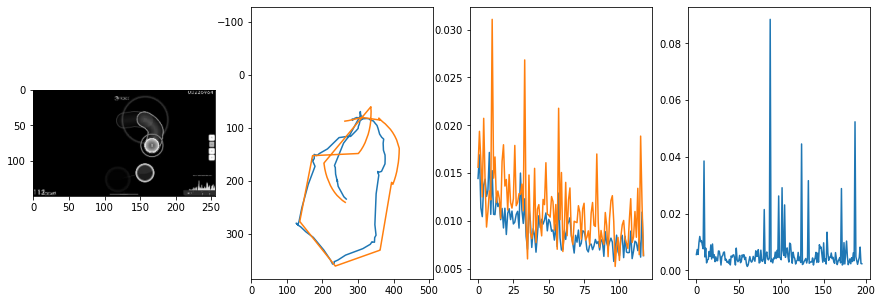


 124 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.82it/s  0.0086                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007480630493718104
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0093                                    
pred: 0.31628113985061646 0.32845258712768555
gt: 0.0390625 0.0598958320915699
(54, 24)


<Figure size 1080x360 with 0 Axes>

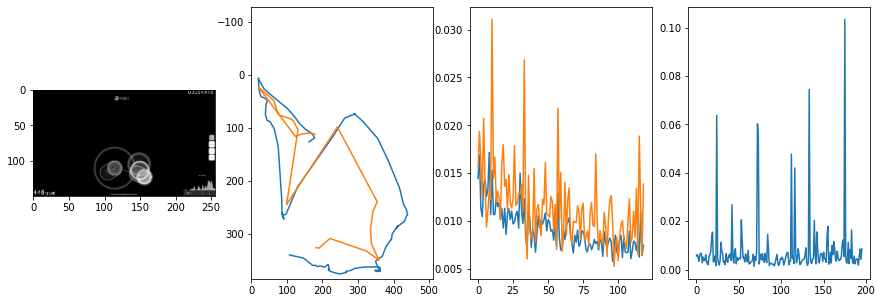


 125 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.73it/s  0.0082                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007090821820049908
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0056                                    
pred: 0.39952826499938965 0.6809132695198059
gt: 0.5298707485198975 0.37494492530822754
(130, 61)


<Figure size 1080x360 with 0 Axes>

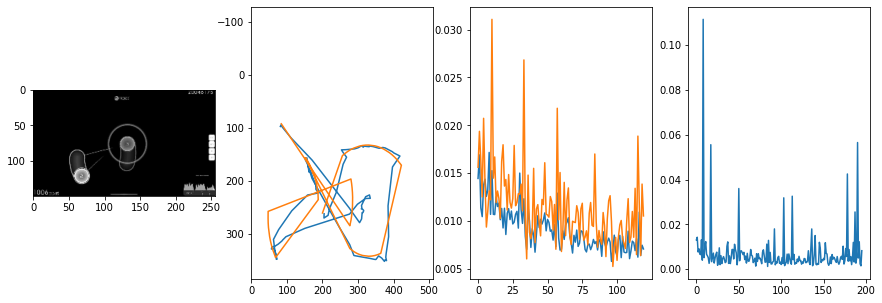


 126 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.75it/s  0.0015                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007895790389442
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.27085259556770325 0.6369670033454895
gt: 0.30452391505241394 0.5115261673927307
(95, 77)


<Figure size 1080x360 with 0 Axes>

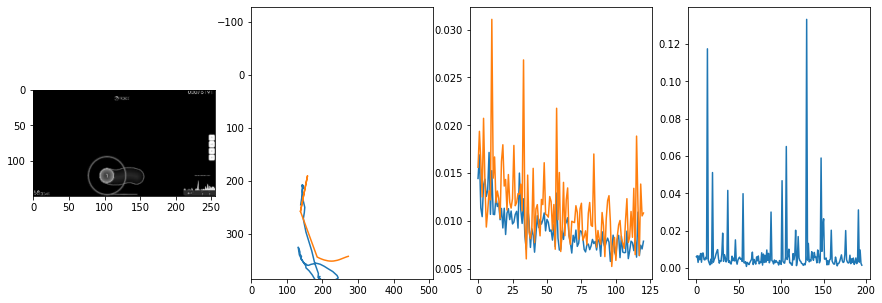


 127 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.48it/s  0.0062                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007389970311457861
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.26384422183036804 0.5716978311538696
gt: 0.29093989729881287 0.5551135540008545
(93, 82)


<Figure size 1080x360 with 0 Axes>

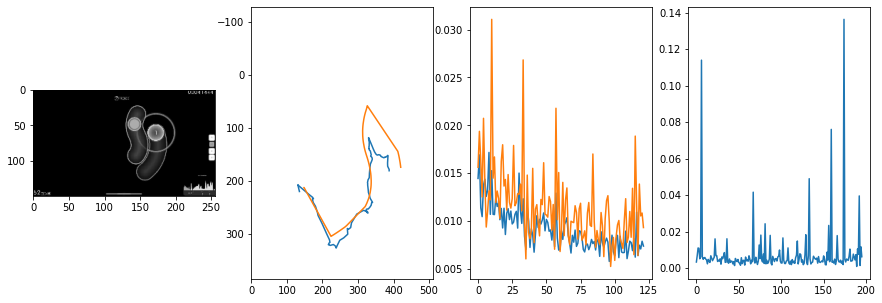


 128 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.54it/s  0.0302                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008122502402663802
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0022                                    
pred: 0.47357258200645447 0.2594831883907318
gt: 0.6484375 0.1328125
(148, 33)


<Figure size 1080x360 with 0 Axes>

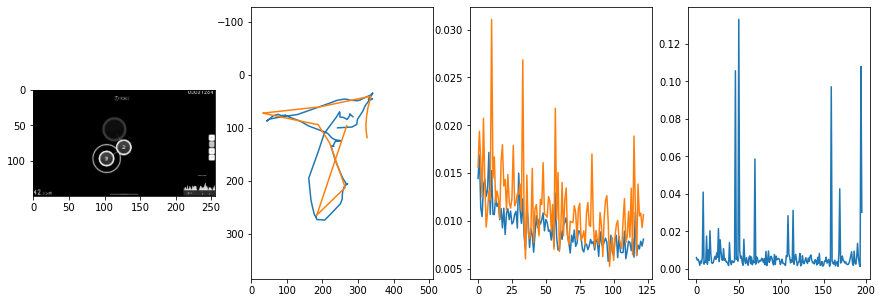


 129 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0073                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006356101105350773
outliers: 19
retrain: 8                 
val: 50/50 loss: 0.0034                                    
pred: 0.24436767399311066 0.3661596179008484
gt: 0.12109377235174179 0.21093755960464478
(66, 42)


<Figure size 1080x360 with 0 Axes>

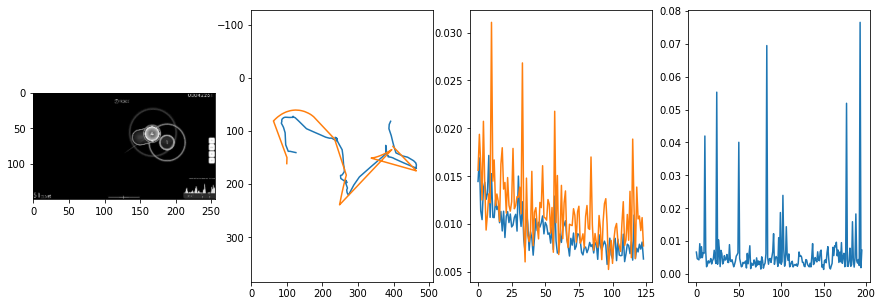


 130 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.62it/s  0.0033                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006291280022753421
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0041                                    
pred: 1.030627965927124 0.05092157423496246
gt: 0.7206764817237854 0.0866541936993599
(159, 28)


<Figure size 1080x360 with 0 Axes>

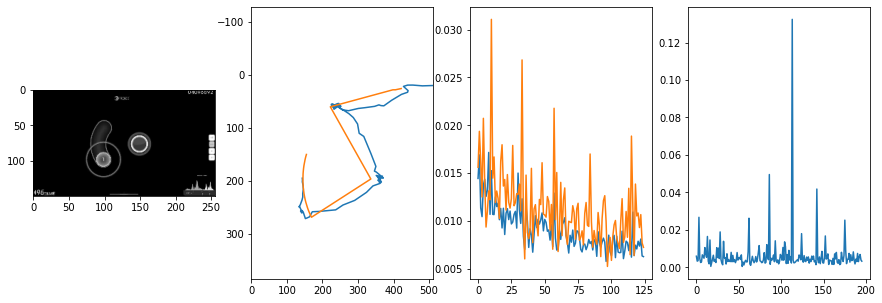


 131 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:25<00:00:00  7.57it/s  0.0094                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00703106021891082
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0076                                    
pred: 0.2663068175315857 0.5564146041870117
gt: 0.5369119048118591 0.379451185464859
(131, 62)


<Figure size 1080x360 with 0 Axes>

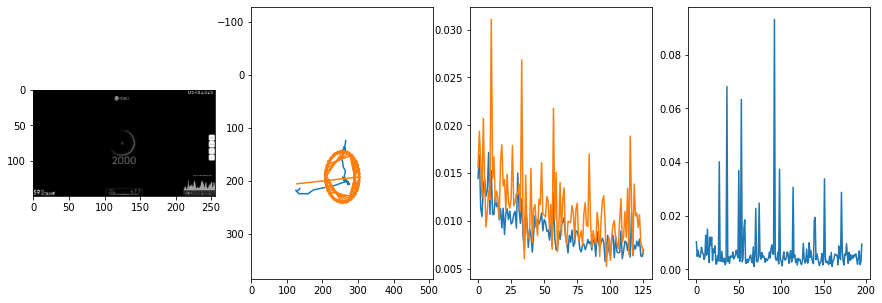


 132 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.31it/s  0.0050                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006339255095535547
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0076                                    
pred: 0.6338231563568115 0.7455762624740601
gt: 0.7770092487335205 0.9576858878135681
(168, 129)


<Figure size 1080x360 with 0 Axes>

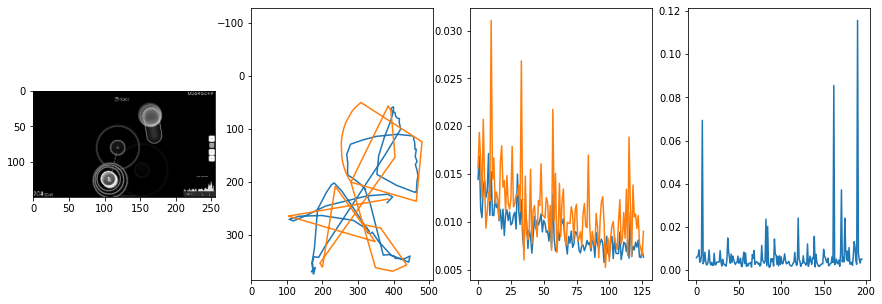


 133 of 134


  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:26<00:00:00  7.34it/s  0.0030                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0073870738909748495
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0023                                    
pred: 0.10106410086154938 0.6717281341552734
gt: 0.03670777007937431 0.539232075214386
(53, 80)


<Figure size 1080x360 with 0 Axes>

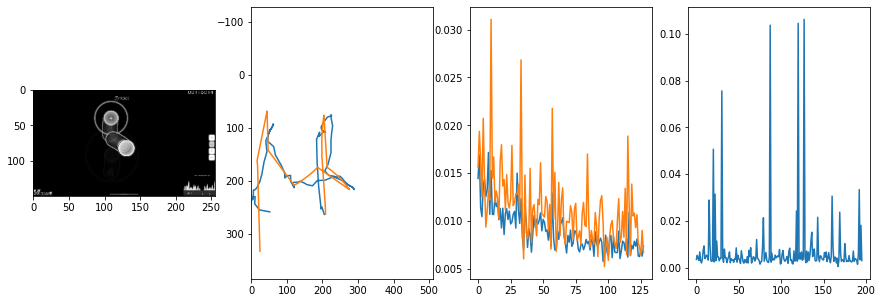


 134 of 134
4419.2998678684235 secs


In [21]:
start = time.time()

epochs = 128
loss_thresh = 0.0005
rnum_min = 8
trainVNRecurse()

end = time.time()
print(end - start, 'secs')

In [23]:
print(best_loss)
torch.save(best_weights, model_path + str(epoch_cum) + '.pt')

0.005262738533783704


In [ ]:
seq_dur = 1
best_loss = 9999

In [22]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

1 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.17it/s  0.0118                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006366922830888403
outliers: 0

val: 50/50 loss: 0.0102                                    
pred: 0.450509637594223 0.509356677532196
gt: 0.4556732475757599 0.38377663493156433
(118, 62)


<Figure size 1080x360 with 0 Axes>

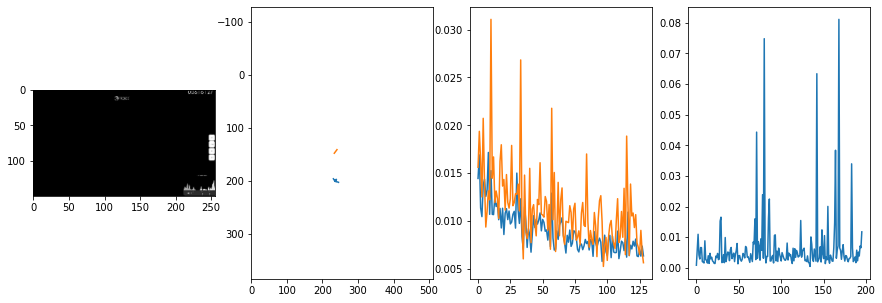


 135 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.32it/s  0.0054                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006389967992079767
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0858                                    
pred: 0.579353928565979 0.4024897813796997
gt: 0.2892705798149109 0.26184728741645813
(92, 48)


<Figure size 1080x360 with 0 Axes>

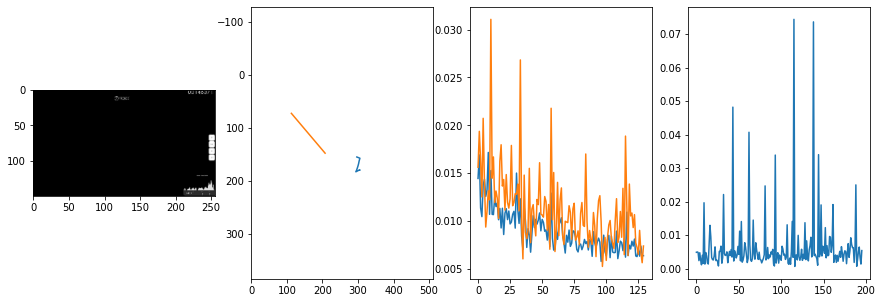


 136 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.27it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005393095152352804
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0032                                    
pred: 0.6422309875488281 0.5083065629005432
gt: 0.7160937786102295 0.6982018947601318
(159, 99)


<Figure size 1080x360 with 0 Axes>

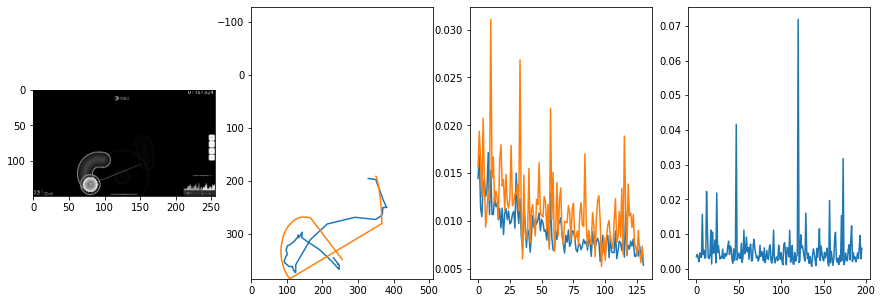


 137 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.13it/s  0.0028                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009350721943798018
outliers: 65
retrain: 8                 
val: 50/50 loss: 0.0056                                    
pred: 0.4497918486595154 0.43241238594055176
gt: 0.38282328844070435 0.09377875924110413
(107, 28)


<Figure size 1080x360 with 0 Axes>

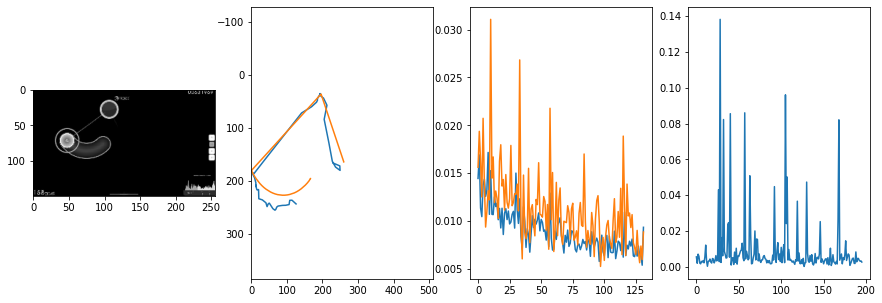


 138 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.27it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006792350821862263
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0061                                    
pred: 0.4417603015899658 0.6207310557365417
gt: 0.5608784556388855 0.4376743733882904
(134, 68)


<Figure size 1080x360 with 0 Axes>

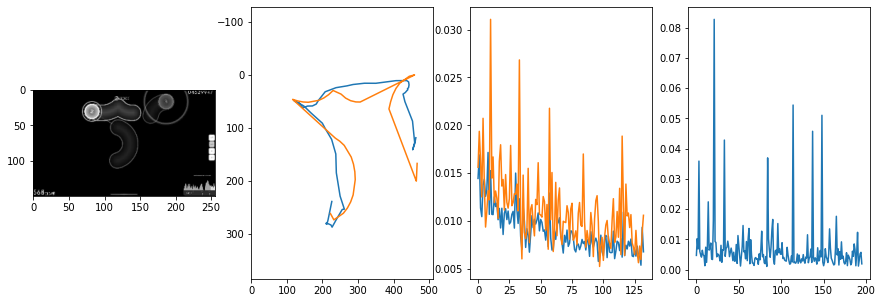


 139 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.21it/s  0.0235                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006646496503927498
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.4164412021636963 0.44884157180786133
gt: 0.5234375 0.5104166865348816
(129, 77)


<Figure size 1080x360 with 0 Axes>

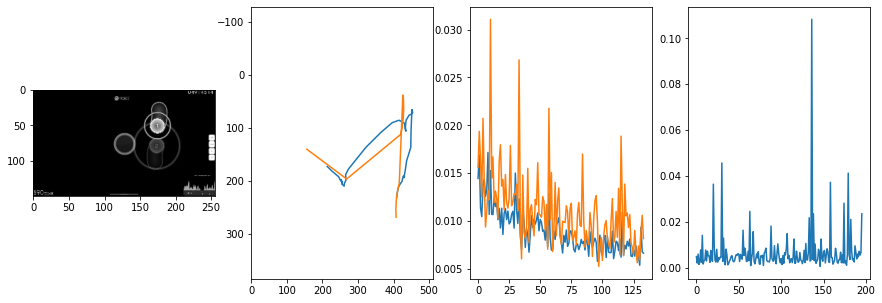


 140 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.17it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.012185541108697273
outliers: 72
retrain: 8                 
val: 50/50 loss: 0.0127                                    
pred: 0.7120633125305176 0.5774605870246887
gt: 0.1565411537885666 0.5417871475219727
(72, 81)


<Figure size 1080x360 with 0 Axes>

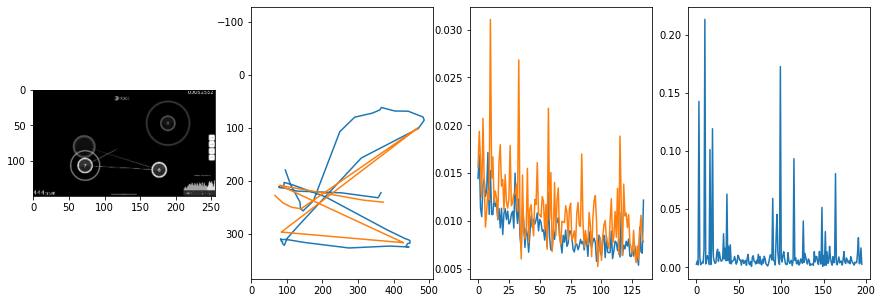


 141 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.13it/s  0.0027                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007243434023955476
outliers: 11
retrain: 8                 
val: 50/50 loss: 0.0071                                    
pred: 0.8953478336334229 0.32059845328330994
gt: 0.7714792490005493 0.28125178813934326
(167, 50)


<Figure size 1080x360 with 0 Axes>

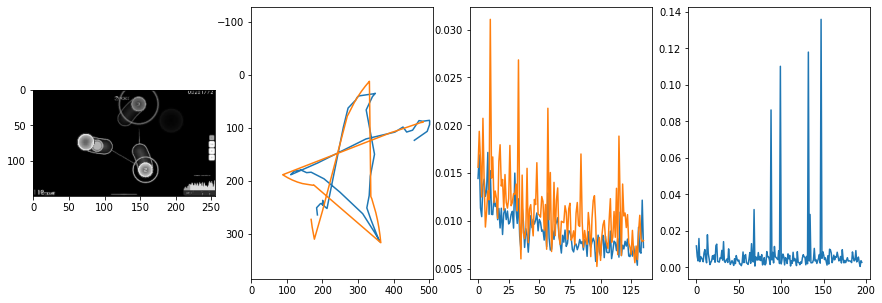


 142 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.09it/s  0.0039                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0061326828869582364
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0028                                    
pred: 0.32487553358078003 0.3710074722766876
gt: 0.5859375 0.4479166567325592
(138, 70)


<Figure size 1080x360 with 0 Axes>

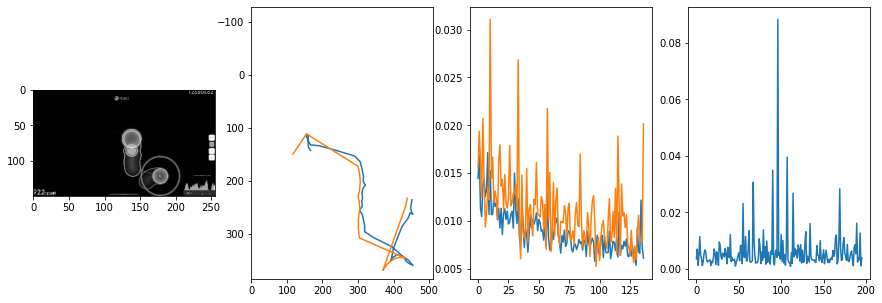


 143 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.20it/s  0.0044                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006838736345288248
outliers: 60
retrain: 8                 
val: 50/50 loss: 0.0028                                    
pred: 0.6510860919952393 0.8742936253547668
gt: 0.376953125 0.8984375
(106, 122)


<Figure size 1080x360 with 0 Axes>

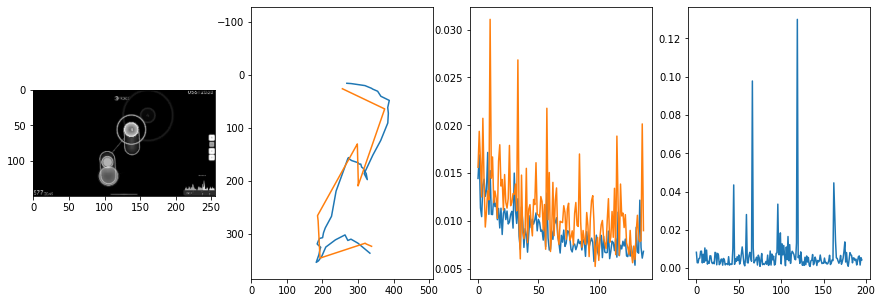


 144 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.27it/s  0.0066                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008727008722379817
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0039                                    
pred: 0.8087140917778015 0.5798065662384033
gt: 0.6986020803451538 0.36545637249946594
(156, 60)


<Figure size 1080x360 with 0 Axes>

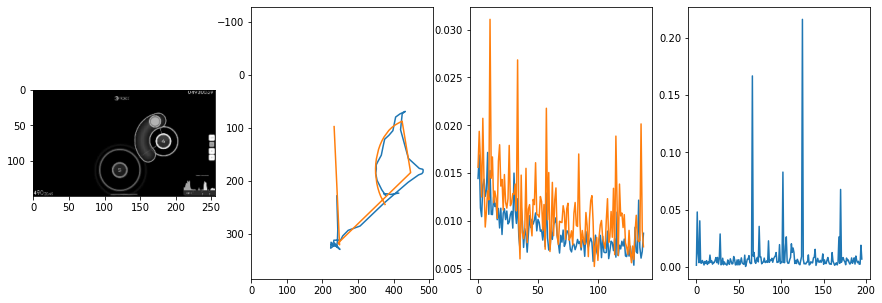


 145 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.14it/s  0.0022                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00897221694752688
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.3509328365325928 0.595842182636261
gt: 0.50390625 0.5729166865348816
(126, 84)


<Figure size 1080x360 with 0 Axes>

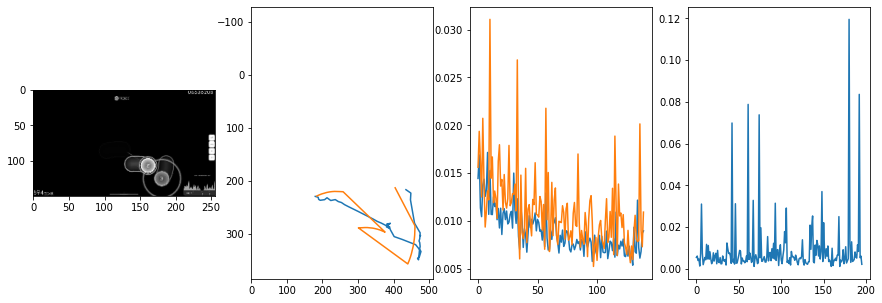


 146 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.39it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008217470595976623
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0069                                    
pred: 0.6727960705757141 0.37724244594573975
gt: 0.62042236328125 0.42920246720314026
(144, 67)


<Figure size 1080x360 with 0 Axes>

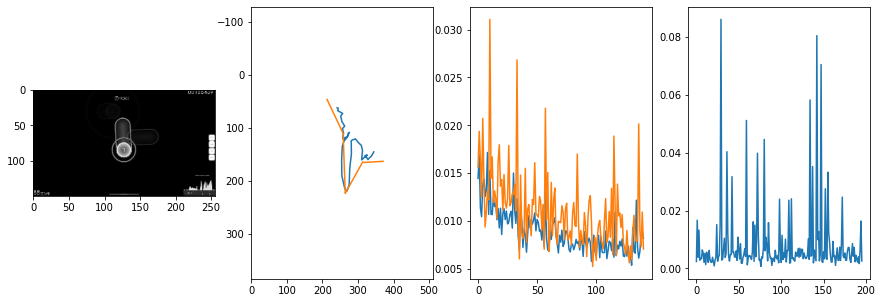


 147 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.08it/s  0.0042                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006219660210522956
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0080                                    
pred: 0.8427541255950928 0.6390059590339661
gt: 0.1954323649406433 0.5416824221611023
(78, 81)


<Figure size 1080x360 with 0 Axes>

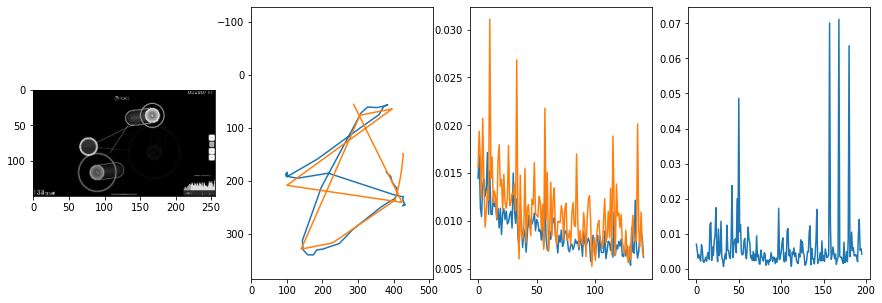


 148 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.29it/s  0.0550                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008666604848778141
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.8071621656417847 0.15734264254570007
gt: 0.8281311988830566 0.1353890597820282
(176, 33)


<Figure size 1080x360 with 0 Axes>

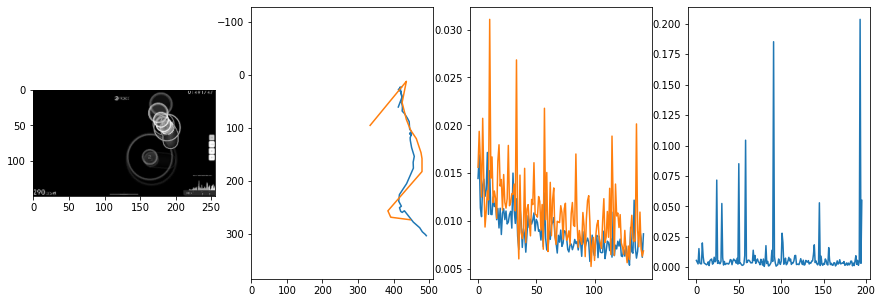


 149 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.09it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009475216763664265
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0067                                    
pred: 0.6190428733825684 0.4915159344673157
gt: 0.5214836001396179 0.5000007152557373
(128, 76)


<Figure size 1080x360 with 0 Axes>

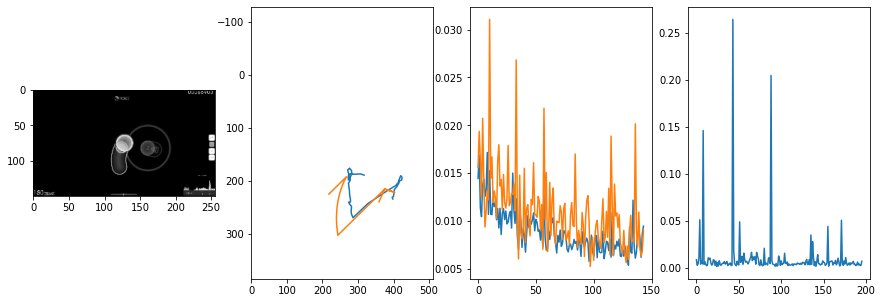


 150 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.30it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00835583116639434
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0030                                    
pred: 0.5679306983947754 0.6807428598403931
gt: 0.7005934119224548 0.42891767621040344
(156, 67)


<Figure size 1080x360 with 0 Axes>

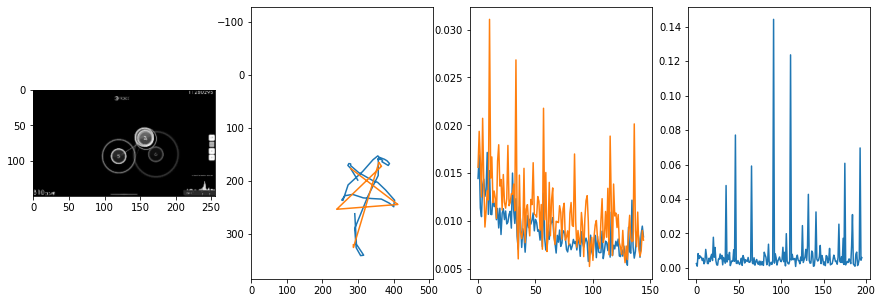


 151 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.29it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0071165190361635
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.5523127317428589 0.5372545123100281
gt: 0.84375 0.7708333134651184
(178, 107)


<Figure size 1080x360 with 0 Axes>

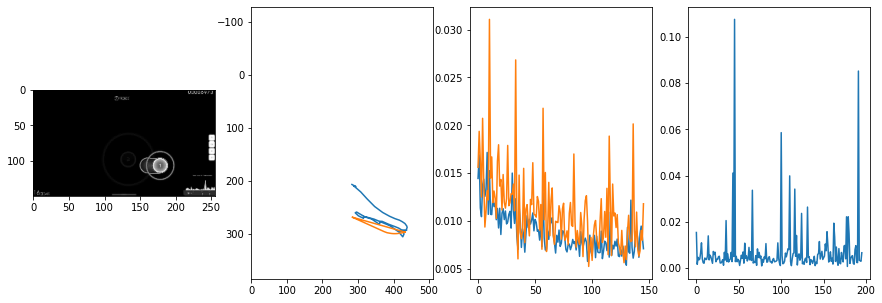


 152 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.32it/s  0.0079                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007711133503738781
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.7361972332000732 0.8858165144920349
gt: 0.4252077639102936 0.9705801606178284
(113, 130)


<Figure size 1080x360 with 0 Axes>

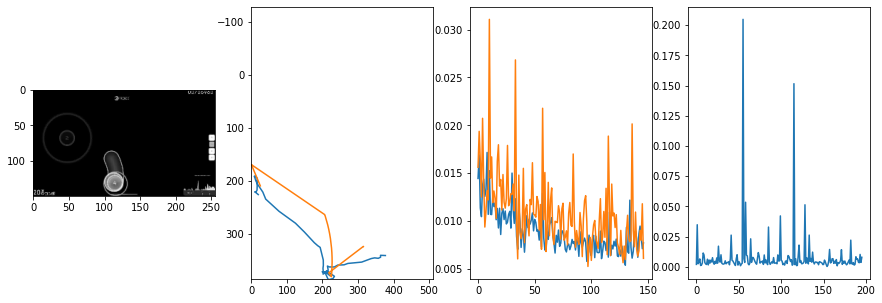


 153 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:15<00:00:00  13.00it/s  0.0054                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.010015874951858102
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.2967100441455841 0.9006981253623962
gt: 0.37499934434890747 0.8255211710929871
(106, 114)


<Figure size 1080x360 with 0 Axes>

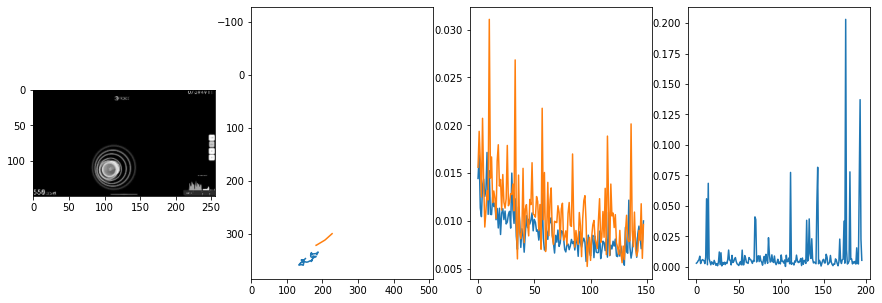


 154 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.09it/s  0.0090                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008266005241573428
outliers: 17
retrain: 8                 
val: 50/50 loss: 0.0017                                    
pred: 0.43410807847976685 0.5044618844985962
gt: 0.3437499701976776 0.5208333134651184
(101, 78)


<Figure size 1080x360 with 0 Axes>

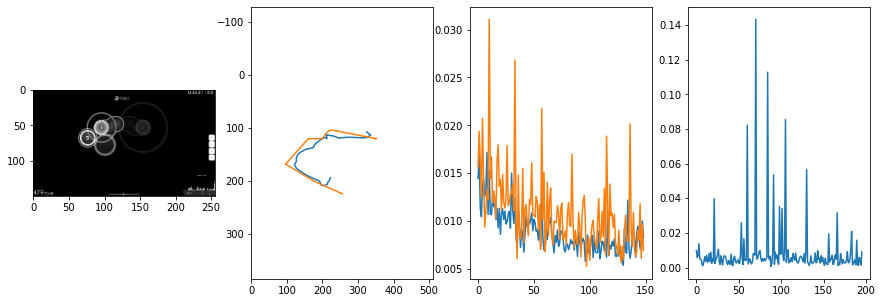


 155 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:15<00:00:00  13.05it/s  0.0081                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007696937006715286
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0023                                    
pred: 0.7889589071273804 0.5994825959205627
gt: 0.637125551700592 0.6558666229248047
(146, 94)


<Figure size 1080x360 with 0 Axes>

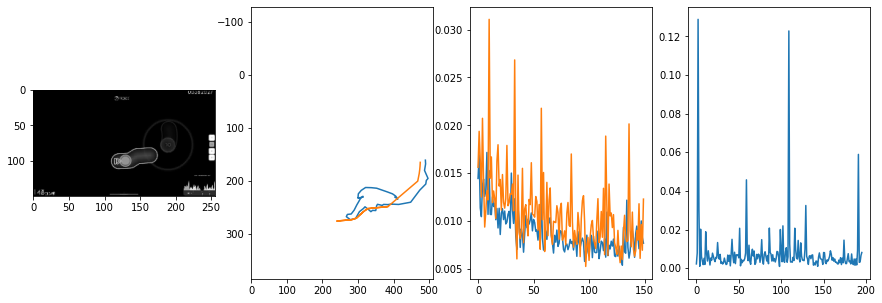


 156 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.25it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009120485964837027
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0025                                    
pred: 0.32958388328552246 0.6921886801719666
gt: 0.33662500977516174 0.36550000309944153
(100, 60)


<Figure size 1080x360 with 0 Axes>

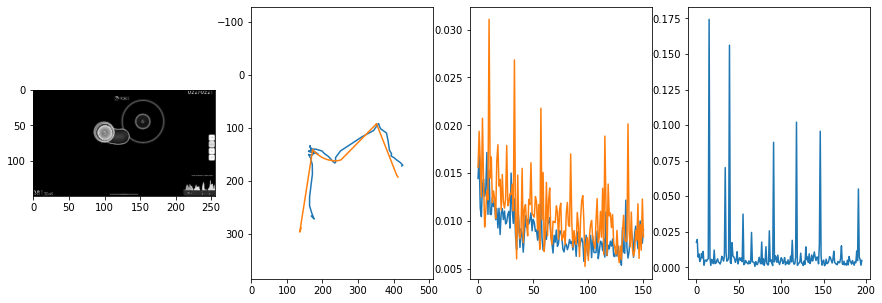


 157 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.23it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009536530794896546
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0093                                    
pred: 0.6391010284423828 0.3634159564971924
gt: 0.40627971291542053 0.06252288818359375
(111, 25)


<Figure size 1080x360 with 0 Axes>

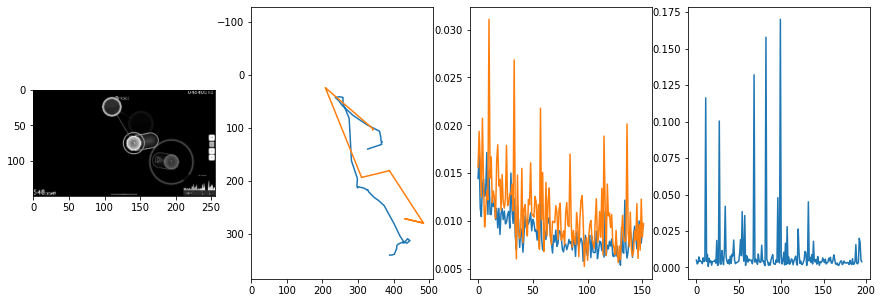


 158 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.16it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00854500144754527
outliers: 25
retrain: 8                 
val: 50/50 loss: 0.0031                                    
pred: 0.3844391703605652 0.6279573440551758
gt: 0.21875 0.6458333134651184
(81, 93)


<Figure size 1080x360 with 0 Axes>

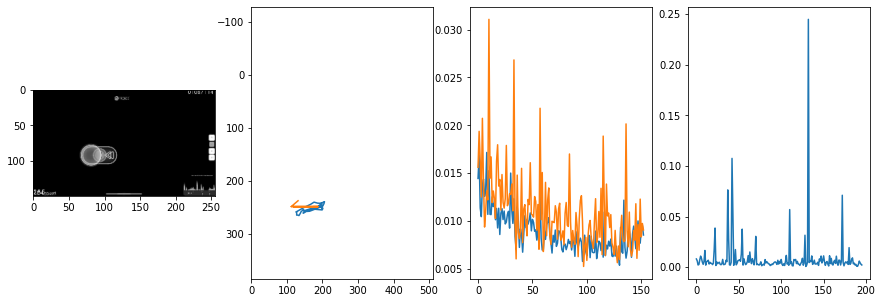


 159 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.17it/s  0.0096                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006802311343228806
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.9416841864585876 0.8162059783935547
gt: 0.6347657442092896 0.786458432674408
(146, 109)


<Figure size 1080x360 with 0 Axes>

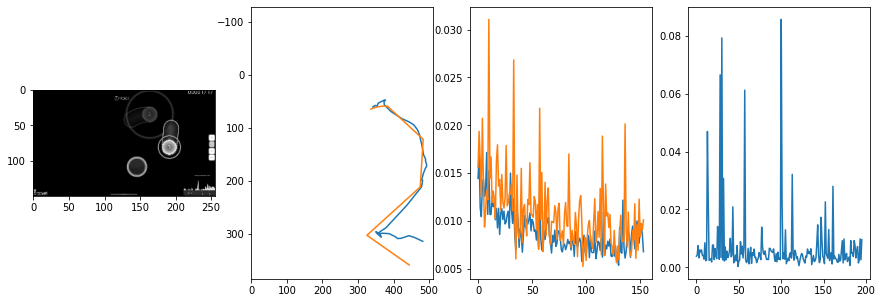


 160 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.21it/s  0.0017                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00877453106347405
outliers: 65
retrain: 8                 
val: 50/50 loss: 0.0067                                    
pred: 0.5060825943946838 0.4733428955078125
gt: 0.4103583097457886 0.5516589283943176
(111, 82)


<Figure size 1080x360 with 0 Axes>

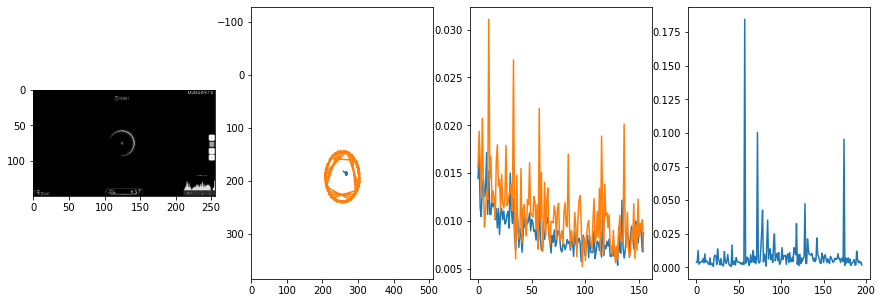


 161 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.16it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007426401696165511
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.38942039012908936 0.6690071225166321
gt: 0.39443013072013855 0.6894299387931824
(109, 98)


<Figure size 1080x360 with 0 Axes>

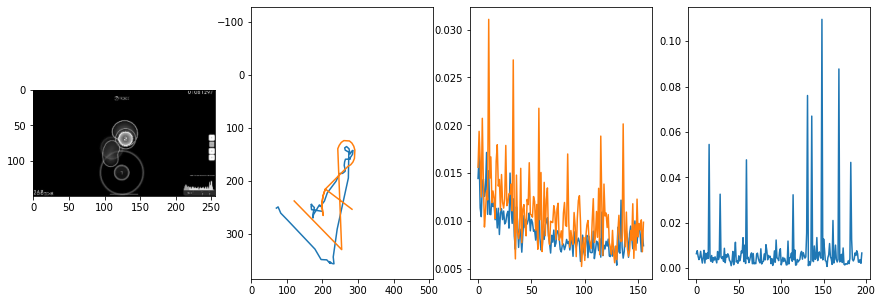


 162 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.16it/s  0.0058                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0075204614298928964
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0039                                    
pred: 0.437621146440506 0.6332062482833862
gt: 0.4921875 0.8645833134651184
(124, 118)


<Figure size 1080x360 with 0 Axes>

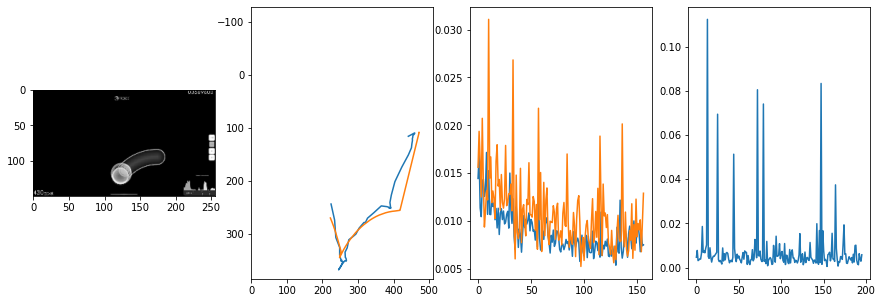


 163 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0046                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008531725765574172
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.2142537534236908 0.37615683674812317
gt: 0.26171875 0.4036458432674408
(88, 64)


<Figure size 1080x360 with 0 Axes>

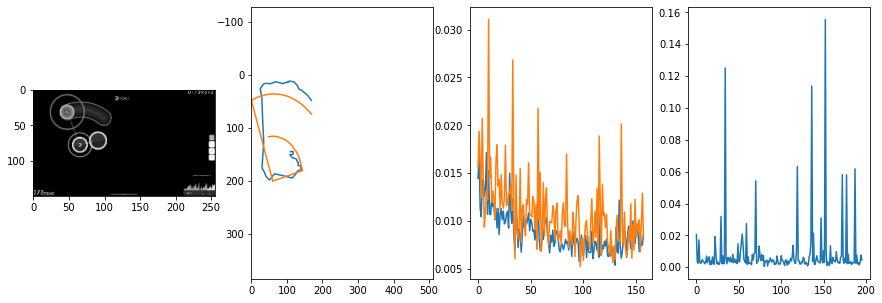


 164 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007571843304559684
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0036                                    
pred: 0.46570849418640137 0.7902470827102661
gt: 0.5 0.8125
(125, 112)


<Figure size 1080x360 with 0 Axes>

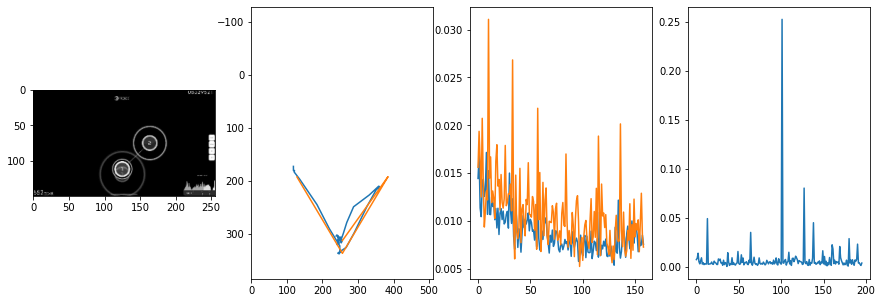


 165 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.90it/s  0.0074                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005520217824039496
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0080                                    
pred: 0.7898135185241699 0.8683035373687744
gt: 0.640260636806488 0.9585277438163757
(147, 129)


<Figure size 1080x360 with 0 Axes>

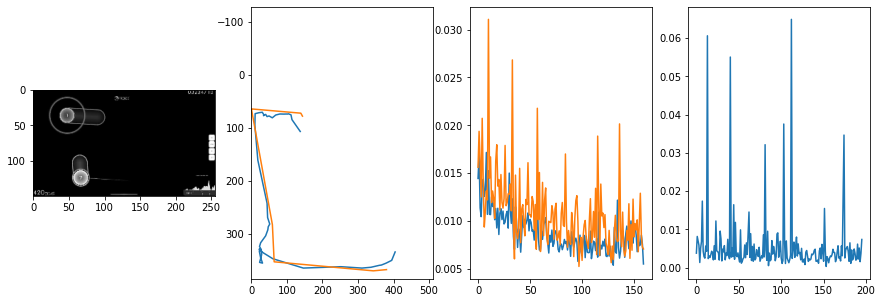


 166 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.96it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006387149776113505
outliers: 50
retrain: 8                 
val: 50/50 loss: 0.0024                                    
pred: 0.5798735022544861 0.2966446280479431
gt: 0.5585936903953552 0.4531250298023224
(134, 70)


<Figure size 1080x360 with 0 Axes>

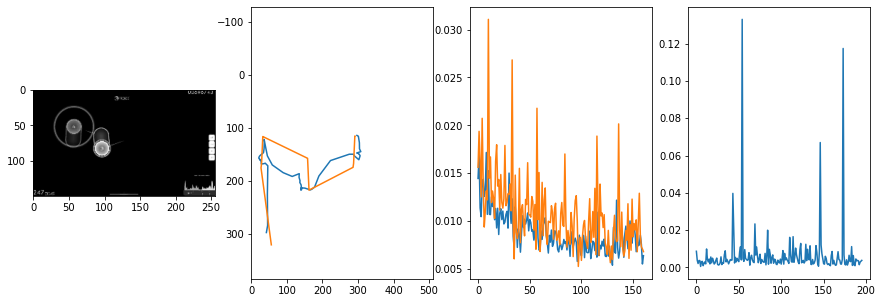


 167 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.95it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005651469497878475
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.3386460244655609 0.6157774925231934
gt: 0.46484410762786865 0.6302080750465393
(120, 91)


<Figure size 1080x360 with 0 Axes>

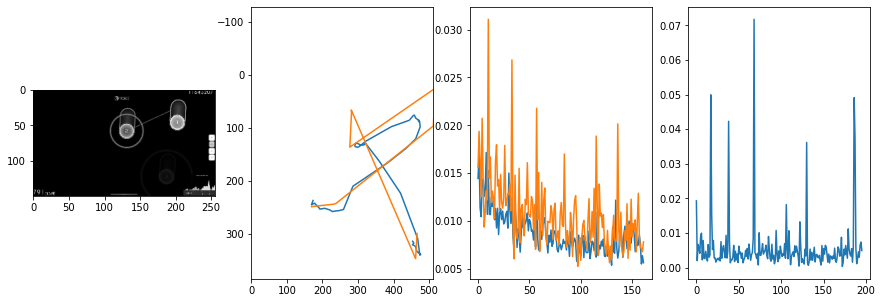


 168 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.22it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007120574738091447
outliers: 49
retrain: 8                 
val: 50/50 loss: 0.0015                                    
pred: 0.7771430015563965 0.6865591406822205
gt: 0.7200018763542175 0.8800050616264343
(159, 120)


<Figure size 1080x360 with 0 Axes>

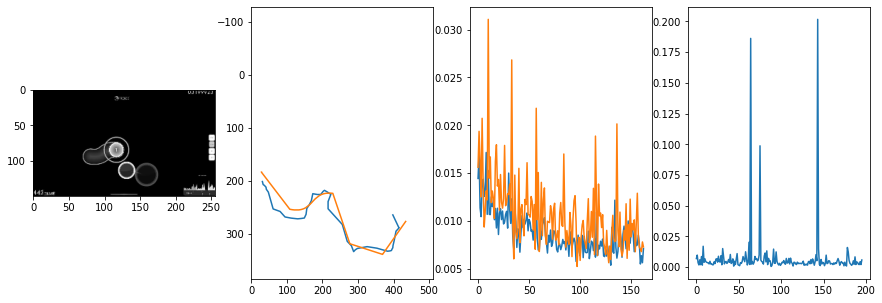


 169 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.14it/s  0.0037                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007102155156774513
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0051                                    
pred: 0.5380426645278931 0.37922054529190063
gt: 0.44335952401161194 0.5859373211860657
(116, 86)


<Figure size 1080x360 with 0 Axes>

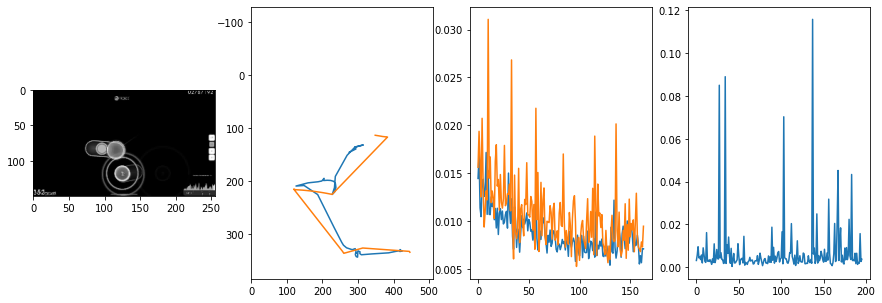


 170 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0050                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006197647025573486
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0026                                    
pred: 0.6160876154899597 0.6614035367965698
gt: 0.6085125207901001 0.7123916745185852
(142, 100)


<Figure size 1080x360 with 0 Axes>

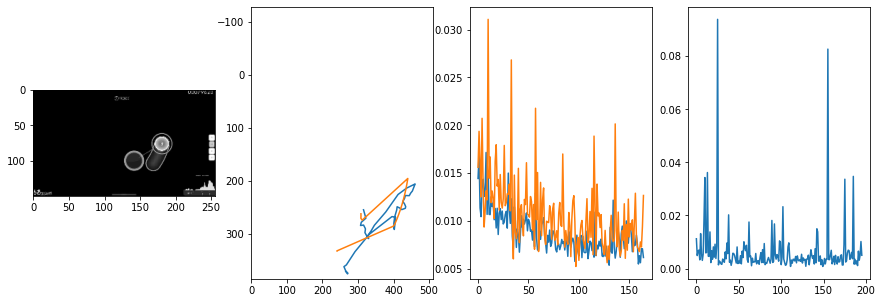


 171 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0180                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.011656065131430705
outliers: 79
retrain: 8                 
val: 50/50 loss: 0.0106                                    
pred: 0.678764283657074 0.368851900100708
gt: 0.7682029008865356 0.49639955163002014
(167, 75)


<Figure size 1080x360 with 0 Axes>

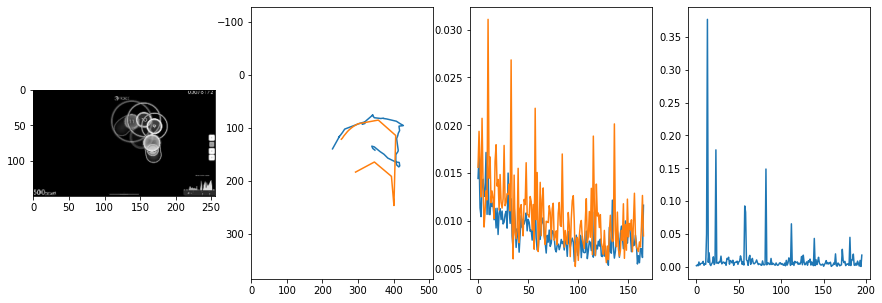


 172 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.90it/s  0.0024                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008212657918564367
outliers: 15
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.6477991938591003 0.2620091736316681
gt: 0.5117188096046448 0.2317708283662796
(127, 44)


<Figure size 1080x360 with 0 Axes>

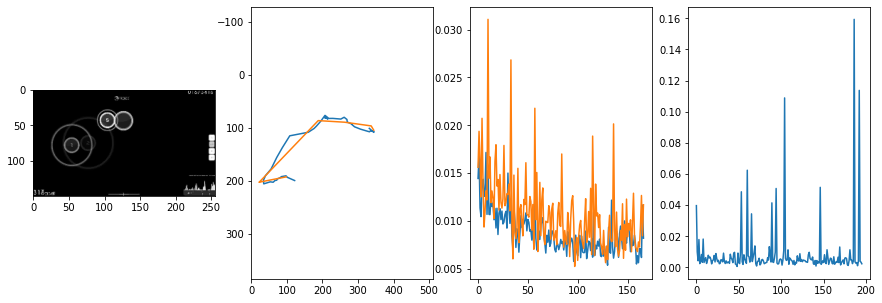


 173 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.13it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008565381204214052
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0080                                    
pred: 0.8694025278091431 0.2837969958782196
gt: 0.9303817749023438 0.4774881899356842
(192, 73)


<Figure size 1080x360 with 0 Axes>

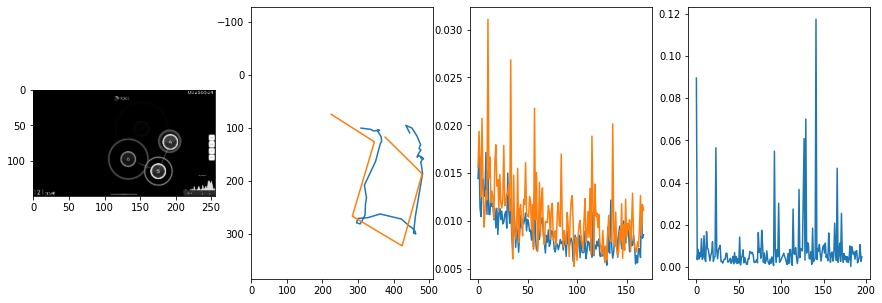


 174 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0032                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008986091974181864
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0032                                    
pred: 0.45213210582733154 0.7820802927017212
gt: 0.5827187299728394 0.9097707867622375
(138, 123)


<Figure size 1080x360 with 0 Axes>

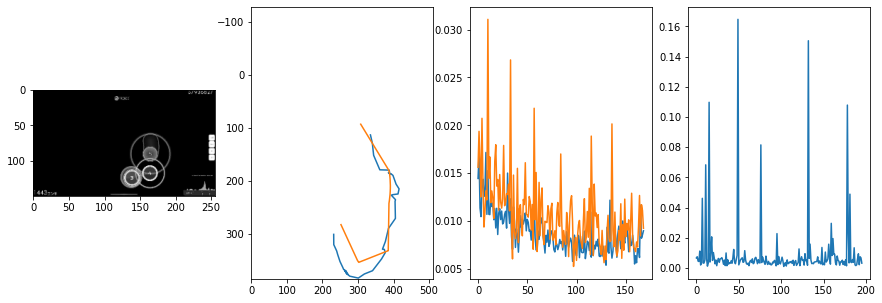


 175 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.88it/s  0.0037                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007169951920573391
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0040                                    
pred: 0.6641595363616943 0.7369452118873596
gt: 0.669308602809906 0.7356659770011902
(151, 103)


<Figure size 1080x360 with 0 Axes>

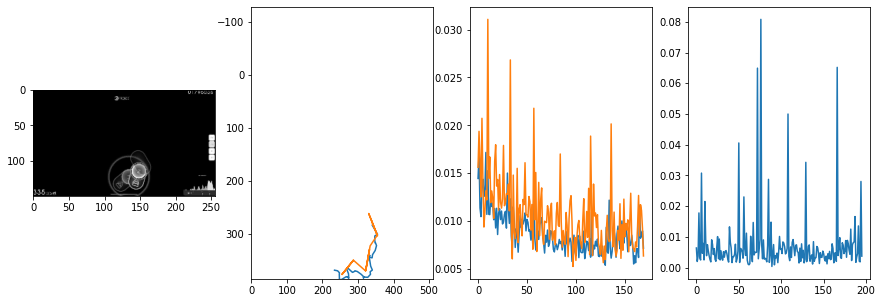


 176 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.92it/s  0.0065                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00699132559132021
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0064                                    
pred: 0.8573222160339355 0.1756855994462967
gt: 0.8332739472389221 0.4146432876586914
(177, 66)


<Figure size 1080x360 with 0 Axes>

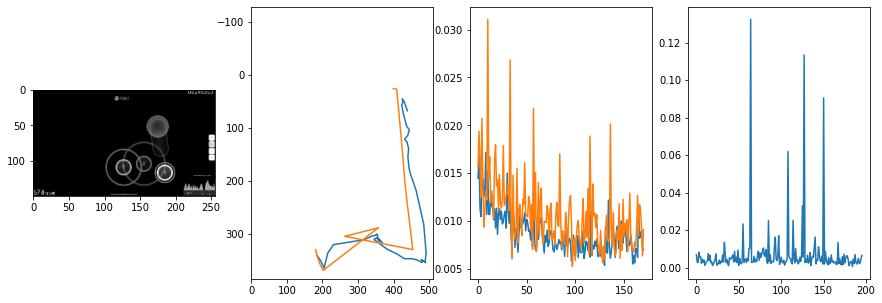


 177 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.85it/s  0.0024                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0075883553945459425
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0105                                    
pred: 0.3177080452442169 0.8013796806335449
gt: 0.3460526764392853 0.8278512358665466
(101, 114)


<Figure size 1080x360 with 0 Axes>

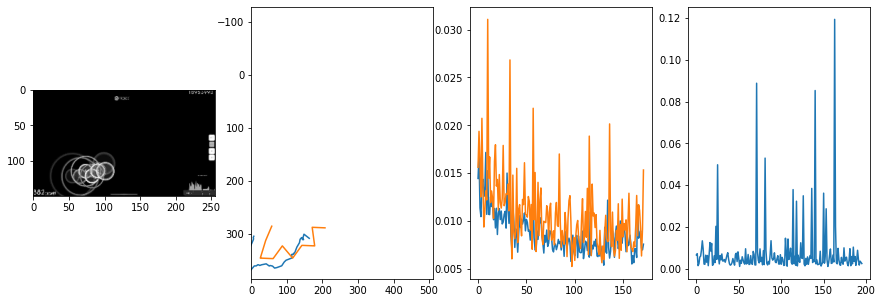


 178 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.74it/s  0.0084                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007082701173945976
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0090                                    
pred: 0.3756920099258423 0.38341349363327026
gt: 0.5 0.5
(125, 76)


<Figure size 1080x360 with 0 Axes>

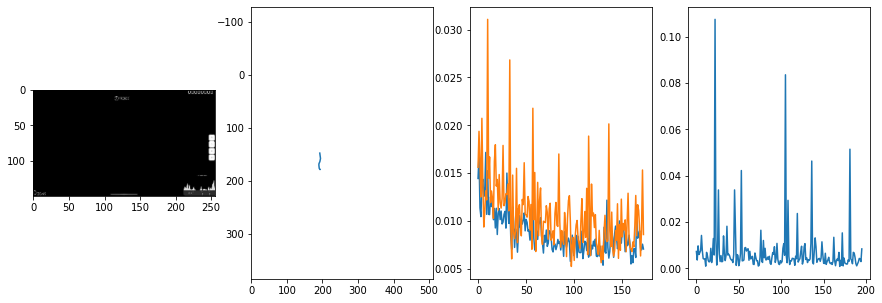


 179 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.26it/s  0.0025                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006960821293376989
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0053                                    
pred: 0.8261822462081909 0.19962351024150848
gt: 0.3965423107147217 0.33592525124549866
(109, 57)


<Figure size 1080x360 with 0 Axes>

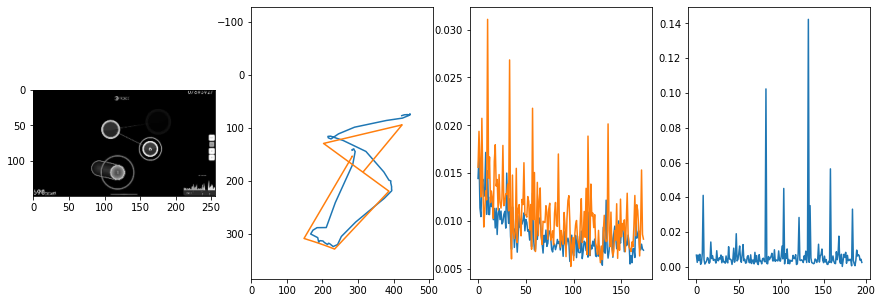


 180 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.95it/s  0.0152                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008156422944234598
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0105                                    
pred: 0.4648143947124481 0.3861808776855469
gt: 0.486328125 0.3802083432674408
(123, 62)


<Figure size 1080x360 with 0 Axes>

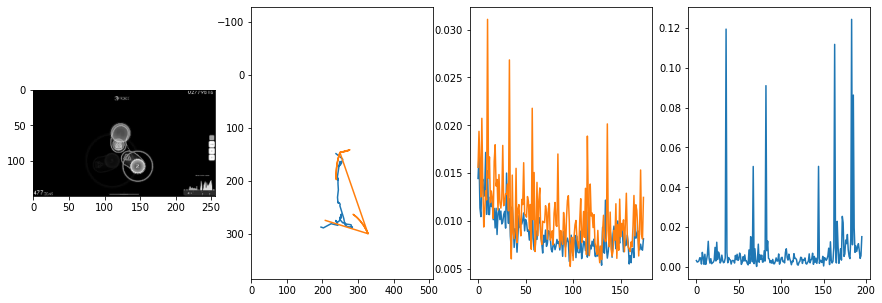


 181 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0020                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008438465042023122
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0101                                    
pred: 0.5566794276237488 0.2374265193939209
gt: 0.3451249897480011 0.6867291927337646
(101, 97)


<Figure size 1080x360 with 0 Axes>

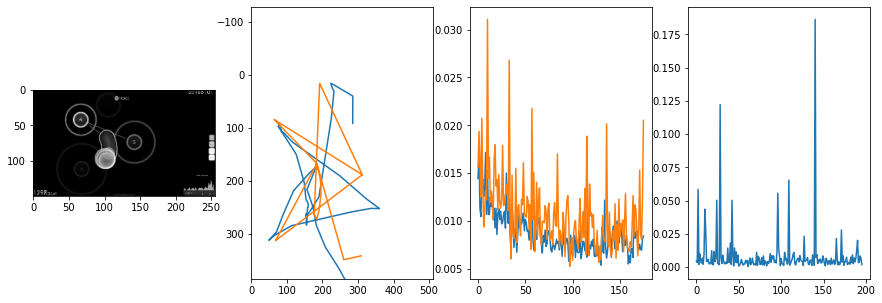


 182 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.89it/s  0.0085                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005767712613083042
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.24256061017513275 0.6561959385871887
gt: 0.050788819789886475 0.5312108397483826
(55, 79)


<Figure size 1080x360 with 0 Axes>

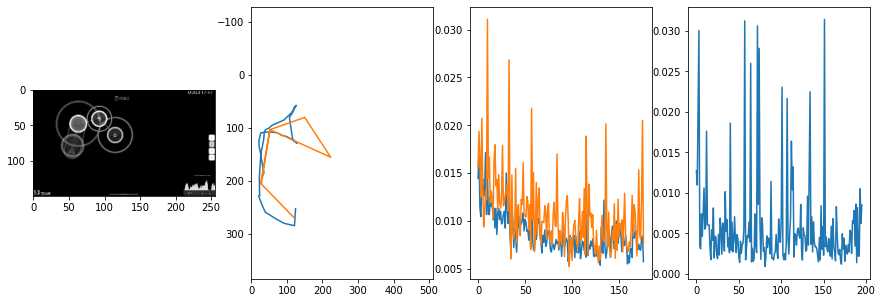


 183 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0035                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006631557392229669
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0051                                    
pred: 0.40723931789398193 0.3573787808418274
gt: 0.2500001788139343 0.3854166269302368
(86, 62)


<Figure size 1080x360 with 0 Axes>

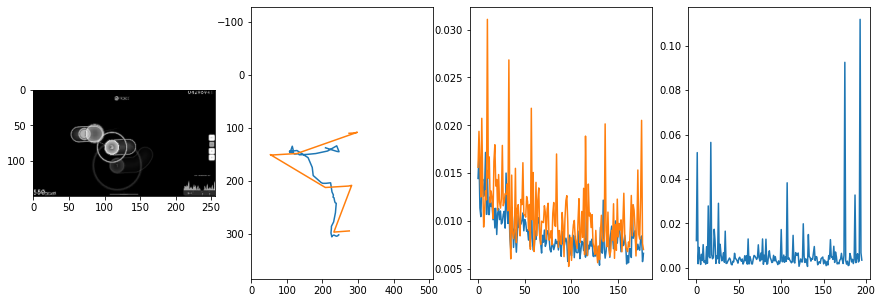


 184 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.94it/s  0.0032                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007566350388663764
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0083                                    
pred: 0.22274428606033325 0.9947965145111084
gt: 0.17382854223251343 0.8984365463256836
(74, 122)


<Figure size 1080x360 with 0 Axes>

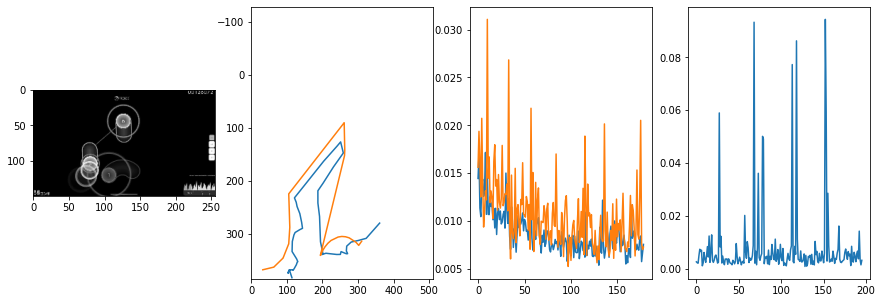


 185 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0050                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005899822771221361
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0081                                    
pred: 0.5206782817840576 0.24406211078166962
gt: 0.5887417197227478 0.525795042514801
(139, 79)


<Figure size 1080x360 with 0 Axes>

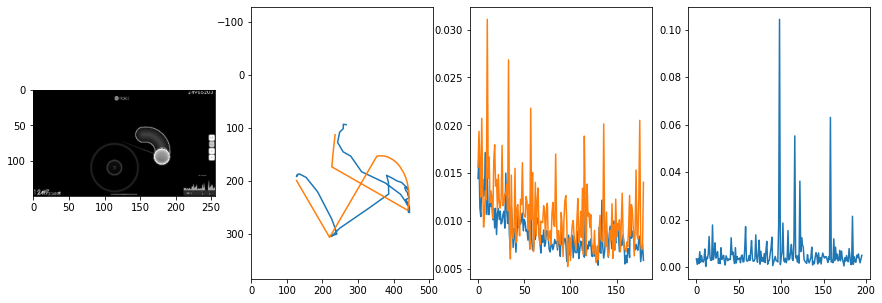


 186 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.91it/s  0.0015                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00840379228834443
outliers: 56
retrain: 8                 
val: 50/50 loss: 0.0045                                    
pred: 0.8032896518707275 0.5666345357894897
gt: 0.9446598291397095 0.6021826863288879
(194, 88)


<Figure size 1080x360 with 0 Axes>

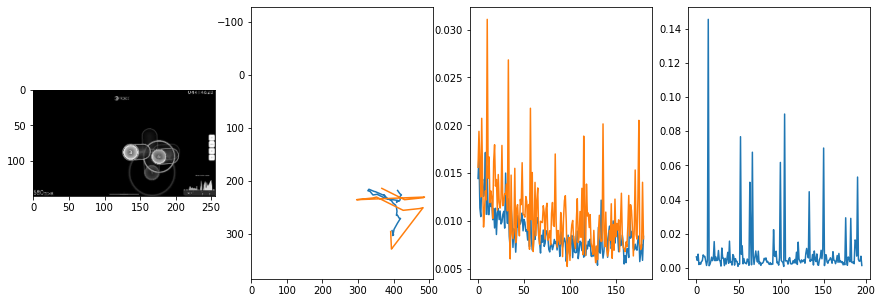


 187 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.18it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006563069474377327
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.5017492771148682 0.45327630639076233
gt: 0.6992247700691223 0.42989909648895264
(156, 68)


<Figure size 1080x360 with 0 Axes>

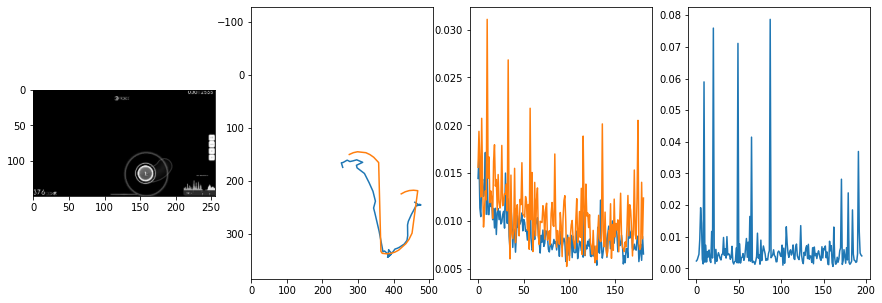


 188 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.00it/s  0.0020                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008509705430288722
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0050                                    
pred: 0.3880653977394104 0.42238688468933105
gt: 0.36847928166389465 0.4324566423892975
(105, 68)


<Figure size 1080x360 with 0 Axes>

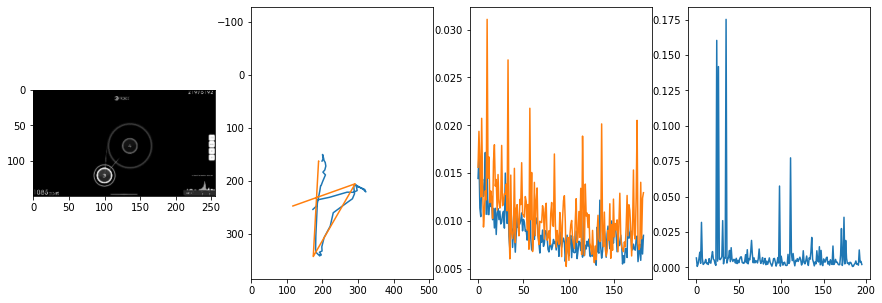


 189 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.94it/s  0.0018                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005491904284786053
outliers: 15
retrain: 8                 
val: 50/50 loss: 0.0075                                    
pred: 0.45678651332855225 0.3781901001930237
gt: 0.4049995541572571 0.8908674716949463
(110, 121)


<Figure size 1080x360 with 0 Axes>

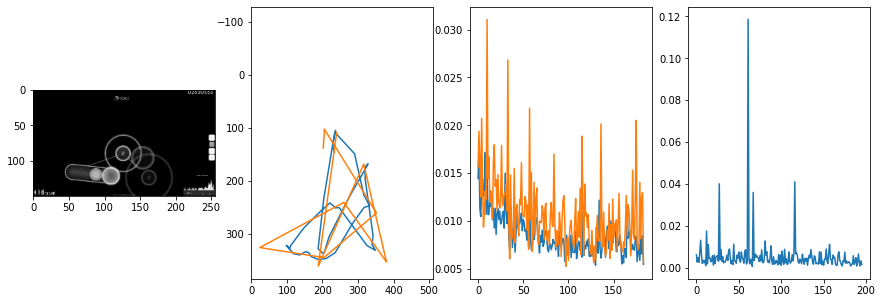


 190 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.22it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008843564865243507
outliers: 69
retrain: 8                 
val: 50/50 loss: 0.0144                                    
pred: 0.5357388854026794 0.4487547278404236
gt: 0.34454911947250366 0.33415424823760986
(101, 56)


<Figure size 1080x360 with 0 Axes>

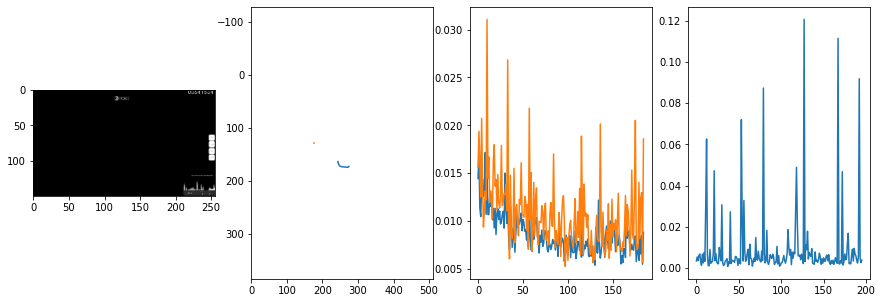


 191 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008089058744431265
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0039                                    
pred: 0.8590033650398254 0.22170308232307434
gt: 0.6621072888374329 0.16406340897083282
(150, 37)


<Figure size 1080x360 with 0 Axes>

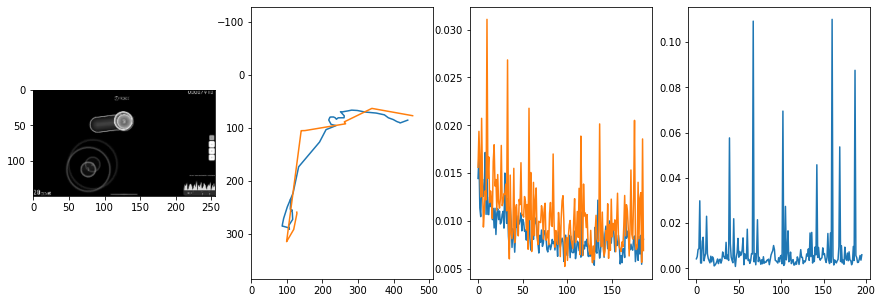


 192 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  14.00it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00856302523800191
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.8802280426025391 0.6651959419250488
gt: 0.8280656933784485 0.7890875935554504
(176, 109)


<Figure size 1080x360 with 0 Axes>

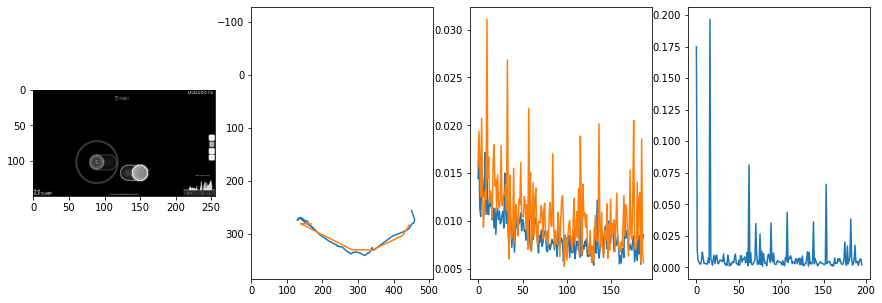


 193 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.05it/s  0.0066                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006746831575286223
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0103                                    
pred: 0.646877646446228 0.7228527069091797
gt: 0.7197145223617554 0.8324096202850342
(159, 114)


<Figure size 1080x360 with 0 Axes>

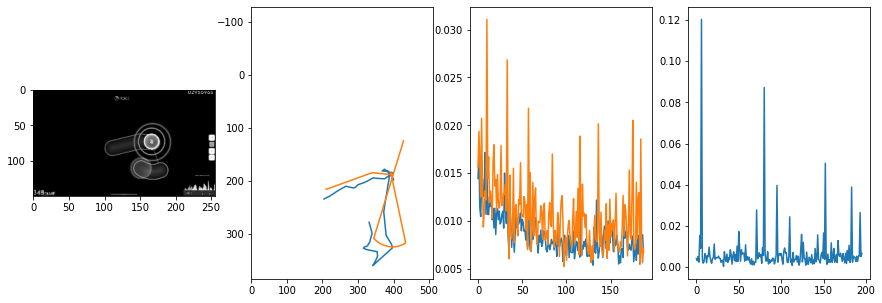


 194 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0047                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006433226253685294
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0026                                    
pred: 0.1861756443977356 0.7749923467636108
gt: 0.12890654802322388 0.38021883368492126
(67, 62)


<Figure size 1080x360 with 0 Axes>

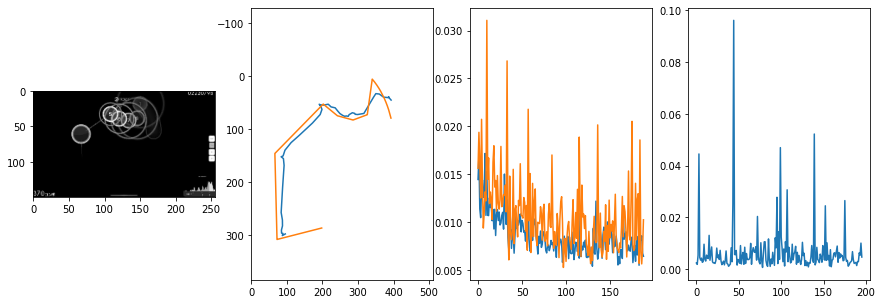


 195 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.32it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007107734364191336
outliers: 39
retrain: 8                 
val: 50/50 loss: 0.0008                                    
pred: 0.017033204436302185 0.505506694316864
gt: 0.053972259163856506 0.4053504168987274
(56, 65)


<Figure size 1080x360 with 0 Axes>

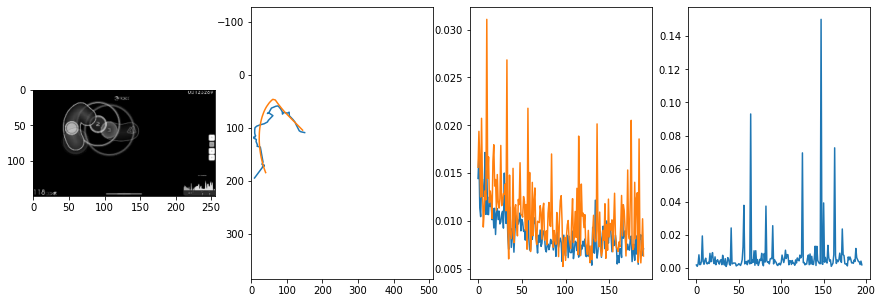


 196 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006019030885333765
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0028                                    
pred: 0.682982325553894 0.5369775295257568
gt: 0.5761709809303284 0.6432299017906189
(137, 92)


<Figure size 1080x360 with 0 Axes>

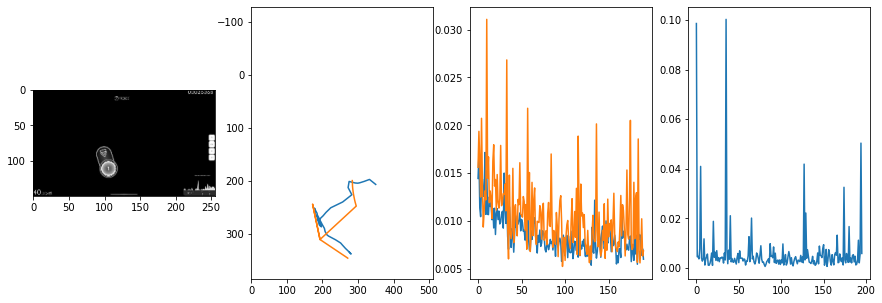


 197 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0028                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00795437636332615
outliers: 50
retrain: 8                 
val: 50/50 loss: 0.0018                                    
pred: 0.5864623188972473 0.740917444229126
gt: 0.6015599370002747 0.8125016093254089
(141, 112)


<Figure size 1080x360 with 0 Axes>

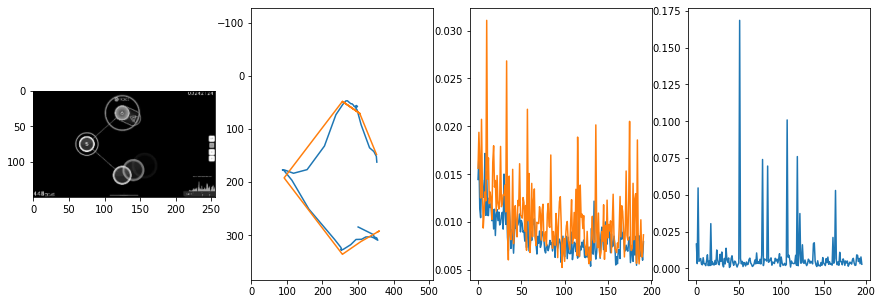


 198 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.38it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0065817889669548945
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0016                                    
pred: 0.3396942615509033 0.5634161829948425
gt: 0.2670000195503235 0.6060000061988831
(89, 88)


<Figure size 1080x360 with 0 Axes>

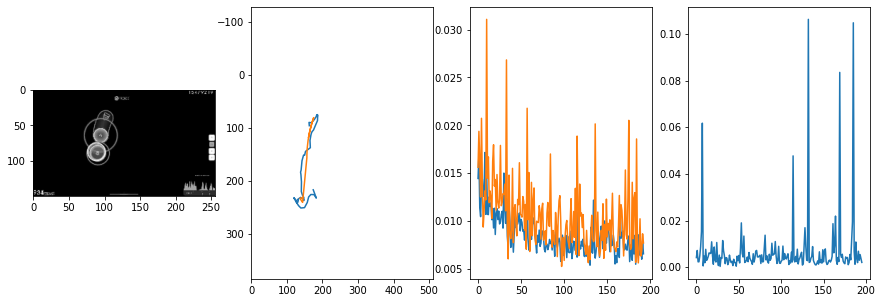


 199 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006194349807777385
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0097                                    
pred: 0.9394161701202393 0.4724990427494049
gt: 0.4998790919780731 0.5002303123474121
(125, 76)


<Figure size 1080x360 with 0 Axes>

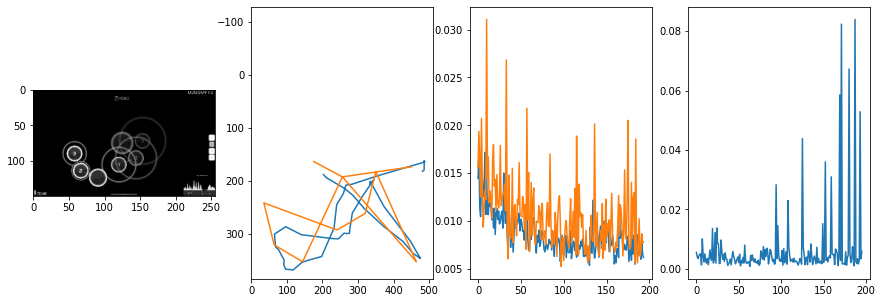


 200 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.88it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0067603258639977945
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0031                                    
pred: 0.7407829761505127 0.7961193919181824
gt: 0.9326093792915344 0.47927942872047424
(192, 73)


<Figure size 1080x360 with 0 Axes>

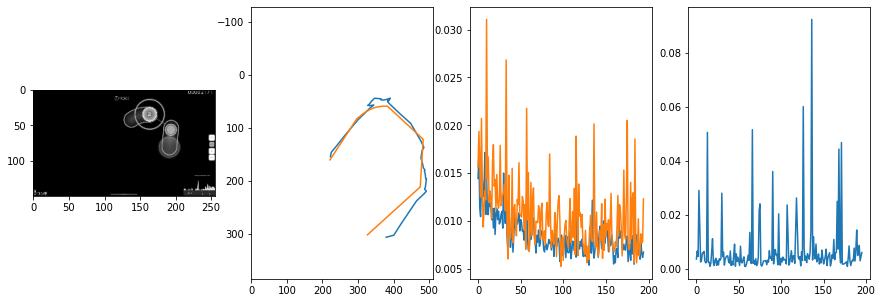


 201 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0066                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008073953186739142
outliers: 37
retrain: 8                 
val: 50/50 loss: 0.0037                                    
pred: 0.32379019260406494 0.785751223564148
gt: 0.2753901779651642 0.716145932674408
(90, 101)


<Figure size 1080x360 with 0 Axes>

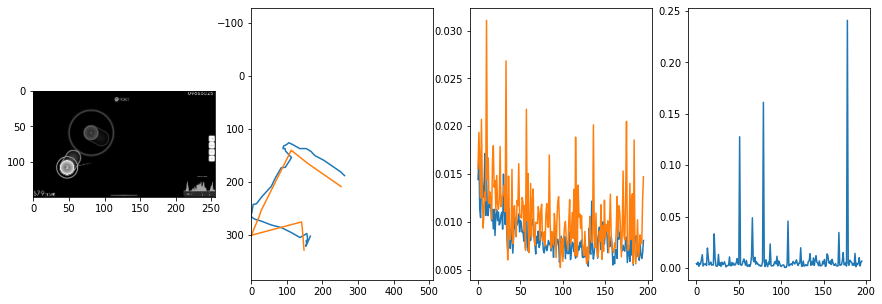


 202 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0045                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.00721424326273299
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0097                                    
pred: 0.46775755286216736 0.17789492011070251
gt: 0.529296875 0.11718752980232239
(130, 31)


<Figure size 1080x360 with 0 Axes>

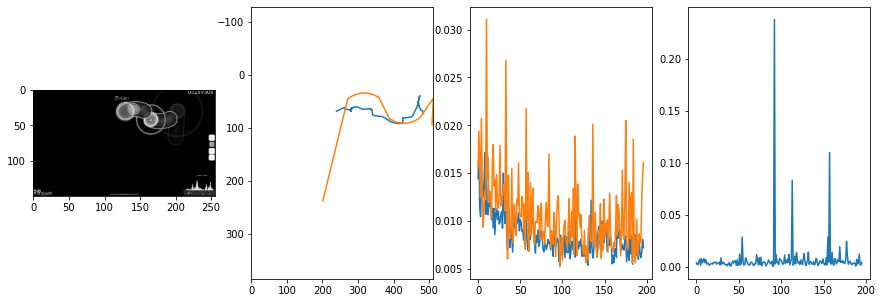


 203 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.83it/s  0.0071                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007543910772905552
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0026                                    
pred: 0.5574755668640137 0.26247361302375793
gt: 0.6406249403953552 0.3125000596046448
(147, 54)


<Figure size 1080x360 with 0 Axes>

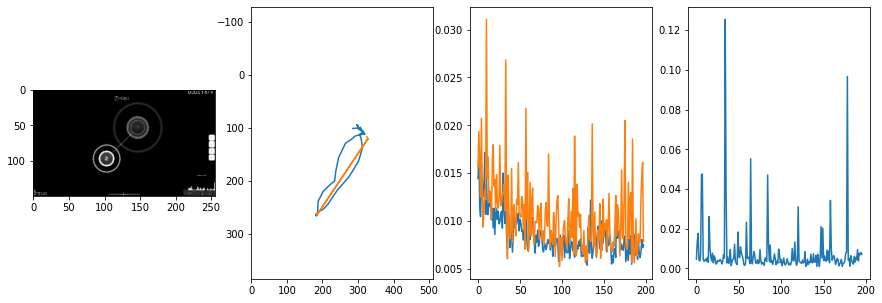


 204 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006478510652692533
outliers: 34
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.6554738283157349 0.752428412437439
gt: 0.5813451409339905 0.7248381972312927
(138, 102)


<Figure size 1080x360 with 0 Axes>

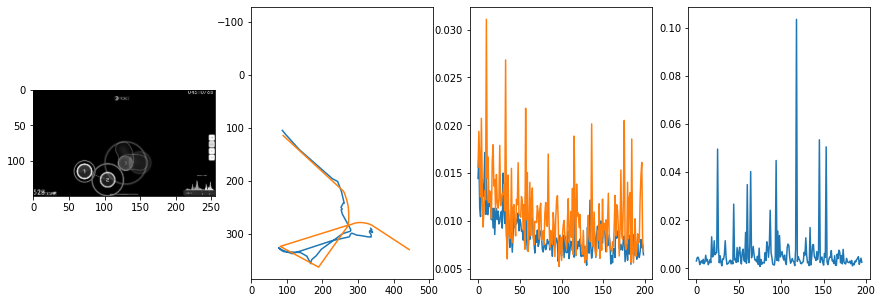


 205 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.94it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008006980105740379
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.1372                                    
pred: 0.40677398443222046 0.24394629895687103
gt: 0.8789061903953552 0.442708283662796
(184, 69)


<Figure size 1080x360 with 0 Axes>

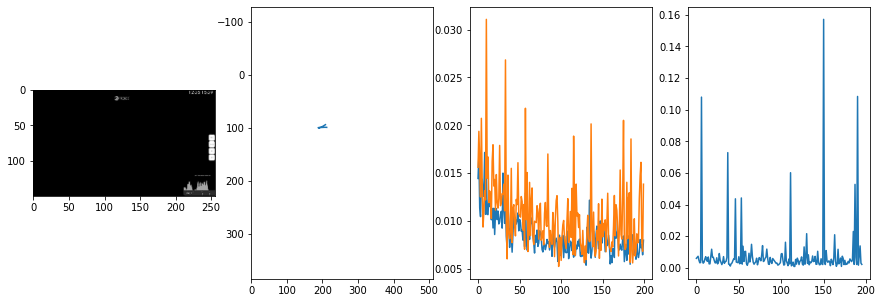


 206 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0026                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006452599549559135
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0340                                    
pred: 0.380544513463974 0.6415457725524902
gt: 0.4999993145465851 0.3880208432674408
(125, 63)


<Figure size 1080x360 with 0 Axes>

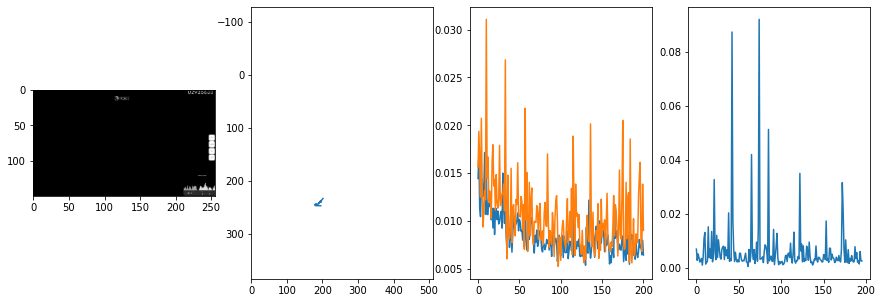


 207 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005762345829773077
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0081                                    
pred: 0.2397390902042389 0.4274969696998596
gt: 0.1484391987323761 0.38541826605796814
(71, 62)


<Figure size 1080x360 with 0 Axes>

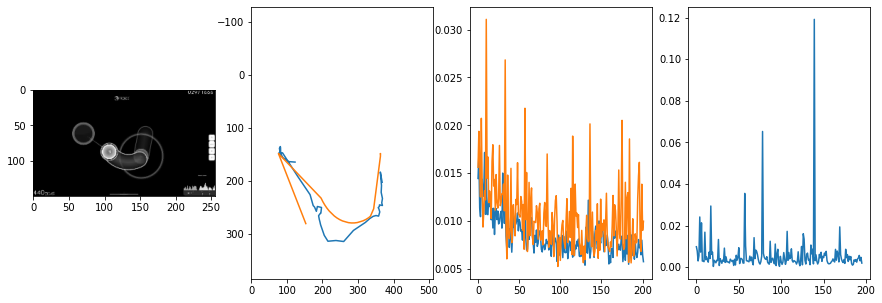


 208 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.85it/s  0.0018                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005101788005977513
outliers: 43
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.16621854901313782 0.06438641250133514
gt: 0.15123321115970612 0.19780510663986206
(71, 41)


<Figure size 1080x360 with 0 Axes>

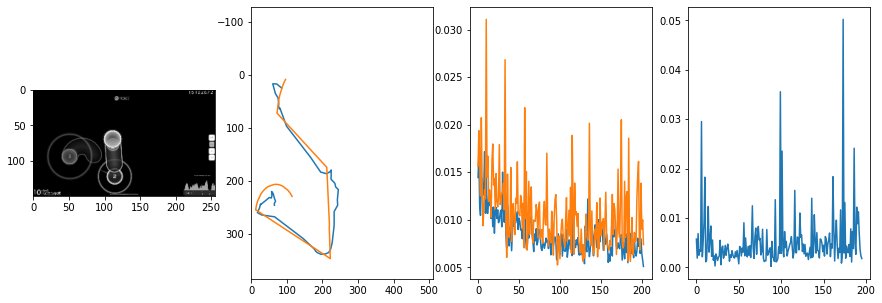


 209 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.86it/s  0.0029                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0099944753770726
outliers: 72
retrain: 8                 
val: 50/50 loss: 0.0069                                    
pred: 0.4607083201408386 0.3979479670524597
gt: 0.4857286810874939 0.33993324637413025
(123, 57)


<Figure size 1080x360 with 0 Axes>

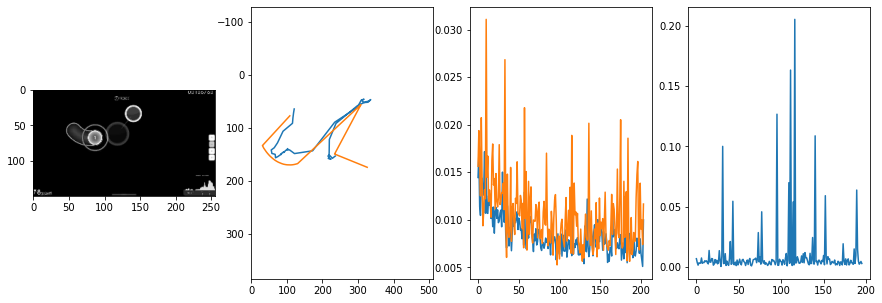


 210 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0072                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01557827126579264
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0080                                    
pred: 0.32901525497436523 0.4470207095146179
gt: 0.21473975479602814 0.11475450545549393
(81, 31)


<Figure size 1080x360 with 0 Axes>

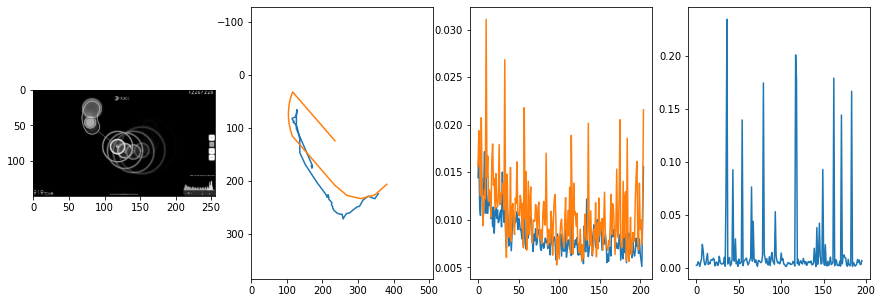


 211 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0059                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007932249859939995
outliers: 11
retrain: 8                 
val: 50/50 loss: 0.0065                                    
pred: 0.5361870527267456 0.5178413391113281
gt: 0.4302474856376648 0.40887048840522766
(114, 65)


<Figure size 1080x360 with 0 Axes>

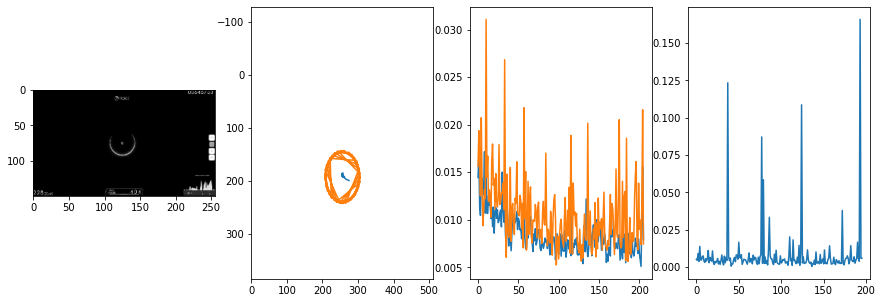


 212 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0032                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007478608334928808
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0034                                    
pred: 0.9676470756530762 0.693141758441925
gt: 0.9662125706672668 0.5570670962333679
(197, 82)


<Figure size 1080x360 with 0 Axes>

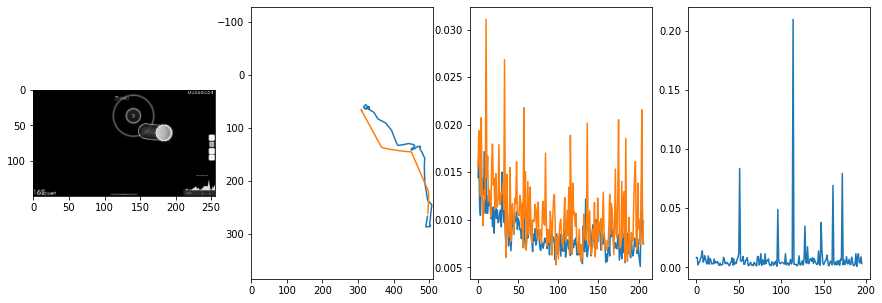


 213 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.05it/s  0.0060                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006227693418919926
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0182                                    
pred: 0.2078547477722168 0.3476986885070801
gt: 0.25590041279792786 0.29589009284973145
(87, 52)


<Figure size 1080x360 with 0 Axes>

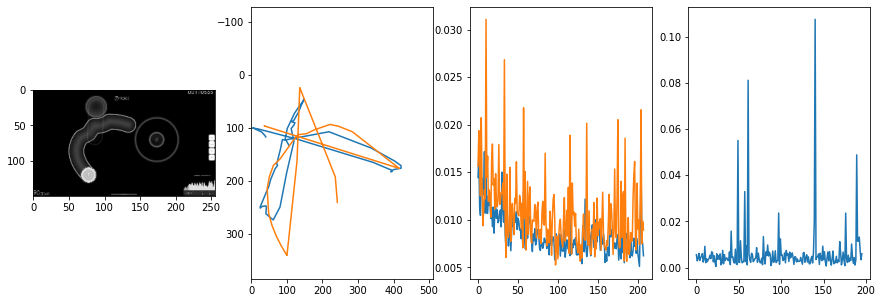


 214 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0035                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006010609771284199
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0052                                    
pred: 0.13397178053855896 0.21191322803497314
gt: 0.31541773676872253 0.3033328354358673
(96, 53)


<Figure size 1080x360 with 0 Axes>

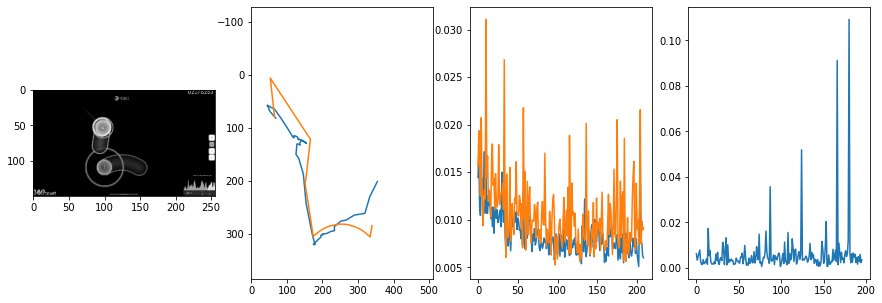


 215 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0040                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008952790367291118
outliers: 55
retrain: 8                 
val: 50/50 loss: 0.0026                                    
pred: 0.35512080788612366 0.45260781049728394
gt: 0.35861143469810486 0.5203192234039307
(103, 78)


<Figure size 1080x360 with 0 Axes>

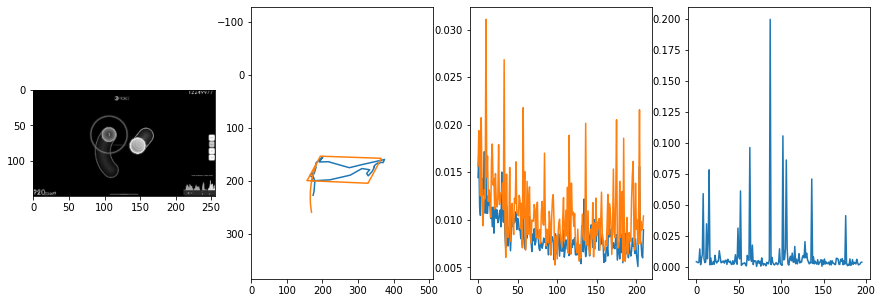


 216 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.90it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007721515471289143
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.8029549717903137 0.7937746644020081
gt: 0.8054026365280151 0.5114331841468811
(172, 77)


<Figure size 1080x360 with 0 Axes>

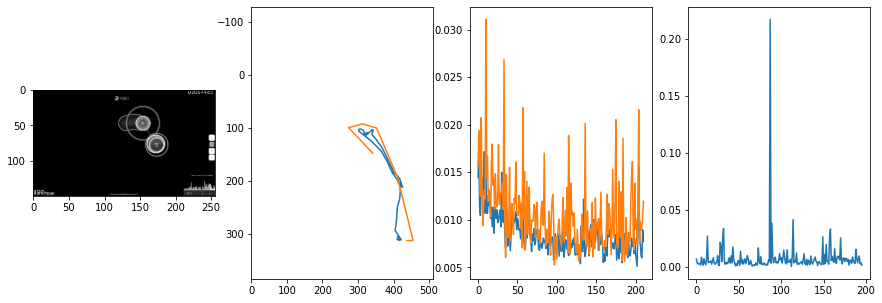


 217 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0021                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0065413578306514845
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.7638201713562012 0.629580020904541
gt: 0.8072853684425354 0.6216558814048767
(173, 90)


<Figure size 1080x360 with 0 Axes>

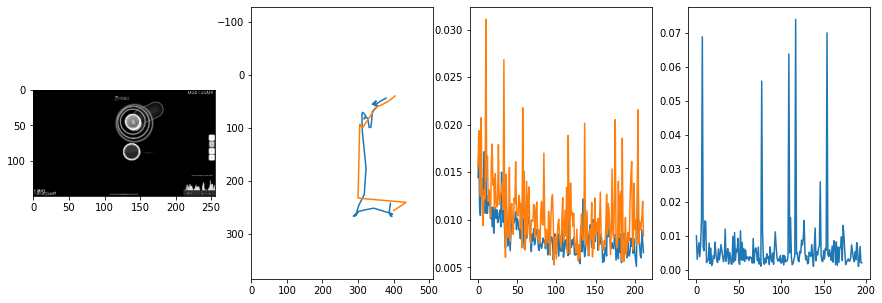


 218 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.95it/s  0.0044                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006671349648968317
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0063                                    
pred: 0.6480692028999329 0.4563564658164978
gt: 0.623046875 0.3307291865348816
(144, 56)


<Figure size 1080x360 with 0 Axes>

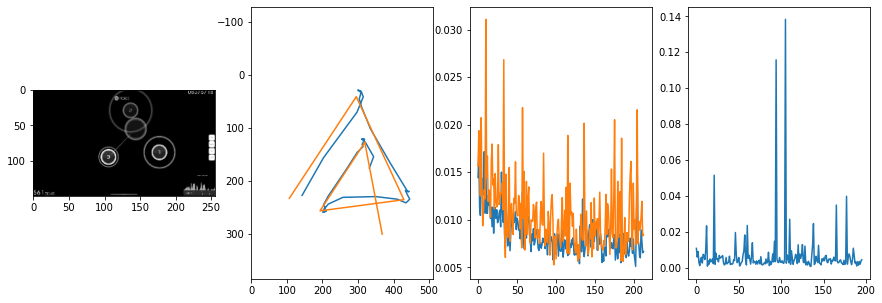


 219 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0043                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0065466676816719645
outliers: 36
retrain: 8                 
val: 50/50 loss: 0.0012                                    
pred: 0.8602827191352844 0.4370062053203583
gt: 0.40042993426322937 0.08076025545597076
(110, 27)


<Figure size 1080x360 with 0 Axes>

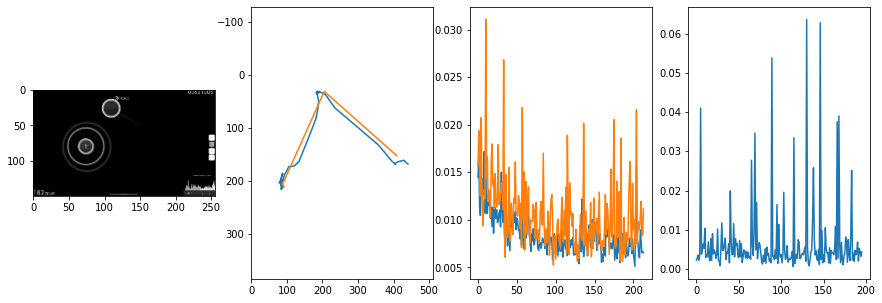


 220 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0062                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006957423571516208
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0060                                    
pred: 0.6955059766769409 0.45213639736175537
gt: 0.4874175190925598 0.6291230320930481
(123, 91)


<Figure size 1080x360 with 0 Axes>

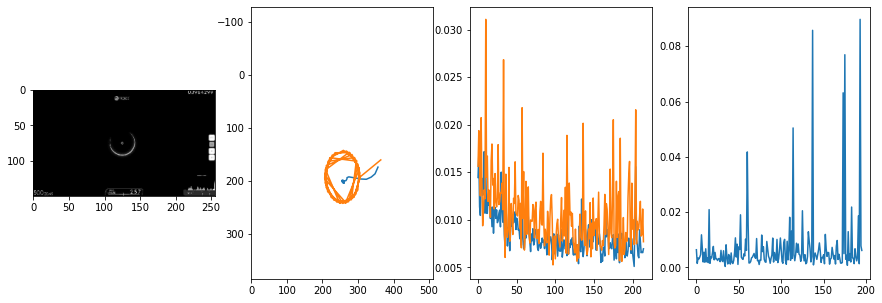


 221 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.28it/s  0.0050                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007120757424914069
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0055                                    
pred: 0.30018314719200134 0.523802638053894
gt: 0.2876255512237549 0.08662571758031845
(92, 28)


<Figure size 1080x360 with 0 Axes>

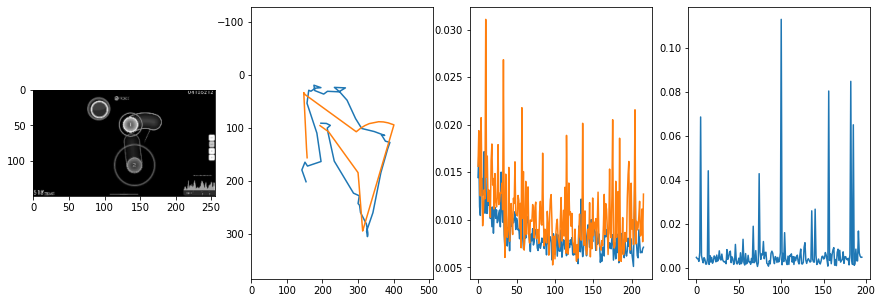


 222 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.13it/s  0.0048                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006642722328994138
outliers: 41
retrain: 8                 
val: 50/50 loss: 0.0081                                    
pred: 0.7137965559959412 0.5485384464263916
gt: 0.1875005066394806 0.7083328366279602
(77, 100)


<Figure size 1080x360 with 0 Axes>

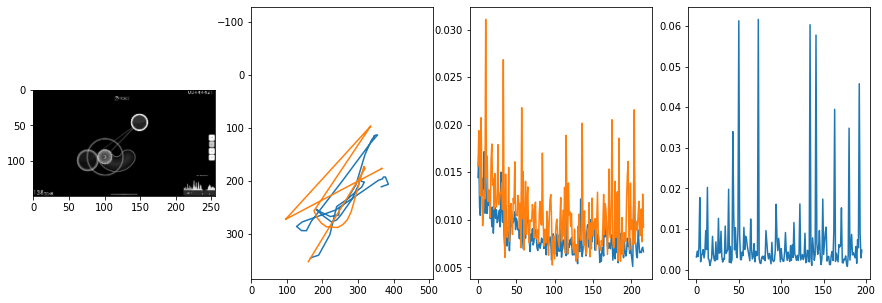


 223 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0430                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005355533756783745
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0021                                    
pred: 0.5420751571655273 0.8165885210037231
gt: 0.460647851228714 0.8793100714683533
(119, 120)


<Figure size 1080x360 with 0 Axes>

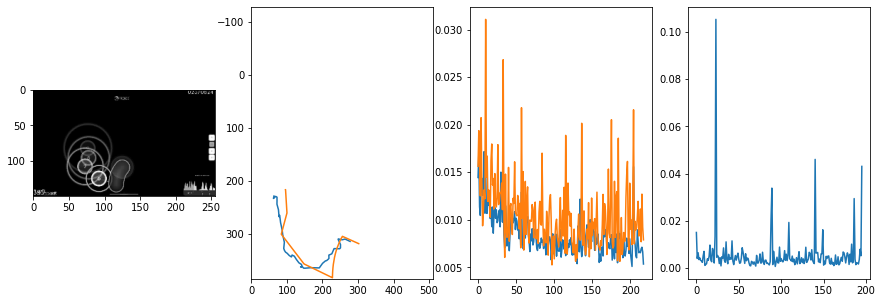


 224 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.92it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008553148016252801
outliers: 46
retrain: 8                 
val: 50/50 loss: 0.0012                                    
pred: 0.1289309859275818 0.5014400482177734
gt: 0.26998087763786316 0.5292578339576721
(89, 79)


<Figure size 1080x360 with 0 Axes>

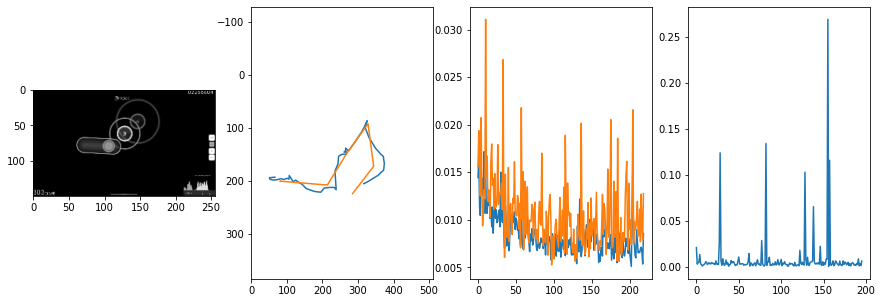


 225 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.01it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006814136422875964
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0108                                    
pred: 0.469626247882843 0.42127442359924316
gt: 0.5635599493980408 0.6905428767204285
(135, 98)


<Figure size 1080x360 with 0 Axes>

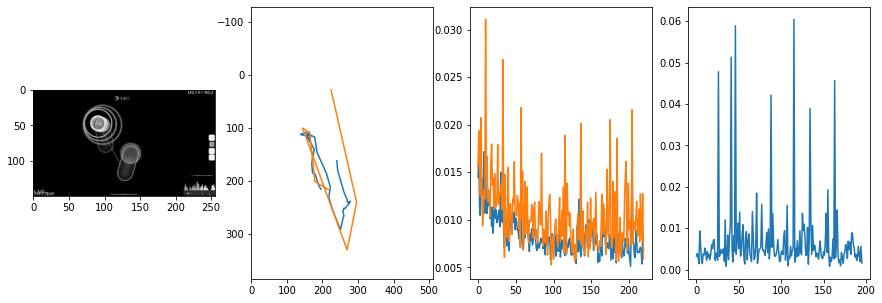


 226 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.04it/s  0.0016                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006149585234958736
outliers: 33
retrain: 8                 
val: 50/50 loss: 0.0055                                    
pred: 0.4054884910583496 0.37930887937545776
gt: 0.767578125 0.3020833432674408
(167, 53)


<Figure size 1080x360 with 0 Axes>

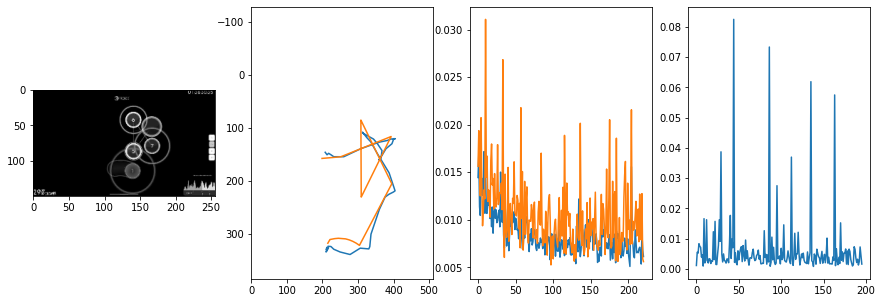


 227 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.86it/s  0.0065                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007579959670321693
outliers: 58
retrain: 8                 
val: 50/50 loss: 0.0014                                    
pred: 0.74660724401474 0.4930254817008972
gt: 0.7187514305114746 0.49999991059303284
(159, 76)


<Figure size 1080x360 with 0 Axes>

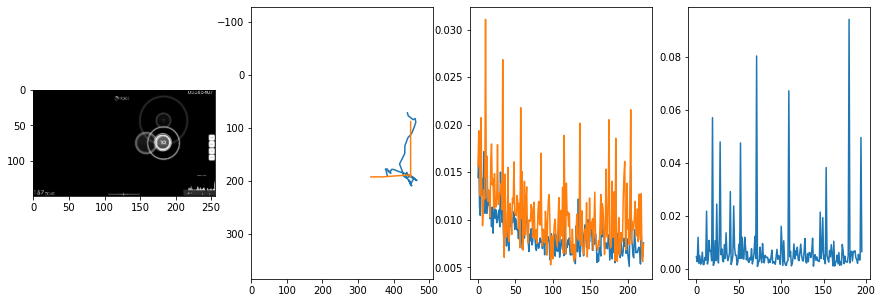


 228 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.12it/s  0.0023                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006864703547391252
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0059                                    
pred: 0.7562352418899536 0.5087652802467346
gt: 0.8154447674751282 0.5725371241569519
(174, 84)


<Figure size 1080x360 with 0 Axes>

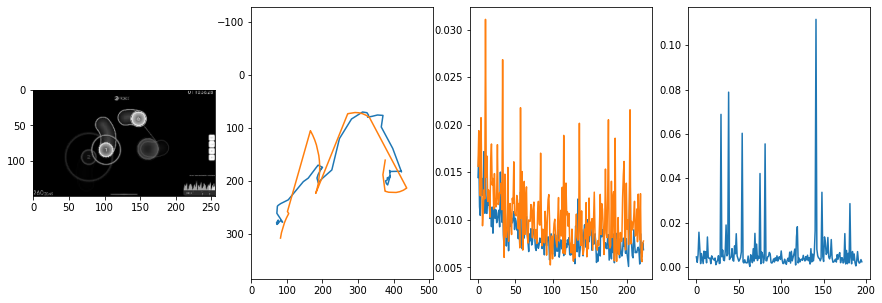


 229 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.95it/s  0.0077                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008378109252032804
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0068                                    
pred: 0.1317090392112732 0.8772255182266235
gt: 0.23828125 0.953125
(84, 128)


<Figure size 1080x360 with 0 Axes>

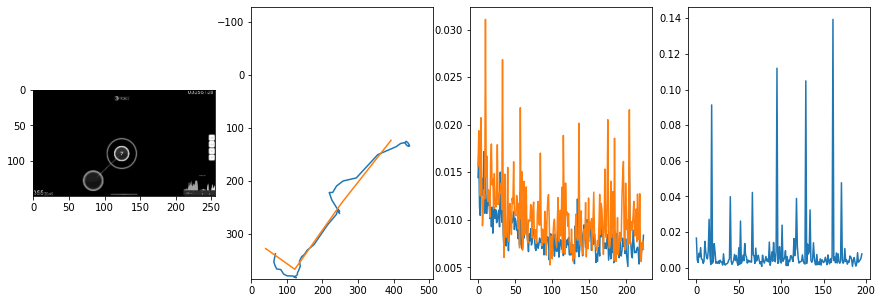


 230 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.18it/s  0.0067                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0060094813112411835
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0056                                    
pred: 0.7581051588058472 0.4173336625099182
gt: 0.7830913066864014 0.45714059472084045
(169, 71)


<Figure size 1080x360 with 0 Axes>

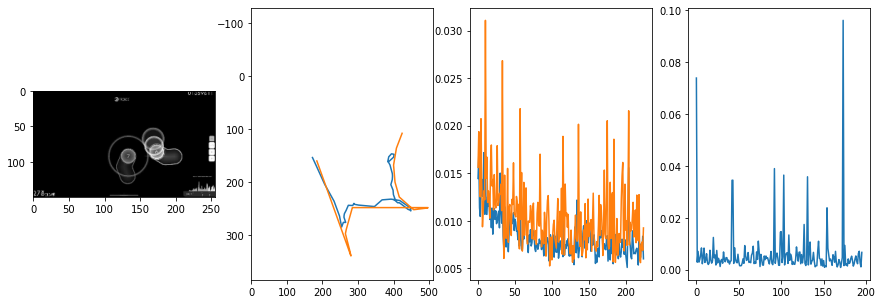


 231 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0070                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007641856195713982
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0019                                    
pred: 0.8272088766098022 0.6865852475166321
gt: 0.65625 0.6250000596046448
(149, 90)


<Figure size 1080x360 with 0 Axes>

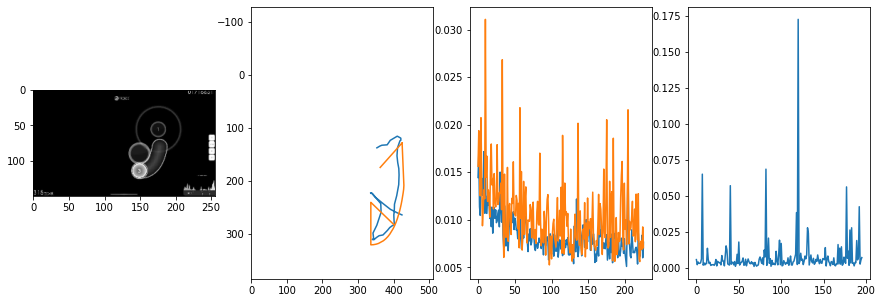


 232 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.87it/s  0.0168                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0068542373310822085
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0066                                    
pred: 0.49039384722709656 0.2890223264694214
gt: 0.47480353713035583 0.39538952708244324
(121, 63)


<Figure size 1080x360 with 0 Axes>

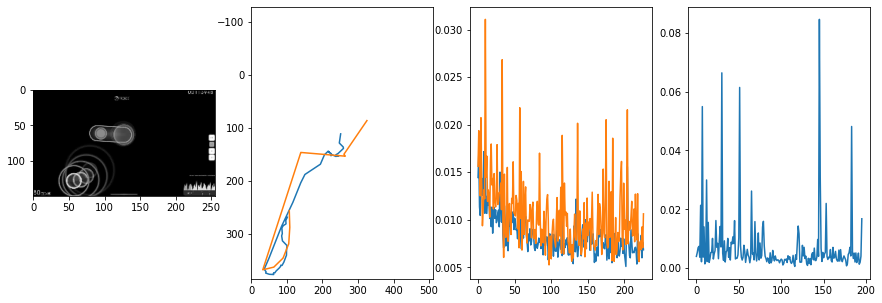


 233 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0083                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006638421239604585
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0071                                    
pred: 0.5375979542732239 0.35484904050827026
gt: 0.603590726852417 0.5165038704872131
(141, 78)


<Figure size 1080x360 with 0 Axes>

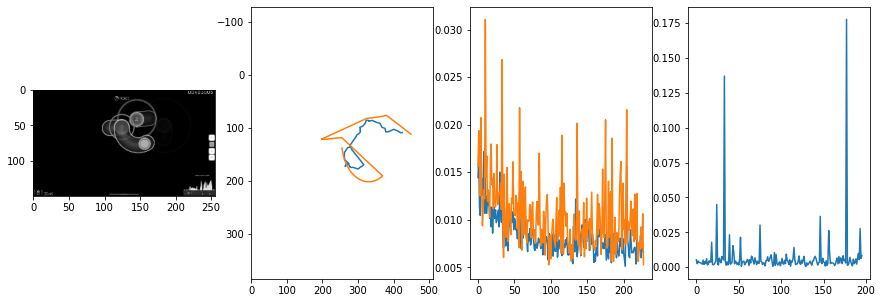


 234 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.09it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007802135330964621
outliers: 48
retrain: 8                 
val: 50/50 loss: 0.0104                                    
pred: 0.6362937688827515 0.5168431401252747
gt: 0.4630591571331024 0.14789602160453796
(119, 35)


<Figure size 1080x360 with 0 Axes>

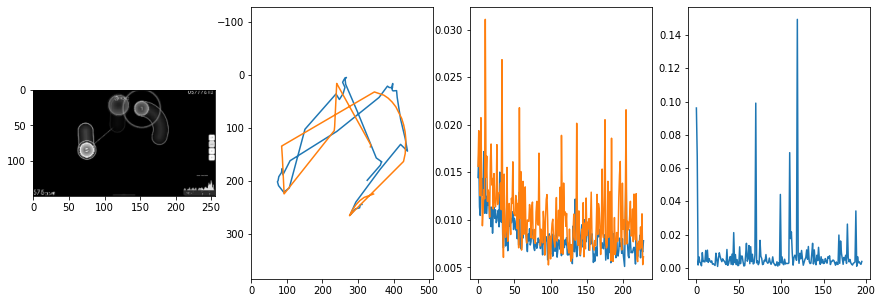


 235 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.83it/s  0.0013                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006870077448072653
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0015                                    
pred: 0.43107032775878906 0.1863492876291275
gt: 0.43496787548065186 0.03341751918196678
(115, 21)


<Figure size 1080x360 with 0 Axes>

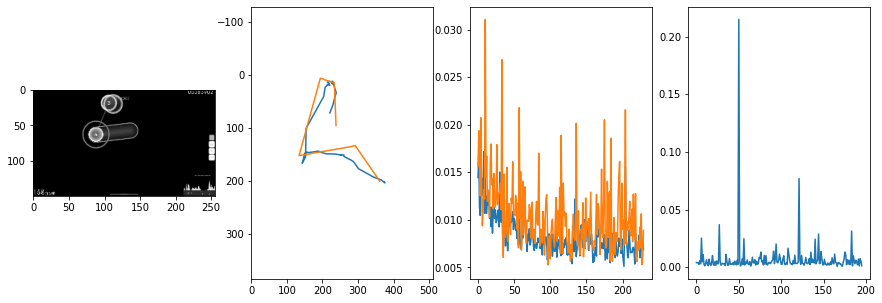


 236 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.07it/s  0.0047                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.01001221293640532
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0029                                    
pred: 0.6189125180244446 0.24746549129486084
gt: 0.2639702260494232 0.3484024107456207
(88, 58)


<Figure size 1080x360 with 0 Axes>

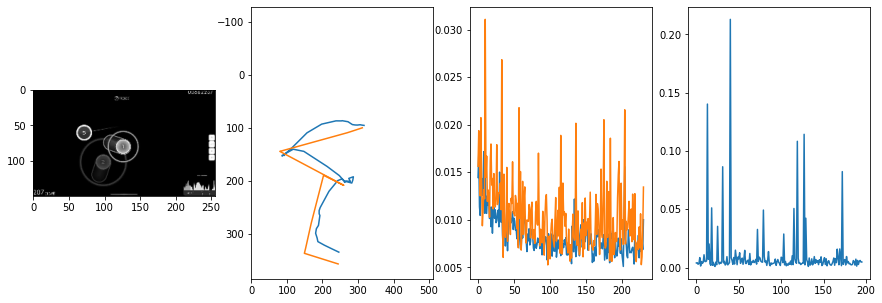


 237 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  14.00it/s  0.0019                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008524605525035069
outliers: 24
retrain: 8                 
val: 50/50 loss: 0.0053                                    
pred: 0.3613845705986023 0.4908640384674072
gt: 0.46875 0.5
(120, 76)


<Figure size 1080x360 with 0 Axes>

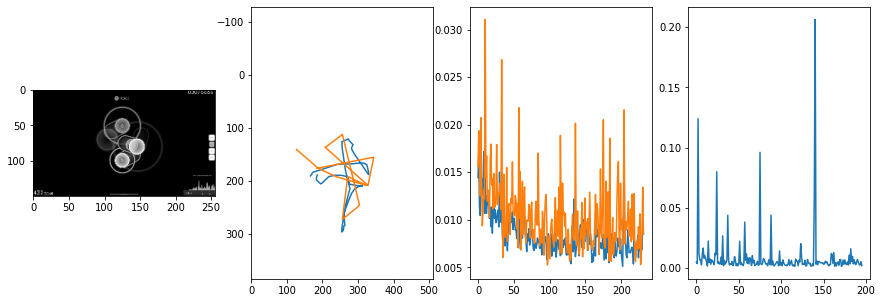


 238 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.83it/s  0.0013                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007157405810157426
outliers: 22
retrain: 8                 
val: 50/50 loss: 0.0084                                    
pred: 0.29861384630203247 0.4852546751499176
gt: 0.7337791919708252 0.2086510807275772
(161, 42)


<Figure size 1080x360 with 0 Axes>

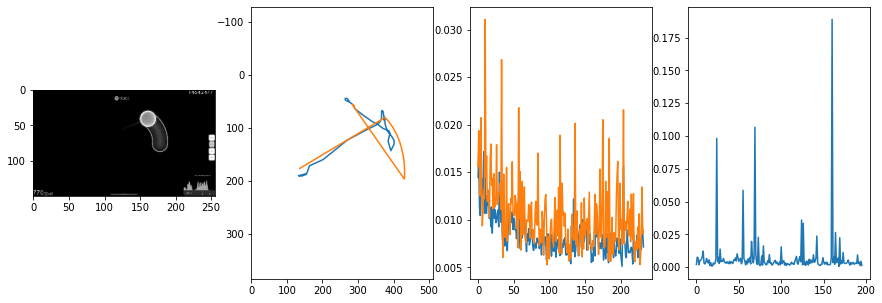


 239 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0049                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.009610537752005443
outliers: 40
retrain: 8                 
val: 50/50 loss: 0.0038                                    
pred: 0.32323968410491943 0.9252521991729736
gt: 0.4458823800086975 0.807316243648529
(117, 111)


<Figure size 1080x360 with 0 Axes>

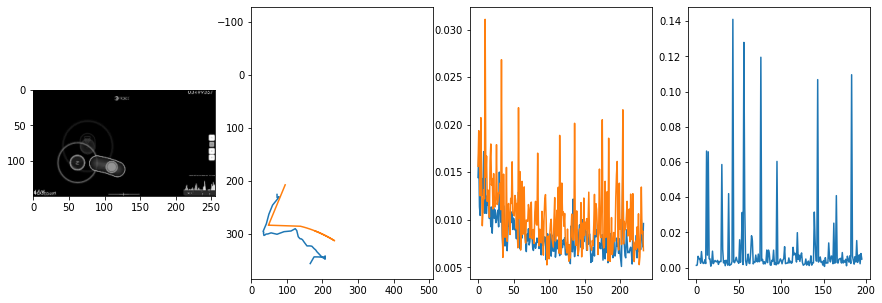


 240 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0006                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005290896118302564
outliers: 13
retrain: 8                 
val: 50/50 loss: 0.0102                                    
pred: 0.455514132976532 0.14647668600082397
gt: 0.5 0.43333330750465393
(125, 68)


<Figure size 1080x360 with 0 Axes>

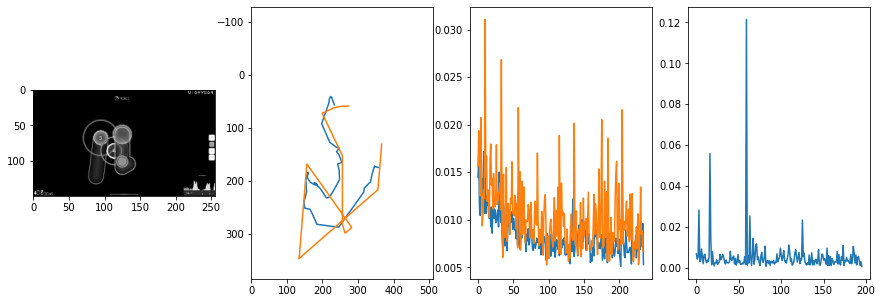


 241 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.02it/s  0.0030                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007973213487646865
outliers: 56
retrain: 8                 
val: 50/50 loss: 0.0025                                    
pred: 0.6824851036071777 0.36827611923217773
gt: 0.7576855421066284 0.41545867919921875
(165, 66)


<Figure size 1080x360 with 0 Axes>

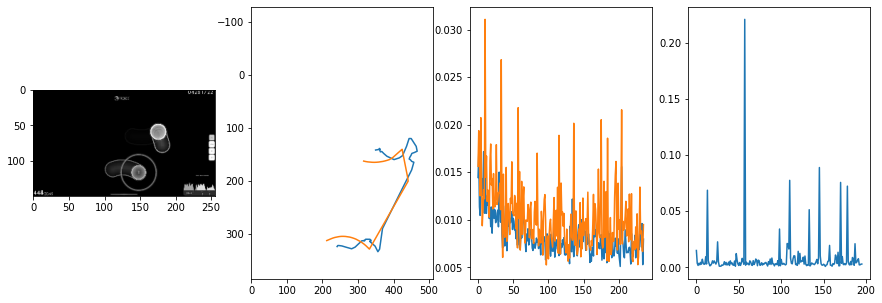


 242 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.08it/s  0.0103                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005650997897479398
outliers: 30
retrain: 8                 
val: 50/50 loss: 0.0019                                    
pred: 0.4493080675601959 0.4339522421360016
gt: 0.46963849663734436 0.4855596721172333
(120, 74)


<Figure size 1080x360 with 0 Axes>

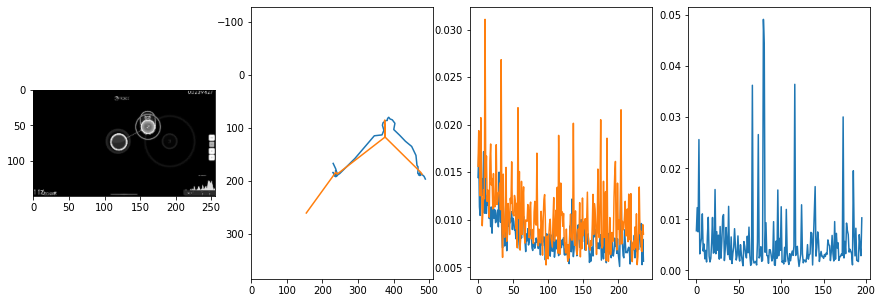


 243 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.89it/s  0.0523                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007684977113967761
outliers: 52
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.40592098236083984 0.7697380781173706
gt: 0.3203125 0.5572916865348816
(97, 82)


<Figure size 1080x360 with 0 Axes>

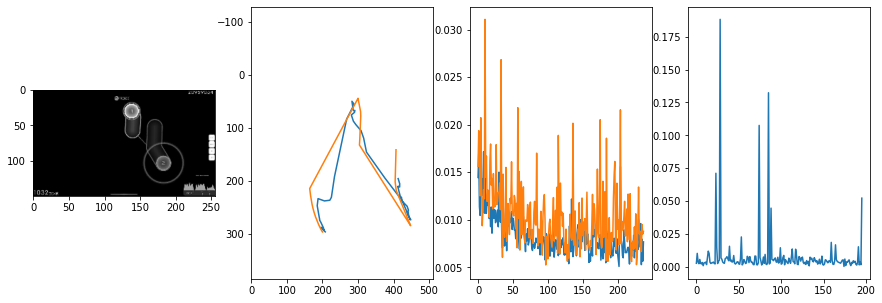


 244 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.09it/s  0.0037                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006523327470747564
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0206                                    
pred: 0.6285302042961121 0.5332173705101013
gt: 0.4722594618797302 0.726466178894043
(121, 102)


<Figure size 1080x360 with 0 Axes>

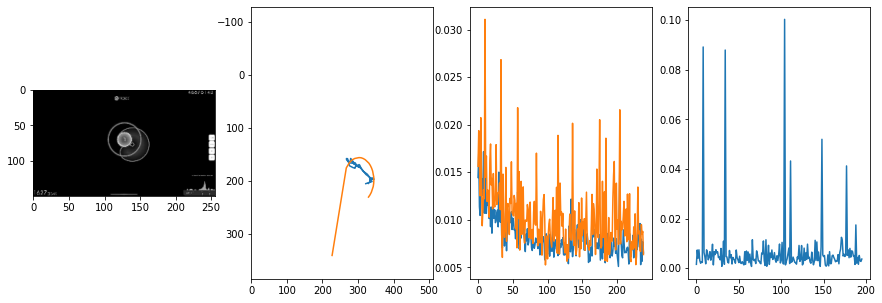


 245 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.99it/s  0.0034                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007066265308376573
outliers: 32
retrain: 8                 
val: 50/50 loss: 0.0033                                    
pred: 0.2214648425579071 0.19807730615139008
gt: 0.12783072888851166 0.3792243003845215
(67, 62)


<Figure size 1080x360 with 0 Axes>

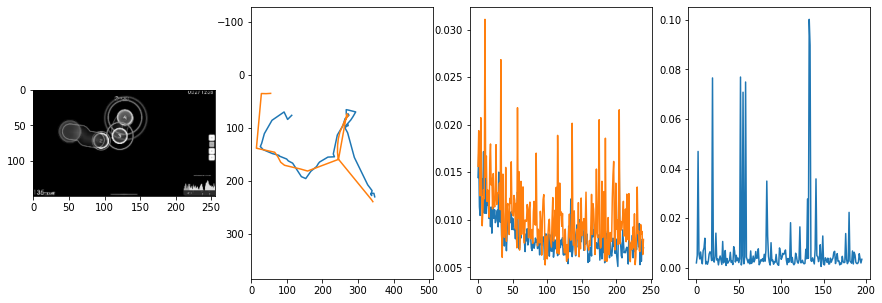


 246 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.06it/s  0.0139                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007686707907182887
outliers: 27
retrain: 8                 
val: 50/50 loss: 0.0146                                    
pred: 0.728197455406189 0.5444529056549072
gt: 0.6367190480232239 0.15104204416275024
(146, 35)


<Figure size 1080x360 with 0 Axes>

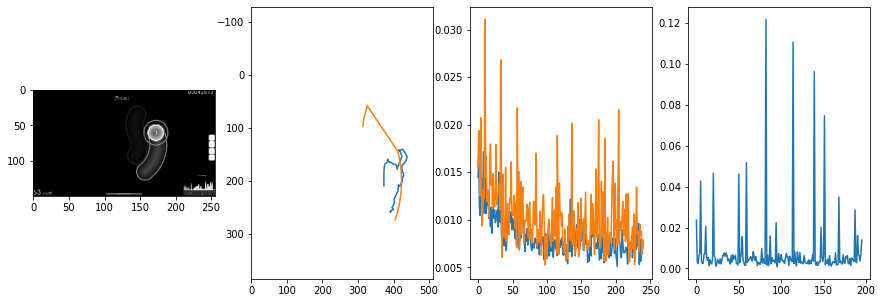


 247 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.10it/s  0.0080                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.005918558630248893
outliers: 20
retrain: 8                 
val: 50/50 loss: 0.0034                                    
pred: 0.5922877788543701 0.31996622681617737
gt: 0.5370160341262817 0.3578520715236664
(131, 59)


<Figure size 1080x360 with 0 Axes>

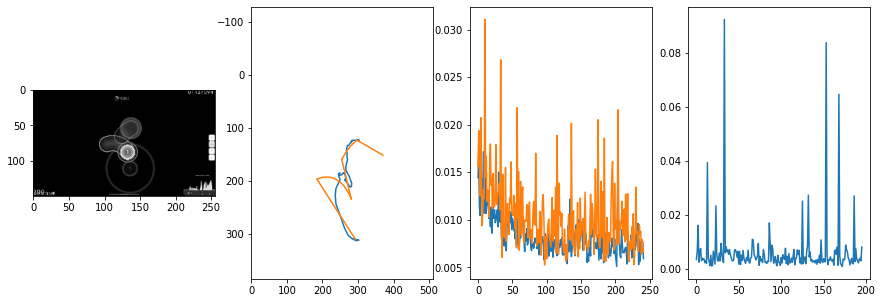


 248 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.98it/s  0.0123                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007129181659013052
outliers: 45
retrain: 8                 
val: 50/50 loss: 0.0085                                    
pred: 0.2700498700141907 0.8643627166748047
gt: 0.3227322995662689 0.7022478580474854
(98, 99)


<Figure size 1080x360 with 0 Axes>

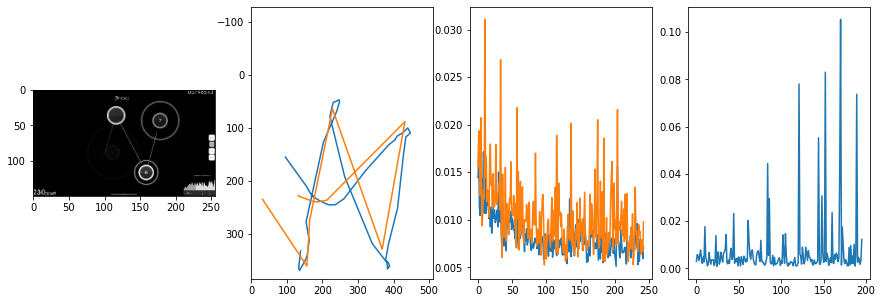


 249 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.40it/s  0.0095                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006322442456825675
outliers: 35
retrain: 8                 
val: 50/50 loss: 0.0035                                    
pred: 0.36619359254837036 0.5019220113754272
gt: 0.134770929813385 0.6510381102561951
(68, 93)


<Figure size 1080x360 with 0 Axes>

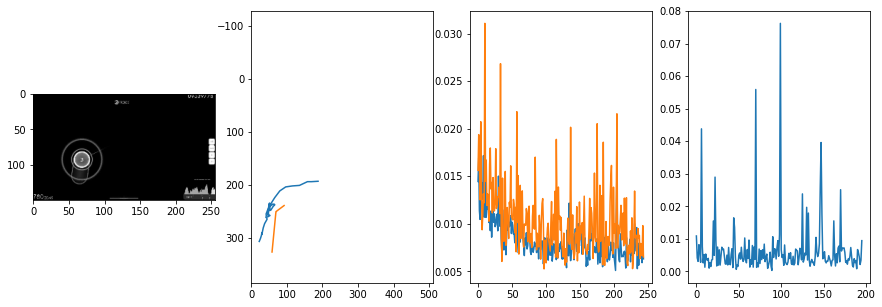


 250 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.18it/s  0.0038                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008919425311971133
outliers: 44
retrain: 8                 
val: 50/50 loss: 0.0057                                    
pred: 0.41728848218917847 0.4843635857105255
gt: 0.75 0.4270833432674408
(164, 67)


<Figure size 1080x360 with 0 Axes>

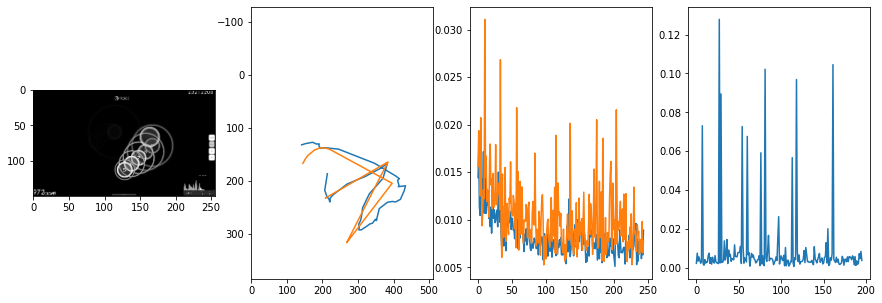


 251 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.80it/s  0.0085                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007191663695563448
outliers: 13
retrain: 8                 
val: 50/50 loss: 0.0039                                    
pred: 0.3198675811290741 0.23139573633670807
gt: 0.2654949128627777 0.34378793835639954
(89, 57)


<Figure size 1080x360 with 0 Axes>

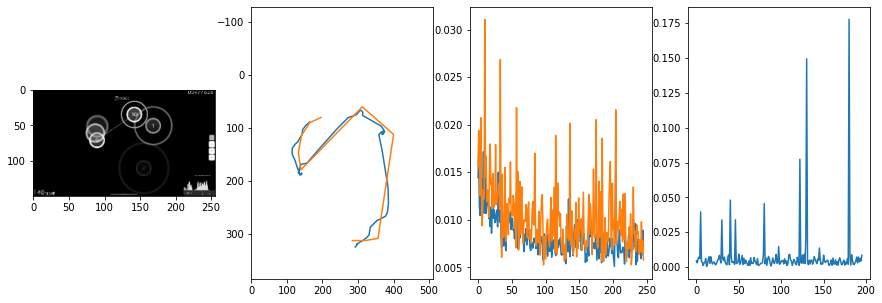


 252 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.81it/s  0.0044                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.0063456988855436144
outliers: 31
retrain: 8                 
val: 50/50 loss: 0.0049                                    
pred: 0.3541281223297119 0.7318260669708252
gt: 0.3965679407119751 0.6067264676094055
(109, 88)


<Figure size 1080x360 with 0 Axes>

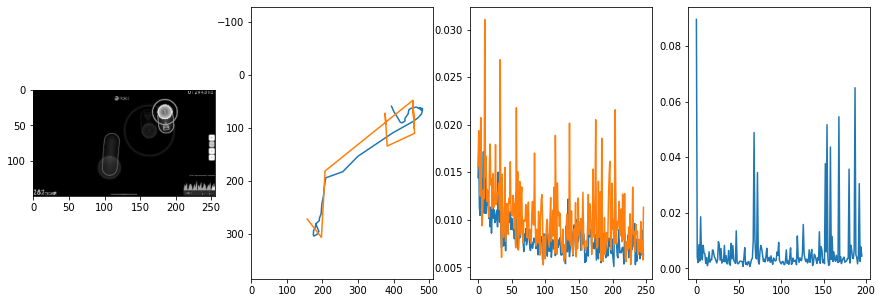


 253 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.28it/s  0.0030                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007722438191899991
outliers: 38
retrain: 8                 
val: 50/50 loss: 0.0043                                    
pred: 0.5652638673782349 0.6563957929611206
gt: 0.5723089575767517 0.7578287124633789
(136, 106)


<Figure size 1080x360 with 0 Axes>

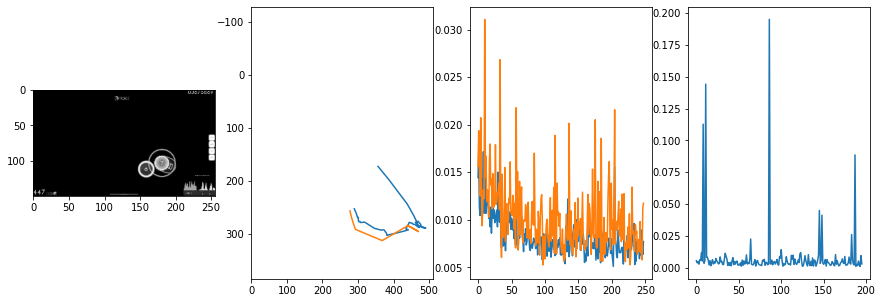


 254 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.97it/s  0.0565                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007246627755063985
outliers: 29
retrain: 8                 
val: 50/50 loss: 0.0094                                    
pred: 0.7157849073410034 0.8984448909759521
gt: 0.7868652939796448 0.8361191749572754
(170, 115)


<Figure size 1080x360 with 0 Axes>

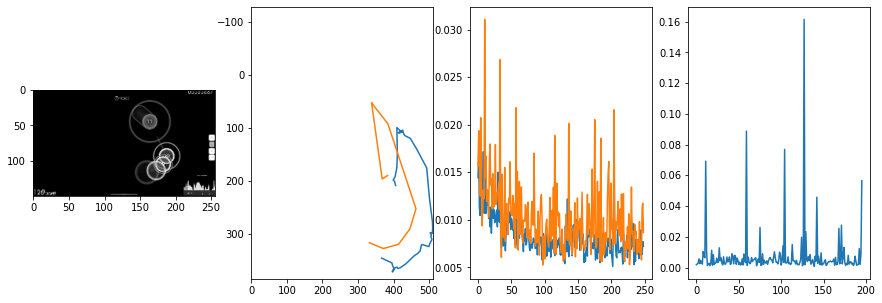


 255 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.16it/s  0.0055                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006012819210846661
outliers: 26
retrain: 8                 
val: 50/50 loss: 0.0071                                    
pred: 0.8338167071342468 0.3726962208747864
gt: 0.8743438720703125 0.3363606631755829
(183, 57)


<Figure size 1080x360 with 0 Axes>

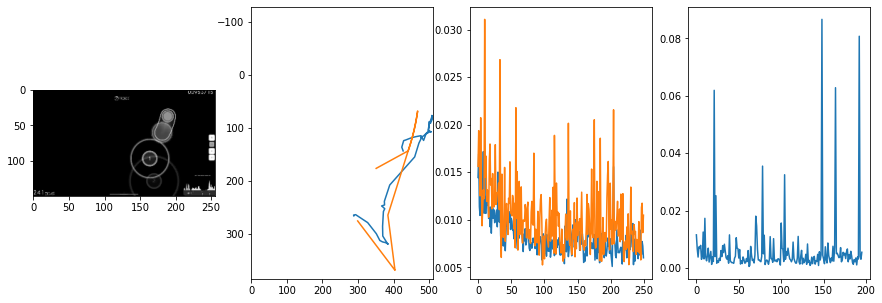


 256 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.90it/s  0.0035                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.007105058336473659
outliers: 46
retrain: 8                 
val: 50/50 loss: 0.0022                                    
pred: 0.2923058569431305 0.2801174521446228
gt: 0.19369405508041382 0.15479330718517303
(78, 36)


<Figure size 1080x360 with 0 Axes>

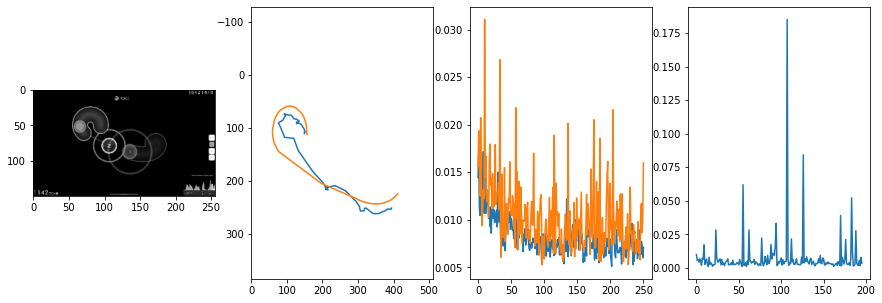


 257 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.14it/s  0.0017                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006850824226065163
outliers: 28
retrain: 8                 
val: 50/50 loss: 0.0072                                    
pred: 0.2811429500579834 0.649467408657074
gt: 0.578125 0.625
(137, 90)


<Figure size 1080x360 with 0 Axes>

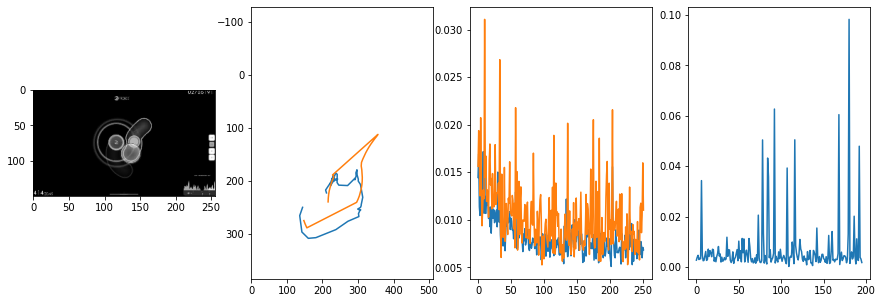


 258 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.24it/s  0.0041                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008396935016059374
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0110                                    
pred: 0.7780617475509644 0.5628516674041748
gt: 0.8359375 0.5
(177, 76)


<Figure size 1080x360 with 0 Axes>

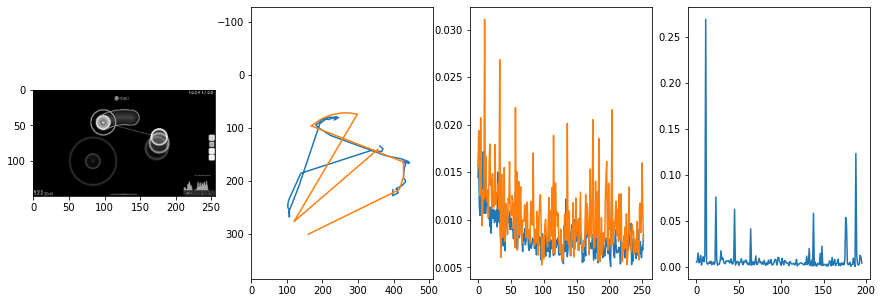


 259 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.09it/s  0.0039                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006978250633122171
outliers: 21
retrain: 8                 
val: 50/50 loss: 0.0121                                    
pred: 1.0151293277740479 0.2245144248008728
gt: 0.75 0.5520833730697632
(164, 82)


<Figure size 1080x360 with 0 Axes>

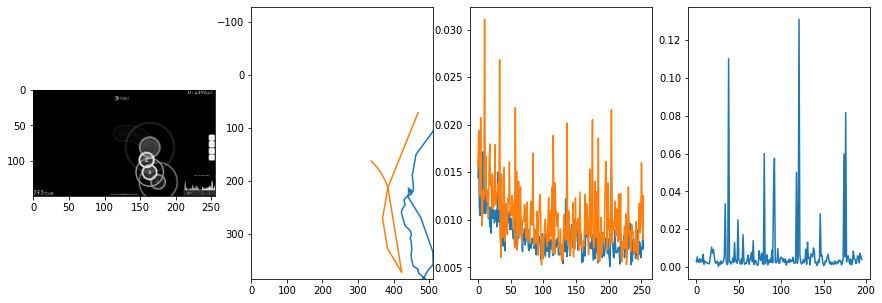


 260 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:13<00:00:00  14.03it/s  0.0304                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.008577939470676345
outliers: 42
retrain: 8                 
val: 50/50 loss: 0.0037                                    
pred: 0.37359070777893066 0.5253617763519287
gt: 0.4509440064430237 0.8017795085906982
(117, 111)


<Figure size 1080x360 with 0 Axes>

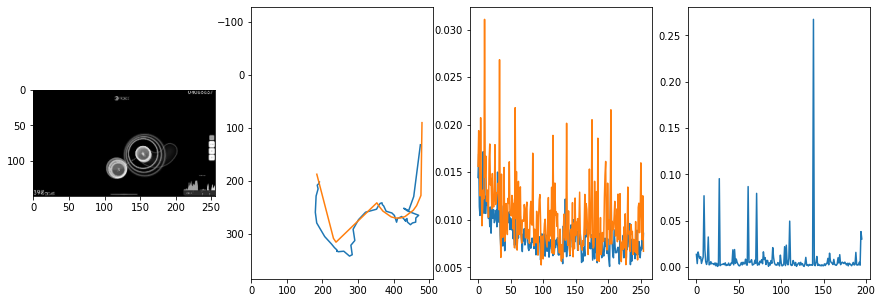


 261 of 262


  Iters     Elapsed Time       Speed     loss                                   
 196/196  00:00:14<00:00:00  13.92it/s  0.0028                                  

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

avg: 0.006467125293093719
outliers: 23
retrain: 8                 
val: 50/50 loss: 0.0016                                    
pred: 0.5473250150680542 0.507793128490448
gt: 0.640627920627594 0.5208331942558289
(147, 78)


<Figure size 1080x360 with 0 Axes>

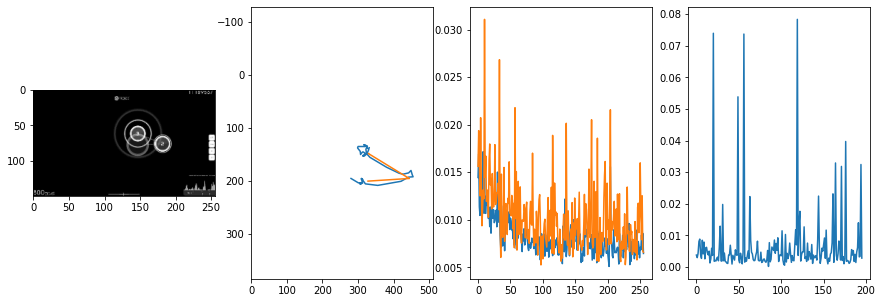


 262 of 262
2469.585103034973 secs


In [24]:
start = time.time()

epochs = 128
loss_thresh = 0.0003
rnum_min = 8
trainVNRecurse()

end = time.time()
print(end - start, 'secs')

In [25]:
print(best_loss)
torch.save(best_weights, model_path + str(epoch_cum) + '.pt')

0.005262738533783704


# Test Model

In [22]:
import os
import cv2
import torch
import torchvision.transforms as transforms

In [25]:
vn.load_state_dict(torch.load(model_path + str(88) + '.pt'))

<All keys matched successfully>

In [26]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
#osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
#osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'
#osud = '../demo/beatmaps/835194 Mili - Vulnerability'
#osuf = 'Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu'
#osud = '../demo/beatmaps/653534 Panda Eyes - ILY'
#osuf = 'Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu'
osud = '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun'
osuf = 'Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu'

In [27]:
osr = OSR(osud, osuf, sample_rate=sample_rate, hop_size=hop_size, hidden=True, vtmp='../demo/vids/')

In [28]:
osr.queue_vid()

'../demo/vids/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osuhdn.avi'

In [29]:
video_path = os.path.join('../demo/vids/', osuf + '.avi')

In [30]:
vn.to(device)
vn.init_hidden(1)
vn.eval()

VN(
  (convB1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convC1): Conv2d(4, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPC1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(19456, 256, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=256, out_features=256, bias=True)
  (linearB): Linear(in_features=256, out_features=32, bias=True)
  (linearC): Linear(in_features=32, out_features=2, bias=True)
)

In [31]:
start = time.time()

transform = transforms.ToTensor()
frames = []
vc = cv2.VideoCapture(video_path)
p = []
while True:
    r, f = vc.read()
    if r is False:
        break
    f = cv2.resize(f, (0,0), fx=scale, fy=scale)
    f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    F = transform(f).to(device)
    with torch.no_grad():
        P = vn(F.unsqueeze(0).unsqueeze(0))
    p.append(P.squeeze(0).squeeze(0).cpu().detach().numpy())
    
end = time.time()
print(end - start, 'secs')

8.419228315353394 secs


In [32]:
np.save('predVN.npy', p)

# Create Replay Video

In [33]:
from IPython.display import Video

In [34]:
eosud = osud.replace('/', '\/')

In [35]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosud\/$osuf\",/" data.json
!sed -i "s/Output path.*/Output path\": \"videoVN.mp4\",/" data.json

In [36]:
!python create_replayVN.py predVN.npy 50

2022-04-10 11:41:59,184:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-10 11:41:59,184:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'videoVN.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7fc56b3ab550>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb'

In [37]:
Video("videoVN.mp4")

In [84]:
!sed -i "s/Output path.*/Output path\": \"video.mp4\",/" data.json

In [85]:
!python create_replay.py predHN.npy predVN.npy 50 0.5

2022-04-09 22:00:10,213:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-09 22:00:10,213:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/653534 Panda Eyes - ILY/Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'video.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f721b89b640>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb': [200, 214, 229], 'Alpha': 0

In [70]:
Video("video.mp4")